#### Ski Resort Project University of Zürich 2020
## The test notebook for case5_Les Diablerets_1340m_ 1200-3200 m
## setup 1: 9000 experiments 200 scenarios & 45 Policies

This notebook is used for the visualization of the "ema_workbench Ski_Resort" project. The outputs of ema_workbench experiments which have been saved after executing the python codes (XLR_Framework.py) are loaded and various visualization techniques are used and maps are produced.

### *Reading the libraries*

Main libraries are imported here, although there a few libraries that are imported later.

In [4]:
import os
import os.path
import random
from operator import add
from datetime import datetime, date, timedelta

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

import shutil
import ema_workbench
import time

from scipy.integrate import simps
from numpy import trapz
from decimal import Decimal, ROUND_DOWN, ROUND_UP

### *Seting up the display extent*

In [5]:
pd.set_option('display.max_columns',69)
pd.set_option('display.max_rows',119)

## XLRM Framework

## Step 5: Model deployment

### Loading the outputs

In this section using the load_results class of ema_workbench we load the saved results of python experiments (.tar.gz)

In [6]:
from ema_workbench import load_results, ema_logging
from ema_workbench.analysis.pairs_plotting import (pairs_lines, pairs_scatter,
                                                   pairs_density)
ema_logging.log_to_stderr(level=ema_logging.DEFAULT_LEVEL)

# load the data
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case1_sattel-hochstuckli\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case2_Atzmaening\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case3_hoch-ybrig\setup1'
root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1339\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1822\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2000\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2500\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case5_champex\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b1564\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2141\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2584\setup1'

rootOut = os.path.join(root, 'Results_3')
fh = os.path.join(rootOut, '9000_runs.tar.gz')
experiments, outcomes = load_results(fh)

[MainProcess/INFO] results loaded succesfully from C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1339\setup1\Results_3\9000_runs.tar.gz


Check and see if data has been loaded properly or not?

12 parameters:

X2fM, X3iPot, X5temp, X6tempArt, Xfactor1, xClimateModel, xRCP, x1SnowThershold, xGoodDays, scenario, policy, model

In [7]:
print(experiments.shape)
print(list(experiments.keys()))
print(list(outcomes.keys()))

(9000, 12)
['X2fM', 'X3iPot', 'X5temp', 'X6tempArt', 'Xfactor1', 'xClimateModel', 'xRCP', 'x1SnowThershold', 'xGoodDays', 'scenario', 'policy', 'model']
['S_Ave_GoodDay', 'GCM_RCM', 'S_GoodDay', 'S_Ave_ArtSnow', 'S_Ave_Financial', 'S_Ave_Likelihood', 'tipping_points']


#### S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm) 
#### GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)
#### Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)
#### S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)
#### S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort
#### S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points
#### tipping_points: Number of tipping points (1981-2100)

## Step 6: Visualization of the EMA_Workbench Results

 the analysis package of ema_workbench contains a wide range of techniques for visualization and analysis of the results from series of computational experiments. 

### Visualization with ema-workbench - part1

### Pairwise Scatter Plot

[MainProcess/DEBUG] generating pairwise scatter plot


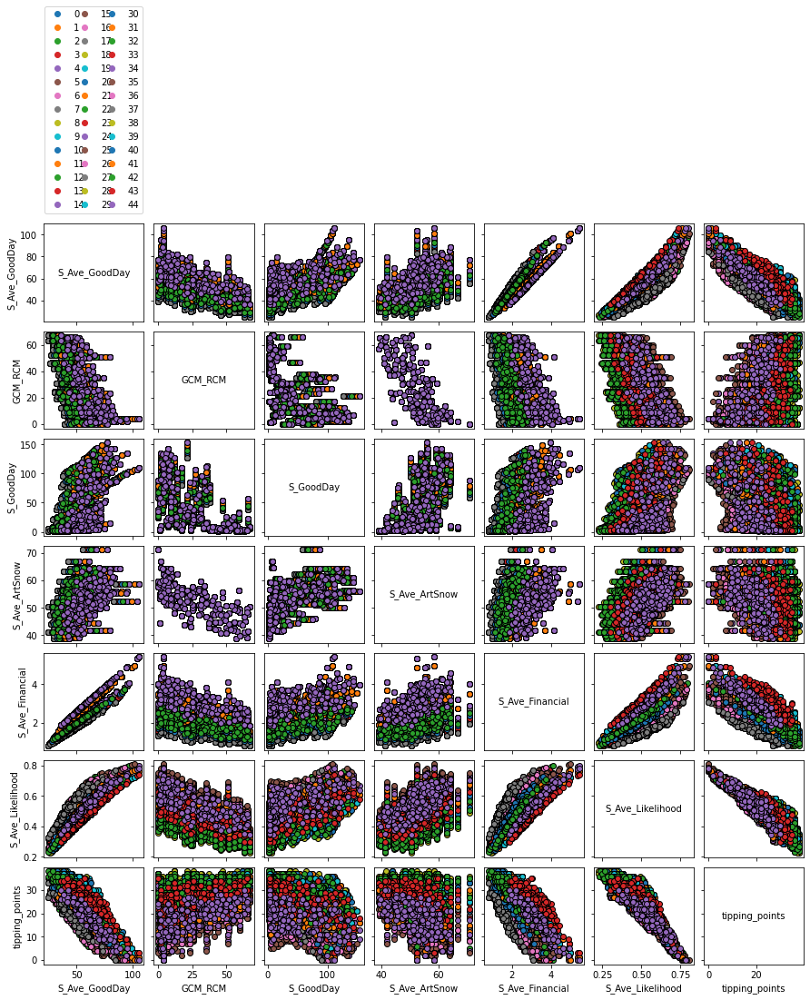

In [8]:
from ema_workbench.analysis import pairs_plotting
fig, axes = pairs_plotting.pairs_scatter(experiments, outcomes, group_by='policy',
                                         legend=True)
fig.set_size_inches(15, 15)

fig.savefig(os.path.join(rootOut, 'SA_All_outputs.svg'), format='svg', dpi=600)
#fig.savefig(os.path.join(rootOut, 'SA_All_outputs.tiff'), format='tiff', dpi=600)


plt.show()

In [12]:
outcomes2 = outcomes
outcomes2 = outcomes2.pop('GCM_RCM')

KeyError: 'GCM_RCM'

In [13]:
print(outcomes2)

{'S_Ave_GoodDay': array([62.48646292, 36.3129096 , 66.42409816, ..., 54.26406186,
       88.63362119, 46.54642246]), 'S_GoodDay': array([[ 55.96254167, 103.94029167,  19.350875  , ...,  18.79670833,
         50.56654167,  19.831625  ],
       [ 29.992125  ,  35.84341667, 121.18695833, ...,   1.57975   ,
          3.06458333,   4.534125  ],
       [ 87.14158333, 108.118125  ,  93.26354167, ..., 149.975875  ,
         74.223625  ,  44.81358333],
       ...,
       [ 52.61045   ,  67.6814    ,   7.90425   , ...,  99.57405   ,
         46.31      ,  43.04085   ],
       [ 48.84035   ,  91.3964    , 158.2406    , ...,  39.0991    ,
        148.09805   , 115.5126    ],
       [ 44.58555   ,  63.176     , 111.0077    , ...,   6.9794    ,
         65.6976    ,  22.96005   ]]), 'S_Ave_ArtSnow': array([53.38042373, 47.78322034, 55.00525424, ..., 53.26449153,
       64.35745763, 50.92415254]), 'S_Ave_Financial': array([2.68347458, 1.54338983, 2.84262712, ..., 2.82432203, 4.57288136,
       2.4090

In [14]:
new_dict = {key:val for key, val in outcomes2.items() if key != 'GCM_RCM'} 

In [15]:
print(list(new_dict.keys()))

['S_Ave_GoodDay', 'S_GoodDay', 'S_Ave_ArtSnow', 'S_Ave_Financial', 'S_Ave_Likelihood', 'tipping_points']


[MainProcess/DEBUG] generating pairwise scatter plot
No handles with labels found to put in legend.


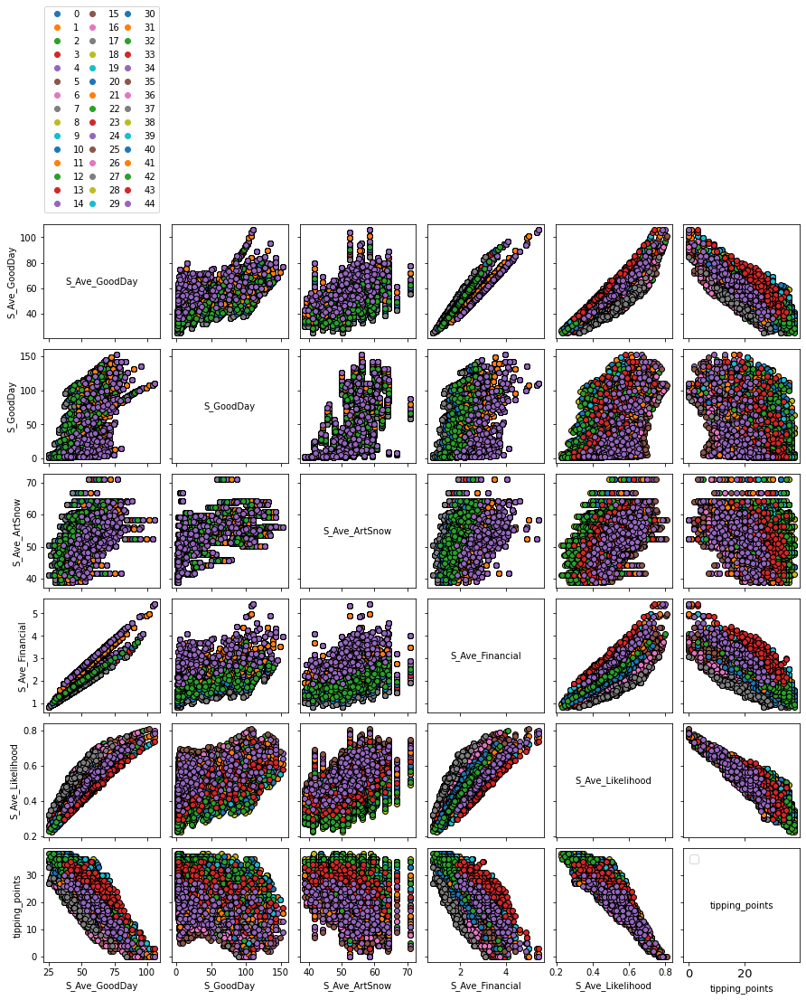

In [16]:
from ema_workbench.analysis import pairs_plotting
fig, axes = pairs_plotting.pairs_scatter(experiments, new_dict, group_by='policy',
                                         legend=True)

plt.yticks(fontsize=13)
plt.xticks(fontsize=13)
plt.legend(fontsize=13)

fig.set_size_inches(15, 15)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2.svg'), format='svg', dpi=300)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2.tiff'), format='tiff', dpi=300)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2_2.tiff'), format='tiff', dpi=150)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2_2.jpg'), format='jpg', dpi=150)



plt.show()

### Moving the outputs to the folder of results
### Assign the address of outputs folders

In [17]:
import tarfile

shutil.move(os.path.join(root, 'Outputs_py'), os.path.join(rootOut, 'Outputs_py'))
shutil.move(os.path.join(root, 'outSeason'), os.path.join(rootOut, 'outSeason')) 
shutil.move(os.path.join(root, 'outSeason_Likelihood_survival'), os.path.join(rootOut, 'outSeason_Likelihood_survival')) 
shutil.move(os.path.join(root, 'outSeasonArt'), os.path.join(rootOut, 'outSeasonArt')) 
shutil.move(os.path.join(root, 'outSeasonFinancial'), os.path.join(rootOut, 'outSeasonFinancial')) 

rootVisualization = rootOut
with tarfile.open(os.path.join(rootVisualization, '9000_runs.tar.gz'),"r") as zip_ref:
    zip_ref.extractall(os.path.join(rootVisualization, '9000_runs'))

# We have five types of outputs
outDaily = os.path.join(rootVisualization, 'Outputs_py')
outSeasonTippingPoint = os.path.join(rootVisualization, 'outSeason')
outSeason_Likelihood_survival = os.path.join(rootVisualization, 'outSeason_Likelihood_survival')
outSeasonArtificialSnowPossibility = os.path.join(rootVisualization, 'outSeasonArt')
outSeasonFinancial = os.path.join(rootVisualization, 'outSeasonFinancial')
out_ema = os.path.join(rootVisualization, '9000_runs')

In [18]:
df4_ema_experiment = pd.read_csv(os.path.join(out_ema, 'experiments.csv'))
df4_ema_y = pd.read_csv(os.path.join(out_ema, 'S_Ave_GoodDay.csv'), header=None)
df4_ema_y.columns = ["Yout"]
df4_ema_y1 = pd.read_csv(os.path.join(out_ema, 'GCM_RCM.csv'), header=None)
df4_ema_y1.columns = ["Yout1"]
df4_ema_y3 = pd.read_csv(os.path.join(out_ema, 'S_GoodDay.csv'), header=None)
df4_ema_y3.columns = ["Yout3" + "_" + str(i) for i in range(118)]
df4_ema_y4 = pd.read_csv(os.path.join(out_ema, 'S_Ave_ArtSnow.csv'), header=None)
df4_ema_y4.columns = ["Yout4"]
df4_ema_y5 = pd.read_csv(os.path.join(out_ema, 'S_Ave_Financial.csv'), header=None)
df4_ema_y5.columns = ["Yout5"]
df4_ema_y6 = pd.read_csv(os.path.join(out_ema, 'S_Ave_Likelihood.csv'), header=None)
df4_ema_y6.columns = ["Yout6"]
df4_ema_y7 = pd.read_csv(os.path.join(out_ema, 'tipping_points.csv'), header=None)
df4_ema_y7.columns = ["Yout7"]

#### Make a database from the outputs of ema framework by concatinating the every output and experiments table

In [19]:
df_final_ema = pd.concat((df4_ema_experiment, df4_ema_y, df4_ema_y1, df4_ema_y3, df4_ema_y4, df4_ema_y5, df4_ema_y6, df4_ema_y7 ), axis = 1)
df_final_ema.head()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
0,1.250685,1087.727193,5.727369,-1.693444,2.844352,0.673825,1.0,240.0,100.0,0,0,UZHModel,62.486463,7,55.962542,103.940292,19.350875,42.421250,31.437458,32.793292,122.454333,33.849250,47.272083,54.572958,136.294417,72.626708,103.393125,121.212500,47.650625,89.575292,121.960333,64.852625,43.997917,17.338042,...,93.801125,56.337833,17.169625,89.107708,74.109000,121.958792,65.714500,26.063750,27.131333,57.265583,88.048167,68.163167,35.107208,106.364208,40.613708,48.754500,29.708500,23.493250,54.752958,16.203542,70.417875,24.864958,13.543833,108.353000,36.442250,87.635667,104.441583,18.796708,50.566542,19.831625,53.380424,2.683475,0.503633,27.0
1,1.352533,1037.680312,4.585490,-1.355050,2.996305,0.235785,3.0,240.0,100.0,1,0,UZHModel,36.312910,43,29.992125,35.843417,121.186958,63.723375,79.751583,107.348542,51.066208,66.675625,109.718458,62.590708,92.605250,63.647917,109.950292,45.456667,27.712292,52.406167,35.738250,69.410542,46.525458,123.897917,...,2.886542,14.467000,3.361708,14.838458,7.610708,4.563125,8.354208,27.907792,20.199042,6.302833,2.481958,21.870958,5.516125,3.900917,5.201375,11.046250,6.886000,4.209958,7.577458,2.055333,3.322792,9.247458,1.775792,73.117792,2.945167,2.643208,7.791167,1.579750,3.064583,4.534125,47.783220,1.543390,0.299043,33.0
2,1.572054,1029.558703,5.605319,-1.171834,1.390144,0.070671,1.0,240.0,100.0,2,0,UZHModel,66.424098,1,87.141583,108.118125,93.263542,37.971292,149.744958,102.905333,127.865500,65.134083,74.499958,34.170583,116.369917,118.674458,106.416167,95.997292,58.277125,117.584458,100.145792,126.865417,55.218708,84.839583,...,47.957792,63.906000,23.155167,24.449167,26.427167,52.362083,134.884583,36.978333,58.754708,23.377250,6.857917,86.145583,16.120542,30.948500,53.289917,102.652583,32.299000,29.536625,35.331375,14.232542,37.214792,83.746667,34.091125,66.006708,77.850875,84.867542,23.616750,149.975875,74.223625,44.813583,55.005254,2.842627,0.531171,24.0
3,1.358586,1063.437386,5.451759,-1.973331,3.320044,0.220486,2.0,240.0,100.0,3,0,UZHModel,55.534072,17,37.285333,79.355333,164.444000,84.367500,81.692458,117.197750,137.166542,30.559083,96.669500,115.092708,43.790542,145.823042,48.323708,51.065875,89.439250,124.340833,82.011083,88.561083,39.063958,21.122042,...,12.678375,38.327958,19.544000,22.632250,16.864292,27.558875,57.913042,58.045208,9.816083,3.120625,18.850375,37.830417,37.084083,42.187542,31.012458,26.916958,33.648875,31.162208,22.075750,63.804292,59.089542,46.313208,15.175542,37.477583,35.317667,34.001583,40.264667,35.683667,17.098958,2.803000,46.972712,2.360424,0.445850,27.0
4,1.529336,975.715272,5.223552,-1.406489,1.025620,0.109410,2.0,240.0,100.0,4,0,UZHModel,66.848388,14,58.700750,77.654667,117.549458,48.231792,46.806458,56.693083,125.564750,73.137042,119.398583,135.527292,52.324667,113.009375,68.230792,124.562208,53.238875,121.586500,78.341375,64.050542,24.328250,27.118750,...,15.997792,59.212125,35.486917,35.959042,5.723833,38.280167,91.465125,51.879500,11.708833,137.845083,35.664625,51.983667,58.066375,23.642958,72.821167,93.999708,60.782875,37.084208,39.915625,18.113833,105.723958,67.595042,42.304375,69.014583,40.922458,69.751417,15.000458,18.159917,81.693458,75.625542,57.700339,2.871525,0.525486,22.0


In [20]:
df_final_ema.to_csv(os.path.join(rootVisualization, 'df_final_ema.csv'), index = False)

In [21]:
# Taking the values
x2 = df_final_ema['X2fM'].values
x3 = df_final_ema['X3iPot'].values
x5 = df_final_ema['X5temp'].values
x6 = df_final_ema['X6tempArt'].values
xRCP = df_final_ema['xRCP'].values
xClimateModel = df_final_ema['xClimateModel'].values
x1SnowThershold = df_final_ema['x1SnowThershold'].values
xGoodDays = df_final_ema['xGoodDays'].values

YY = df_final_ema['Yout'].values
y1 = df_final_ema['Yout1'].values
y3 = df_final_ema['Yout3_95'].values
y4 = df_final_ema['Yout4'].values
y5 = df_final_ema['Yout5'].values
y6 = df_final_ema['Yout6'].values
y7 = df_final_ema['Yout7'].values

In [22]:
outFolder = rootVisualization
outSeasonFolder = os.path.join(outFolder, 'outSeason')
outSeasonFinancial = os.path.join(outFolder, 'outSeasonFinancial')
outSeasonArt = os.path.join(outFolder, 'outSeasonArt')
outSeason_Likelihood_survival = os.path.join(outFolder, 'outSeason_Likelihood_survival')

In [23]:
#### 2020/07/22 ####
all_Files = []
for filename in os.walk(outSeasonFolder):
    all_Files = filename[2]
    
totalFiles_loc = []
for i in range(len(all_Files)):
    totalFiles_loc.append(os.path.join(outSeasonFolder, all_Files[i]))
    
### 2020/08/23
all_Files_fin = []
for filename in os.walk(outSeasonFinancial):
    all_Files_fin = filename[2]
    
totalFiles_loc_fin = []
for i in range(len(all_Files_fin)):
    totalFiles_loc_fin.append(os.path.join(outSeasonFinancial, all_Files_fin[i]))
    
### 2020/08/23
all_Files_Art = []
for filename in os.walk(outSeasonArt):
    all_Files_Art = filename[2]
    
totalFiles_loc_Art = []
for i in range(len(all_Files_Art)):
    totalFiles_loc_Art.append(os.path.join(outSeasonArt, all_Files_Art[i]))

### 2020/08/23
all_Files_Like = []
for filename in os.walk(outSeason_Likelihood_survival):
    all_Files_Like = filename[2]
    
totalFiles_loc_Like = []
for i in range(len(all_Files_Like)):
    totalFiles_loc_Like.append(os.path.join(outSeason_Likelihood_survival, all_Files_Like[i]))


#### Total number of outputs (csv files) in each out folder produced by our framework

In [24]:
print(len(totalFiles_loc))
print(len(totalFiles_loc_fin))
print(len(totalFiles_loc_Art))
print(len(totalFiles_loc_Like))

9000
9000
9000
9000


In [25]:
emptyMatrixGoodDays = [np.empty([119, 69]) for _ in range(len(totalFiles_loc))]
    
for i in range(0, len(totalFiles_loc), 1):
    b = []
    with open(totalFiles_loc[i], 'r') as file:
        outputReaderlines = file.readlines()
        for j in range (len(outputReaderlines)):
            b.append(outputReaderlines[j].replace('\n','').split(','))
    
    emptyMatrixGoodDays[i] = np.array(b)

### 2020/08/23
emptyMatrixfin = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_fin))]

for i in range(0, len(totalFiles_loc_fin), 1):
    b = []
    with open(totalFiles_loc_fin[i], 'r') as file:
        outputReaderlines_fin = file.readlines()
        for j in range (len(outputReaderlines_fin)):
            b.append(outputReaderlines_fin[j].replace('\n','').split(','))
    
    emptyMatrixfin[i] = np.array(b)

### 2020/08/23
emptyMatrixArt = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Art))]

for i in range(0, len(totalFiles_loc_Art), 1):
    b = []
    with open(totalFiles_loc_Art[i], 'r') as file:
        outputReaderlines_Art = file.readlines()
        for j in range (len(outputReaderlines_Art)):
            b.append(outputReaderlines_Art[j].replace('\n','').split(','))
    
    emptyMatrixArt[i] = np.array(b)
    
### 2020/08/23
emptyMatrixLike = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Like))]

for i in range(0, len(totalFiles_loc_Like), 1):
    b = []
    with open(totalFiles_loc_Like[i], 'r') as file:
        outputReaderlines_Like = file.readlines()
        for j in range (len(outputReaderlines_Like)):
            b.append(outputReaderlines_Like[j].replace('\n','').split(','))
    
    emptyMatrixLike[i] = np.array(b)

In [26]:
#matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=2)
matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=0)
matrix_fin = np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1)), axis=0)
matrix_Art = np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1)), axis=0)
matrix_Like = np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1)), axis=0)

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\IPython\core\interactiveshell.py:3337: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  if (await self.run_code(code, result,  async_=asy)):


In [27]:
print(matrix_GoodDays.shape)
print(matrix_fin.shape)
print(matrix_Art.shape)
print(matrix_Like.shape)

(9000, 119, 2)
(9000, 119, 2)
(9000, 119, 2)
(9000, 119, 2)


#### Check the header of outputs

In [28]:
print(emptyMatrixGoodDays[1][0,1])
print(emptyMatrixfin[1][0,1])
print(emptyMatrixArt[1][0,1])
print(emptyMatrixLike[1][0,1])

isOverSnow_sc_85_7
Money_sc_85_7
ArtSnowPossibility_sc_85_7
isOverSnow_sc_85_7


In [29]:
matrix_GoodDays26= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP26' in emptyMatrixGoodDays[i][0,1] or \
                             '_26_' in emptyMatrixGoodDays[i][0,1] ) , axis=0) 
matrix_GoodDays45= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP45' in emptyMatrixGoodDays[i][0,1] or \
                            '_45_' in emptyMatrixGoodDays[i][0,1] ), axis=0)
matrix_GoodDays85= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP85' in emptyMatrixGoodDays[i][0,1] or \
                            '_85_' in emptyMatrixGoodDays[i][0,1]), axis=0) 

### 2020/08/23
matrix_fin26= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP26' in emptyMatrixfin[i][0,1] or \
                             '_26_' in emptyMatrixfin[i][0,1] ) , axis=0) 
matrix_fin45= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP45' in emptyMatrixfin[i][0,1] or \
                            '_45_' in emptyMatrixfin[i][0,1] ), axis=0)
matrix_fin85= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP85' in emptyMatrixfin[i][0,1] or \
                            '_85_' in emptyMatrixfin[i][0,1]), axis=0) 

### 2020/08/23
matrix_Art26= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP26' in emptyMatrixArt[i][0,1] or \
                             '_26_' in emptyMatrixArt[i][0,1] ) , axis=0) 
matrix_Art45= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP45' in emptyMatrixArt[i][0,1] or \
                            '_45_' in emptyMatrixArt[i][0,1] ), axis=0)
matrix_Art85= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP85' in emptyMatrixArt[i][0,1] or \
                            '_85_' in emptyMatrixArt[i][0,1]), axis=0) 

### 2020/08/23
matrix_Like26= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP26' in emptyMatrixLike[i][0,1] or \
                             '_26_' in emptyMatrixLike[i][0,1] ) , axis=0) 
matrix_Like45= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP45' in emptyMatrixLike[i][0,1] or \
                            '_45_' in emptyMatrixLike[i][0,1] ), axis=0)
matrix_Like85= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP85' in emptyMatrixLike[i][0,1] or \
                            '_85_' in emptyMatrixLike[i][0,1]), axis=0) 

In [30]:
print(type(matrix_GoodDays))
print(matrix_GoodDays.ndim)
print(len(matrix_GoodDays))
print(matrix_GoodDays.size)
print(matrix_GoodDays.dtype)
print(matrix_GoodDays.dtype.name)
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
print(matrix_Art26.shape)
print(matrix_Art45.shape)
print(matrix_Art85.shape)
print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

<class 'numpy.ndarray'>
3
9000
2142000
<U47
str1504
#########
(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
9000
#########
(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
9000
#########
(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
9000
#########
(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
9000


In [31]:
print(matrix_GoodDays[2, 1:, 1:2].shape)
print(matrix_fin[2, 1:, 1:2].shape)
print(matrix_Art[2, 1:, 1:2].shape)
print(matrix_Like[2, 1:, 1:2].shape)

(118, 1)
(118, 1)
(118, 1)
(118, 1)


### Calculate the quantiles for each year of simulation (1981-2100)

In [32]:
q10_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.9, axis=0)


In [33]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

print(q10_years_Art[0])
print(q25_years_Art[0])
print(q50_years_Art[0])
print(q75_years_Art[0])
print(q90_years_Art[0])
print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[24.28906]
[35.98242974]
[53.24956667]
[78.70860795]
[102.35123096]
(118, 1)
[0.88]
[1.41]
[2.185]
[3.3125]
[4.361]
(118, 1)
[43.694]
[50.2025]
[57.9]
[64.7025]
[73.265]
(118, 1)
[30.16454167]
[45.37466133]
[67.79885281]
[100.]
[100.]
(118, 1)


#### Set the parameters of making figure

In [34]:
num_Simulation = 9000
p_Step = 20
alpha_Fade = 0.04

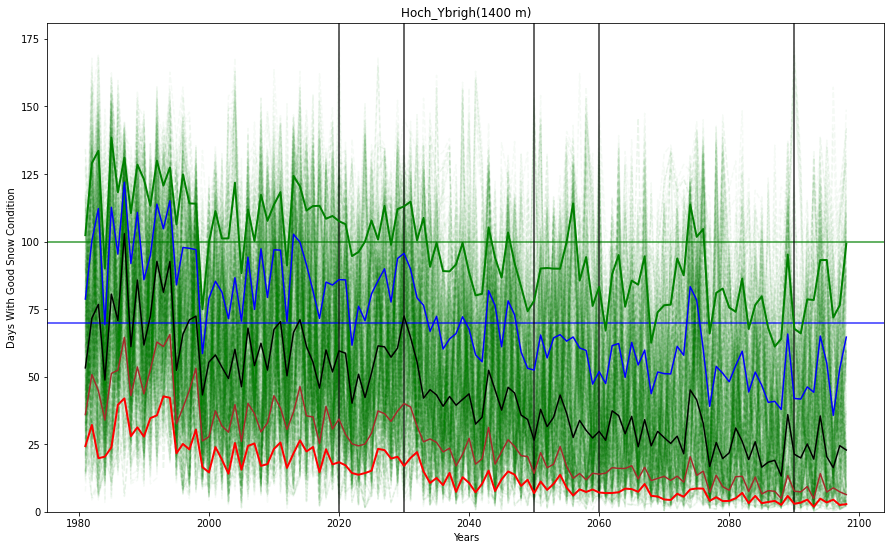

In [35]:
fig1, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_GoodDays[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=70, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=0, top =181)
axs.set_title('Hoch_Ybrigh(1400 m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig1.savefig(os.path.join(rootVisualization, 'RCP_All_number_of_day_goodSnow.svg'), format='svg', dpi=300)

plt.show()

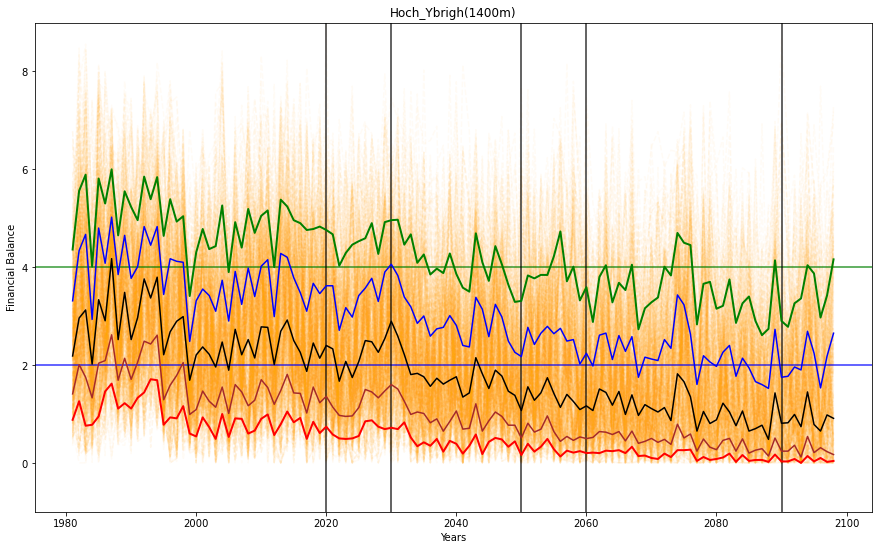

In [36]:
fig2, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_fin[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=4, color='green', alpha=0.8)
axs.axhline(y=2, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_fin, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_fin, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_fin, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_fin, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_fin, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =9)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Financial Balance')

fig2.savefig(os.path.join(rootVisualization, 'RCP_All_Financial.svg'), format='svg', dpi=300)

plt.show()

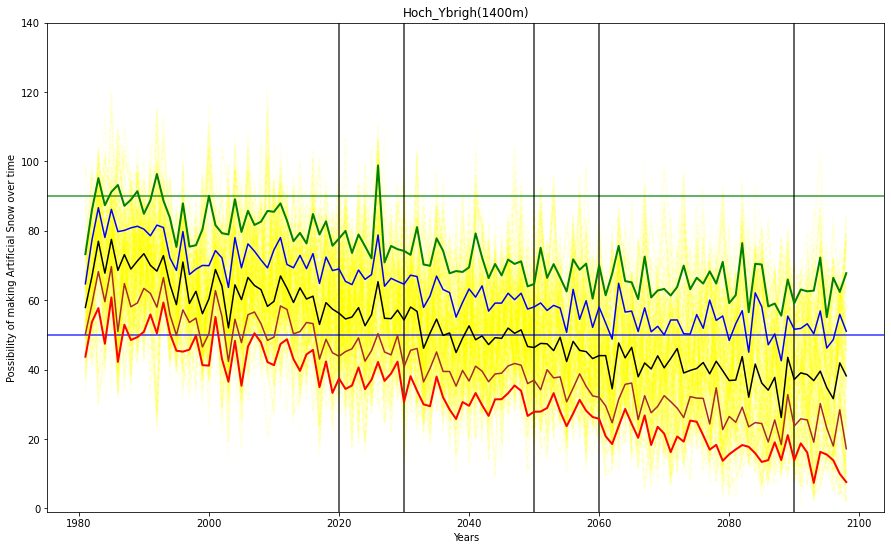

In [37]:
fig3, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_Art[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='yellow', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Art, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_Art, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_Art, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_Art, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_Art, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =140)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Possibility of making Artificial Snow over time')

fig3.savefig(os.path.join(rootVisualization, 'RCP_All_ArtSnow.svg'), format='svg', dpi=300)

plt.show()

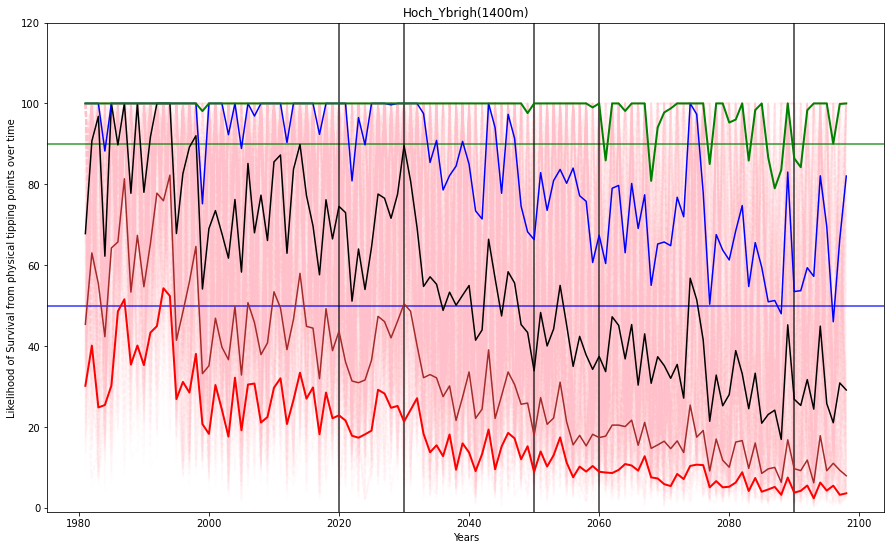

In [38]:
fig4, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_Like[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='pink', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Like, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_Like, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_Like, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_Like, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_Like, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =120)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Likelihood of Survival from physical tipping points over time')

fig4.savefig(os.path.join(rootVisualization, 'RCP_All_Likelihood.svg'), format='svg', dpi=300)

plt.show()

### Visualization with ema-workbench - part2 

## Scenario Discovery 
### A model driven approach to scenario development

There is ample literature on both CART and PRIM and their relative merits for use in scenario discovery.

S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)

Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)

S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort

S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points

tipping_points: Number of tipping points (1981-2100)

In [39]:
from ema_workbench.analysis import prim

x = experiments
y = outcomes['S_Ave_GoodDay'] < 50
prim_alg = prim.Prim(x, y, threshold=0.6)
box1 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 4665 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 1.0, mass: 0.19055555555555556, coverage: 0.36763129689174706, density: 1.0 restricted_dimensions: 3


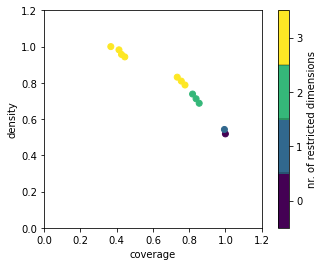

<Figure size 432x288 with 0 Axes>

In [40]:
#import mpld3
#fig, axs = plt.subplots()
#fig5, axs = plt.subplots(figsize=(15,9))
box1.show_tradeoff()
plt.show()
plt.savefig(os.path.join(rootVisualization, 'coverage_density_1.png'))
            
#mpld3.display()
#fig5.savefig(os.path.join(rootVisualization, 'box.svg'), format='svg', dpi=600)

coverage    0.412647
density     0.982143
id                10
mass        0.217778
mean        0.982143
res_dim            3
Name: 10, dtype: object

                                                            box 10  \
                                                               min   
X5temp                                                     4.50167   
xRCP                                                           2.5   
x1SnowThershold  {290.0, 260.0, 300.0, 270.0, 240.0, 280.0, 250...   

                                                                    \
                                                               max   
X5temp                                                     5.53433   
xRCP                                                             3   
x1SnowThershold  {290.0, 260.0, 300.0, 270.0, 240.0, 280.0, 250...   

                                                  
                                       qp values  
X5temp             [-1.0, 9.464187267646556e-

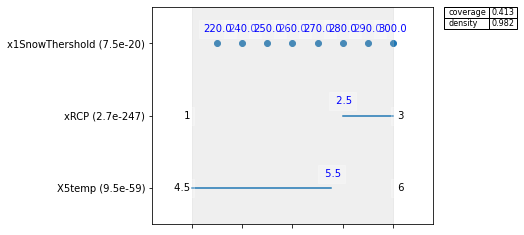

In [41]:
# Saeed : explore the inspect effect
box1.inspect(10)
box1.inspect(10, style='graph')
plt.show()

x1SnowThershold [290.0, 260.0, 300.0, 270.0, 240.0, 280.0, 250.0, 220.0, 200.0]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


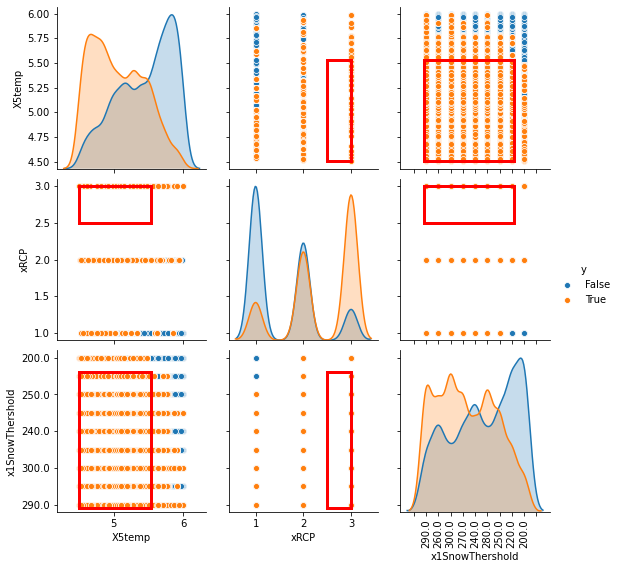

In [42]:
# fig, axs = plt.subplots()
axs1 = box1.show_pairs_scatter(10)
plt.show()
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_70.svg'), format='svg', dpi=600)
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_70.tiff'), format='tiff', dpi=300)
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_2_70.tiff'), format='tiff', dpi=150)

In [43]:
box2 = prim_alg.find_box()

[MainProcess/INFO] 7285 points remaining, containing 2950 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 0.8176100628930818, mass: 0.17666666666666667, coverage: 0.27867095391211144, density: 0.817610

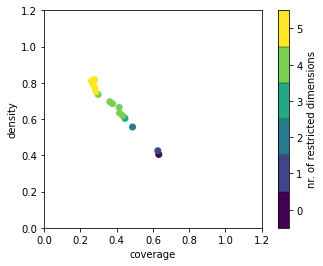

In [44]:
#import mpld3
box2.show_tradeoff()
plt.show()
#mpld3.display()
#fig.savefig(os.path.join(rootVisualization, 'box2.svg'), format='svg', dpi=600)

coverage    0.285102
density     0.751412
id                10
mass        0.196667
mean        0.751412
res_dim            5
Name: 10, dtype: object

                                                     box 10  \
                                                        min   
X5temp                                              4.50167   
X2fM                                                1.01113   
xRCP                                                    1.5   
x1SnowThershold  {290.0, 260.0, 300.0, 270.0, 280.0, 250.0}   
Xfactor1                                           0.649611   

                                                             \
                                                        max   
X5temp                                              5.75468   
X2fM                                                1.57155   
xRCP                                                      3   
x1SnowThershold  {290.0, 260.0, 300.0, 270.0, 280.0, 250.0}   
Xfactor1                     

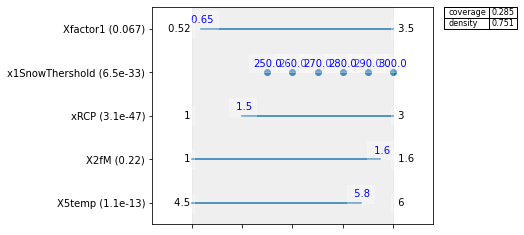

In [45]:
# Saeed : explore the inspect effect
box2.inspect(10)
box2.inspect(10, style='graph')
plt.show()

x1SnowThershold [290.0, 260.0, 300.0, 270.0, 280.0, 250.0, 200.0, 240.0, 220.0]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


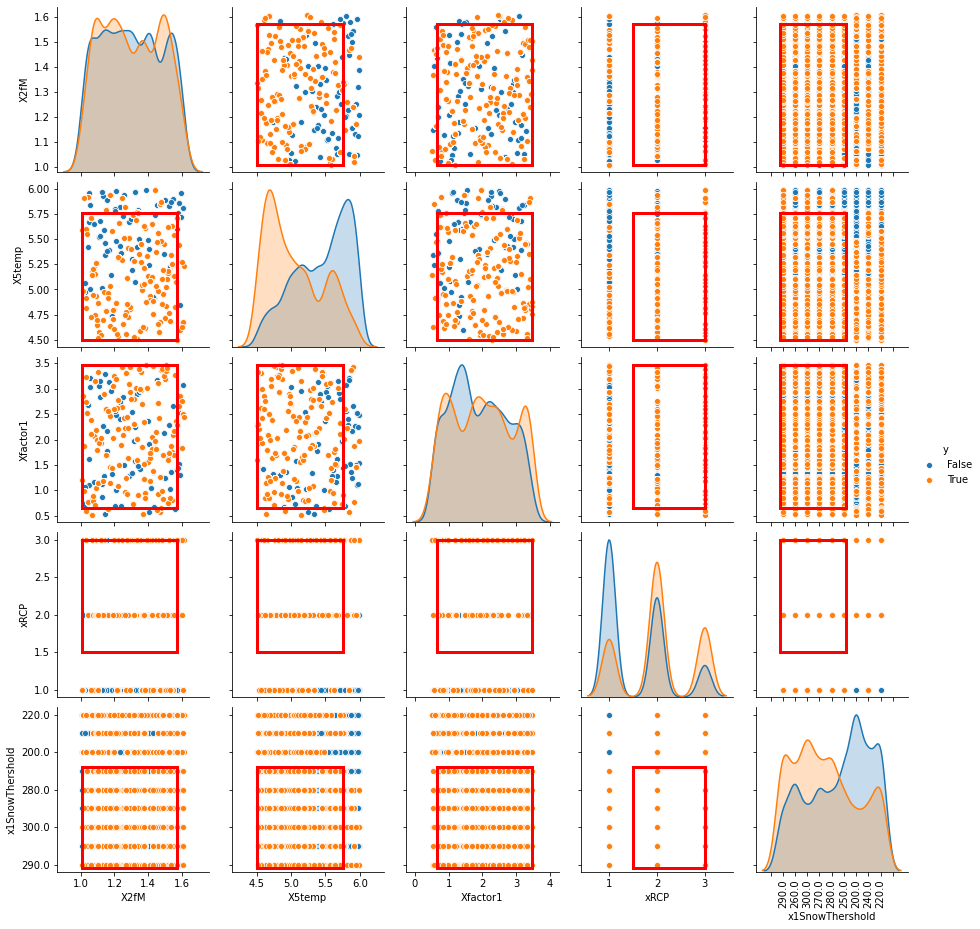

In [46]:
# fig, axs = plt.subplots()
axs2 = box2.show_pairs_scatter(10)
plt.show()
axs2.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_2_.svg'), format='svg', dpi=300)

### Artifical snow analysis

In [47]:
x = experiments
y = outcomes['S_Ave_ArtSnow'] < 50
prim_alg = prim.Prim(x, y, threshold=0.8)
box3 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 2970 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 1.0, mass: 0.215, coverage: 0.6515151515151515, density: 1.0 restricted_dimensions: 2


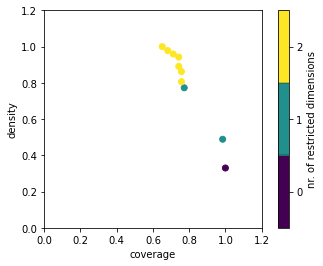

In [48]:
box3.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_Artificial.svg'), format='svg', dpi=600)

coverage    0.757576
density     0.862069
id                 4
mass            0.29
mean        0.862069
res_dim            2
Name: 4, dtype: object

              box 4                                         
                min       max                      qp values
X6tempArt -1.999609 -1.115978  [-1.0, 7.277427243165367e-31]
xRCP       2.500000  3.000000                    [0.0, -1.0]



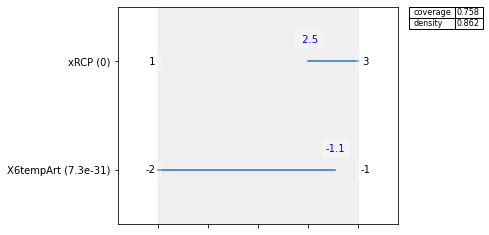

In [49]:
# Saeed : explore the inspect effect
box3.inspect(4)
box3.inspect(4, style='graph')
plt.show()

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


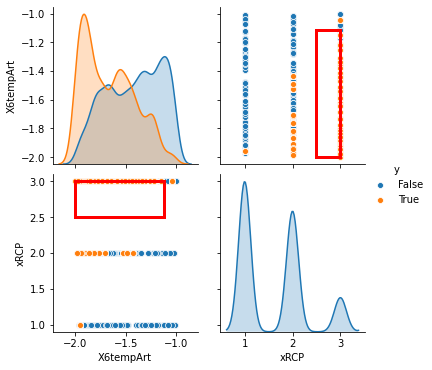

In [50]:
#fig, axs = plt.subplots()
axs4 = box3.show_pairs_scatter(4)
plt.show()
axs4.savefig(os.path.join(rootVisualization, 'multi_graphs_Artificial_40.svg'), format='tiff', dpi=300)

### Likelihood of Survival analysis

In [51]:
x = experiments
y = outcomes['S_Ave_Likelihood'] < 0.5
prim_alg = prim.Prim(x, y, threshold=0.7)
box4 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 5133 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 1.0, mass: 0.19844444444444445, coverage: 0.34794467173193067, density: 1.0 restricted_dimensions: 5


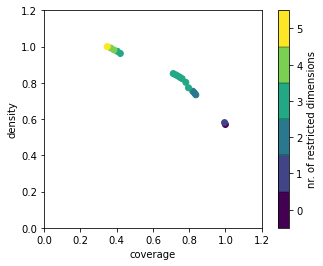

In [52]:
box4.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_liklihood.svg'), format='svg', dpi=600)

coverage    0.725112
density     0.844565
id                10
mass        0.489667
mean        0.844565
res_dim            3
Name: 10, dtype: object

                                                   box 10  \
                                                      min   
X5temp                                            4.50167   
xRCP                                                  1.5   
policy  {0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...   

                                                           \
                                                      max   
X5temp                                            5.74333   
xRCP                                                    3   
policy  {0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...   

                                        
                             qp values  
X5temp  [-1.0, 1.1139743107590484e-30]  
xRCP    [7.932338097525301e-120, -1.0]  
policy   [1.016851120245597e-20, -1.0]  



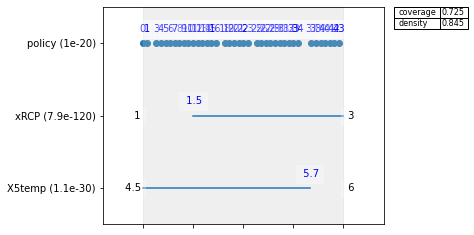

In [53]:
# Saeed : explore the inspect effect
box4.inspect(10)
box4.inspect(10, style='graph')
plt.show()

policy [0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 20, 21, 22, 23, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 37, 38, 39, 40, 41, 42, 43, 2, 35, 36, 44, 17, 24]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


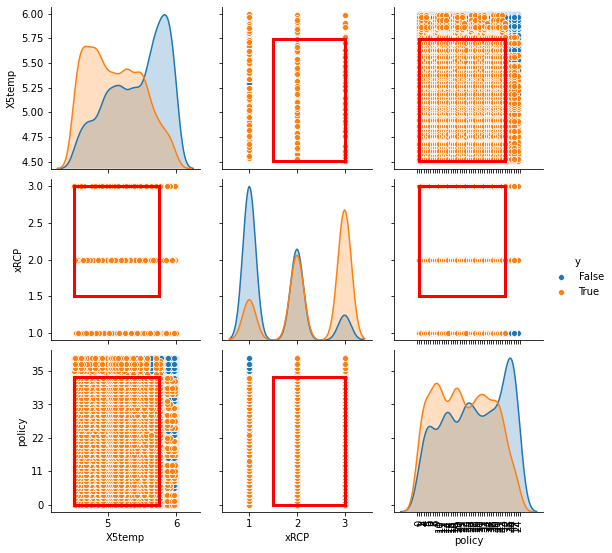

In [54]:
#fig, axs = plt.subplots()
axs3 = box4.show_pairs_scatter(10)
plt.show()
axs3.savefig(os.path.join(rootVisualization, 'multi_graphs_likehood.svg'), format='svg', dpi=600)

### Tipping points analysis

In [55]:
x = experiments
y = outcomes['tipping_points'] < 15
prim_alg = prim.Prim(x, y, threshold=0.8)
box5 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 1110 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X3iPot
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting xGoodDays
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 0.8138528138528138, mass: 0.051333333333333335, coverage: 0.3387387387387387, density: 0.8138528138528138 restricted_dimensions: 7


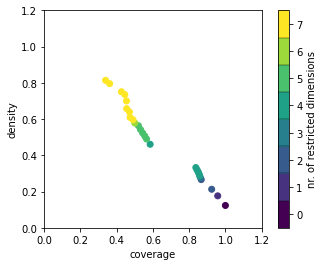

In [56]:
box5.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_Artificial.svg'), format='svg', dpi=600)

coverage     0.51982
density     0.563477
id                15
mass        0.113778
mean        0.563477
res_dim            5
Name: 15, dtype: object

                                                            box 15  \
                                                               min   
xRCP                                                             1   
Xfactor1                                                  0.522619   
xGoodDays                                       {80.0, 60.0, 70.0}   
policy           {0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15...   
x1SnowThershold  {260.0, 200.0, 300.0, 270.0, 240.0, 280.0, 250...   

                                                                    \
                                                               max   
xRCP                                                           1.5   
Xfactor1                                                    3.3134   
xGoodDays                                       {80.0, 60.0, 70.0}   
policy  

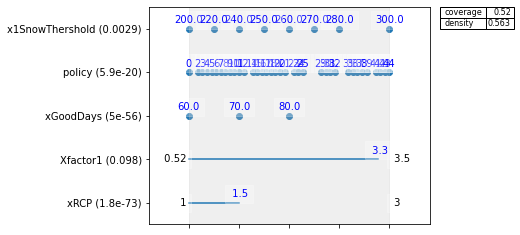

In [57]:
# Saeed : explore the inspect effect
box5.inspect(15)
box5.inspect(15, style='graph')
plt.show()

x1SnowThershold [260.0, 200.0, 300.0, 270.0, 240.0, 280.0, 250.0, 220.0, 290.0]
xGoodDays [80.0, 60.0, 70.0, 90.0, 100.0]
policy [0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 15, 16, 17, 18, 19, 20, 21, 23, 24, 25, 29, 30, 31, 32, 35, 36, 37, 38, 39, 41, 42, 43, 44, 1, 33, 34, 40, 13, 22, 26, 27, 28]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


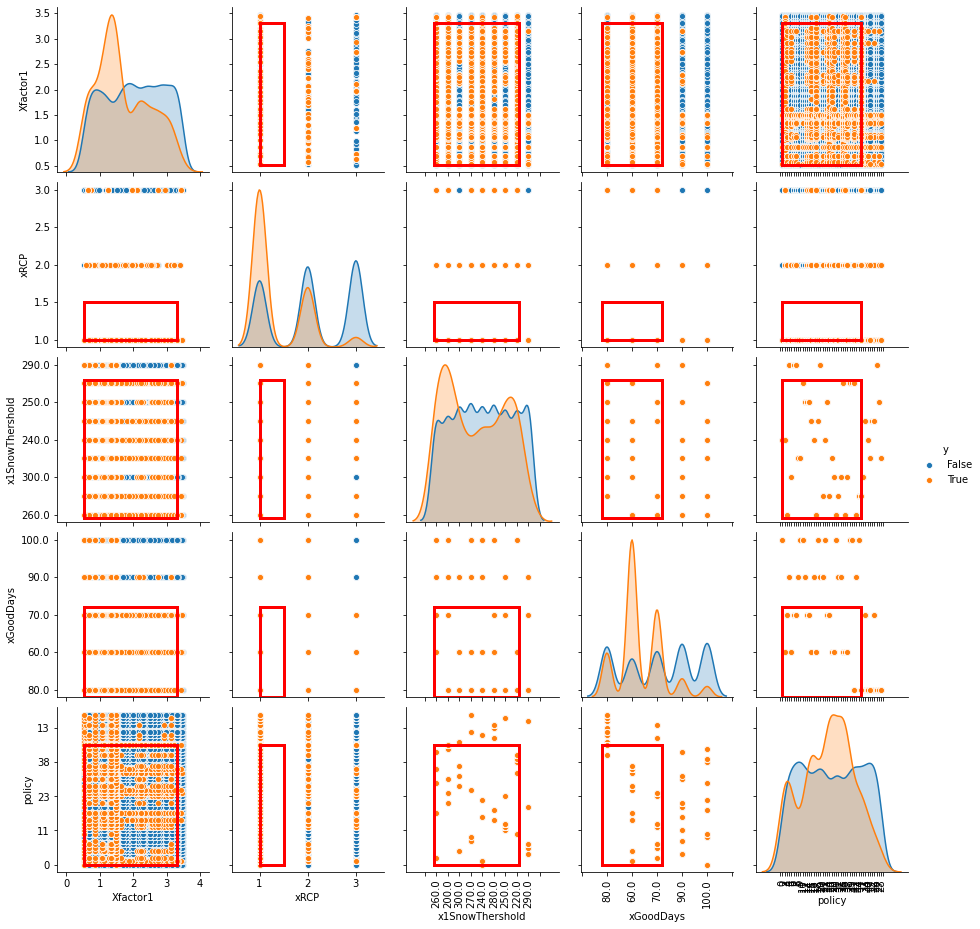

In [58]:
#fig, axs = plt.subplots()
axs5 = box5.show_pairs_scatter(15)
plt.show()

axs5.savefig(os.path.join(rootVisualization, 'multigraphs_tippingpoints.svg'), format='svg', dpi=300)

### Visualization with ema-workbench - part3

In [59]:
experiments2 = experiments
experiments2 = experiments2.pop('policy')

In [60]:
new_dict_experiments = {key:val for key, val in experiments2.items() if key != 'policy'} 

In [61]:
sns.set(font_scale=1.5)

ax6 = sns.heatmap(fs, cmap='viridis', annot=True,
                  vmin=0, linewidths=0.14,linecolor="grey",
                  cbar_kws={'label': 'features ranks','shrink': 0.1})

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category


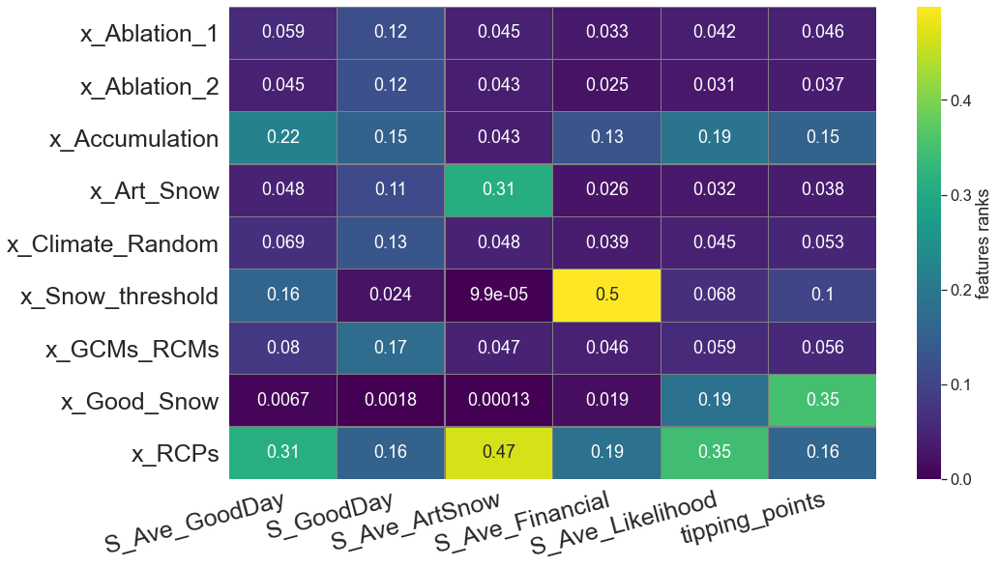

In [62]:
from ema_workbench.analysis import feature_scoring

fig6, ax6 = plt.subplots(figsize=(15,9))

x = experiments
#x = new_dict_experiments
#Y = outcomes
Y = new_dict
fs = feature_scoring.get_feature_scores_all(x, Y)
ax6 = sns.heatmap(fs, cmap='viridis', annot=True,
                  vmin=0, linewidths=0.28,linecolor="grey",
                  cbar_kws={'label': 'features ranks'})

# Rotate the tick labels and set their alignment.
plt.setp(ax6.get_xticklabels(), rotation=15, size = 25, ha="right",
         rotation_mode="anchor")

ylabels = ['x_Ablation_1', 'x_Ablation_2', 'x_Accumulation', 'x_Art_Snow', 'x_Climate_Random', 'x_Snow_threshold', 'x_GCMs_RCMs', 'x_Good_Snow', 'x_RCPs']
ax6.set_yticklabels(ylabels)
plt.setp(ax6.get_yticklabels(), rotation=0, size = 25, ha="right", rotation_mode="anchor")

#ax6.legend(size=13)

plt.show()

fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.svg'), format='svg', dpi=300)
fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.tiff'), format='tiff', dpi=150)
fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.jpg'), format='jpg', dpi=150)

S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)

Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)

S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort

S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points

tipping_points: Number of tipping points (1981-2100)

[MainProcess/INFO] model dropped from analysis because only a single category


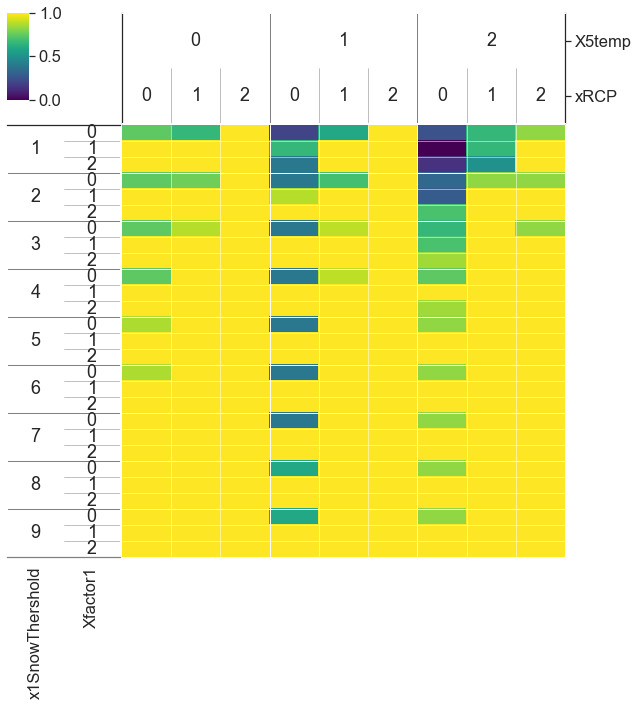

In [63]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_GoodDay'] < 70
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_gooddays.svg'), format='svg', dpi=600)

[MainProcess/INFO] model dropped from analysis because only a single category


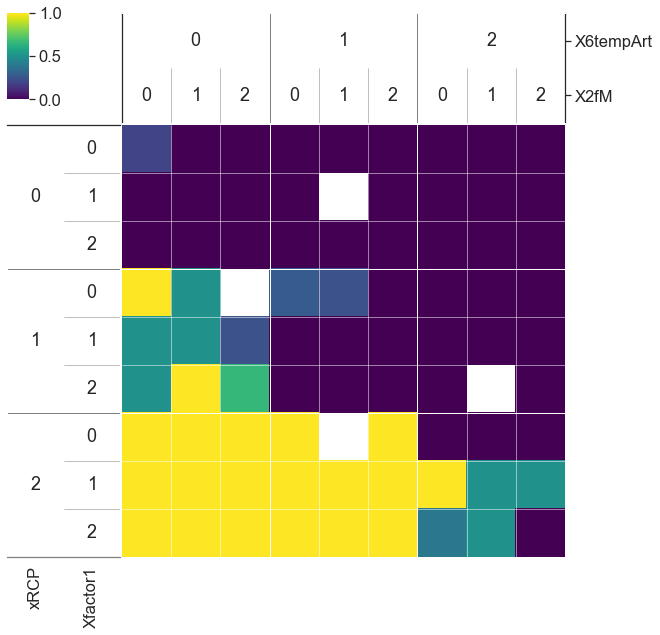

In [64]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_ArtSnow'] < 50
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Artificial.svg'), format='svg', dpi=300)

[MainProcess/INFO] model dropped from analysis because only a single category


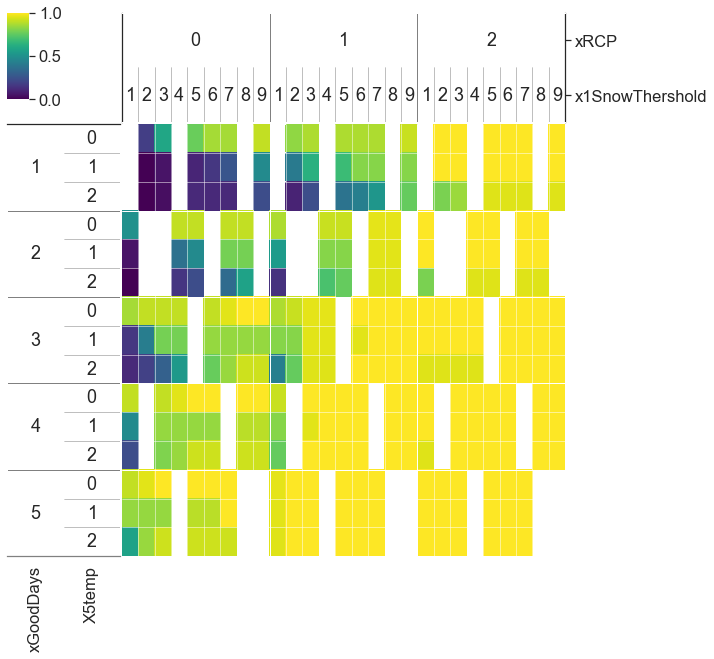

In [65]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_Likelihood'] < 0.6
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Liklehood.svg'), format='svg', dpi=600)

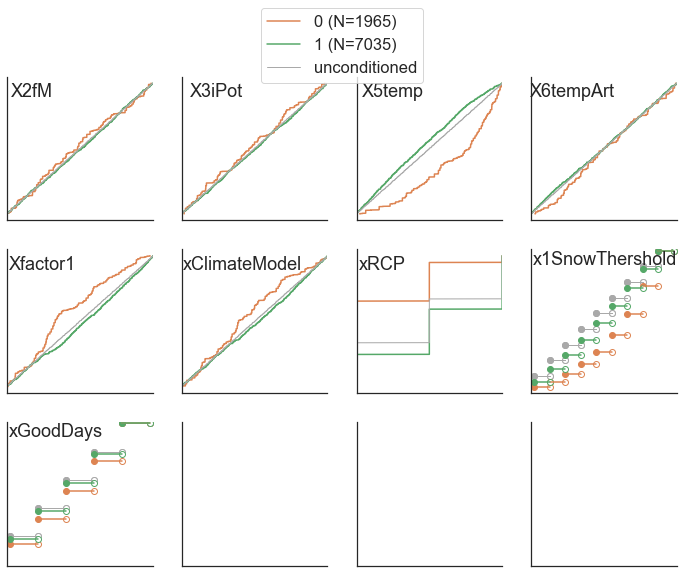

In [66]:
from ema_workbench.analysis import regional_sa
from numpy.lib import recfunctions as rf

sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_GoodDay'] < 60
fig10 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig10.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_gooddays.svg'), format='svg', dpi=600)

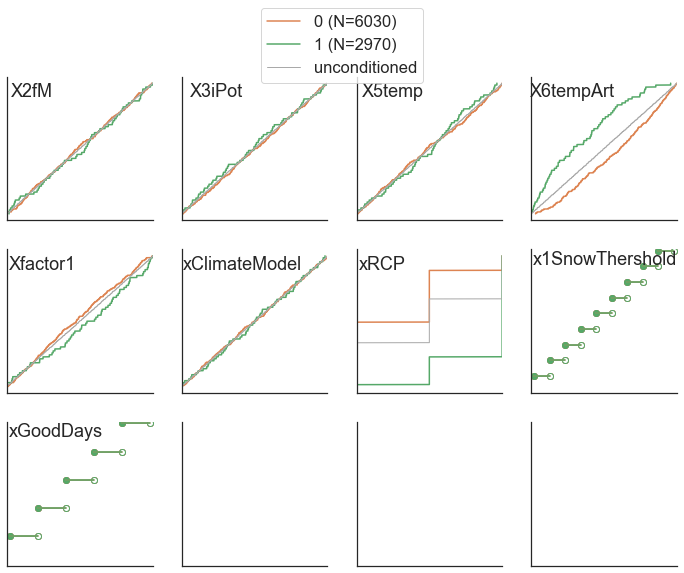

In [67]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_ArtSnow'] < 50
fig12 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig12.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

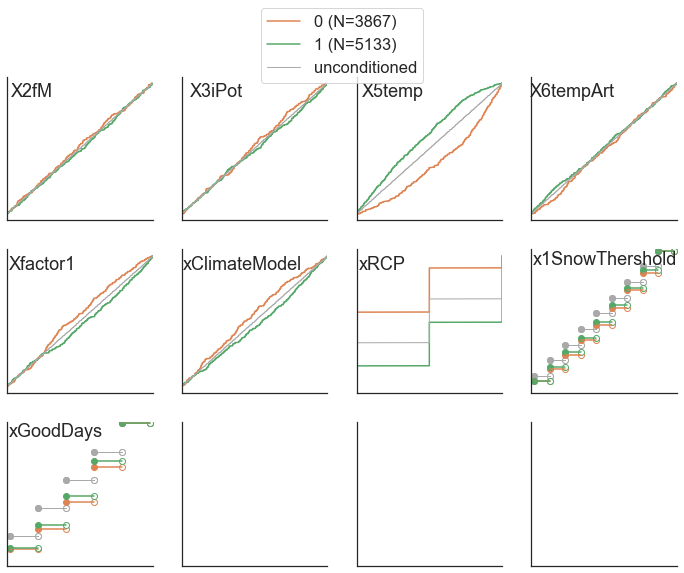

In [68]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_Likelihood'] < 0.5
fig11 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig11.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

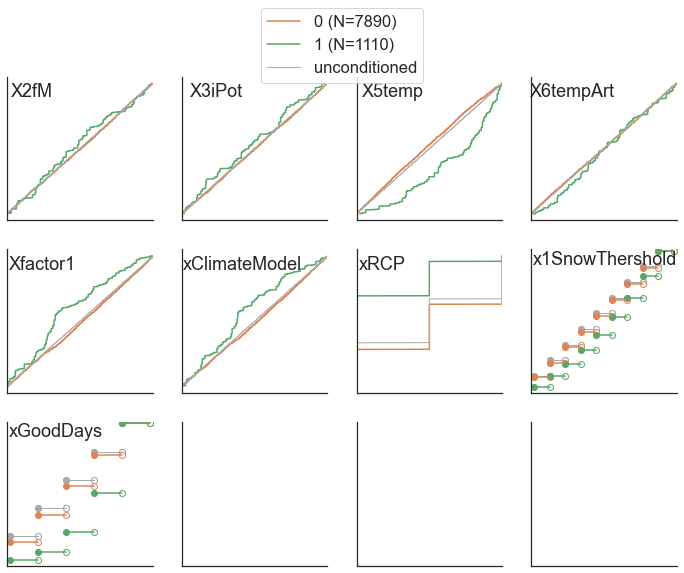

In [69]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['tipping_points'] < 15
fig11_2 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig11_2.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_tipping_points.svg'), format='svg', dpi=600)

### Scatter Plots (Inputs vs Outputs)

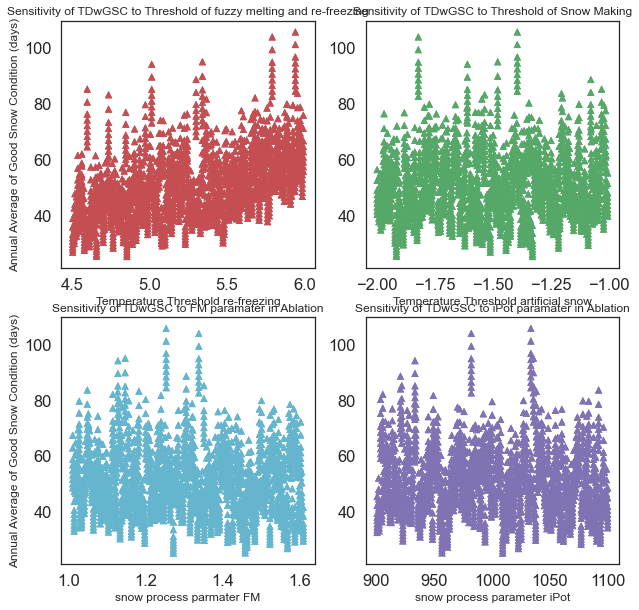

In [70]:
#fig, (ax1, ax2) = plt.subplots(1,2)
fig13, axs = plt.subplots(2, 2, figsize=(10,10))
#axs[0,0].scatter(xGoodDays, y, s = 200, c='b' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Good Days Condition')

#axs[0,1].scatter(x1SnowThershold, y, s = 200, c='orange' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Snow Threshold Condition')

axs[0,0].scatter(x5, YY, s = 50, c='r' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[0,1].scatter(x6, YY, s = 50, c='g' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')

axs[1,0].scatter(x2, YY, s = 50, c='c' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[1,1].scatter(x3, YY, s = 50, c='m' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')


# produce a legend with the unique colors from the scatter
#axs[0,0].set_xlabel("Good Days Condition")
#axs[0,1].set_xlabel("Snow Threshold Condition")
axs[0,0].set_xlabel("Temperature Threshold re-freezing", size = 12)
axs[0,1].set_xlabel("Temperature Threshold artificial snow", size = 12)
axs[1,0].set_xlabel("snow process parmater FM",size = 12)
axs[1,1].set_xlabel("snow process parameter iPot", size = 12)


axs[0,0].set_ylabel("Annual Average of Good Snow Condition (days)", size = 12)
#axs[0,1].set_ylabel("Frequency of Tipping points")
axs[1,0].set_ylabel("Annual Average of Good Snow Condition (days)", size = 12)
#axs[1,1].set_ylabel("Frequency of Tipping points")
#axs[2,0].set_ylabel("Annual Average of Good Snow Condition (days)")
#axs[2,1].set_ylabel("Frequency of Tipping points")

#axs[0,0].set_title('Sensitivity of TDwGSC to Policy-1 (less that 100 days)')
#axs[0,1].set_title('Sensitivity of TDwGSC to Policy-2 (300 mm)')
axs[0,0].set_title('Sensitivity of TDwGSC to Threshold of fuzzy melting and re-freezing', size = 12)
axs[0,1].set_title('Sensitivity of TDwGSC to Threshold of Snow Making', size = 12)
axs[1,0].set_title('Sensitivity of TDwGSC to FM paramater in Ablation', size = 12)
axs[1,1].set_title('Sensitivity of TDwGSC to iPot paramater in Ablation', size = 12)


#axs[0,0].text(0, 130, r'A', fontsize=15)
#axs[0,1].text(-1.9, 130, r'B', fontsize=15)
#axs[1,0].text(1.04, 130, r'C', fontsize=15)
#axs[1,1].text(920, 130, r'D', fontsize=15)

fig13.savefig(os.path.join(rootVisualization, 'SA4_All.svg'), format='svg', dpi=300)

plt.show()

## 3D Scatter Plot

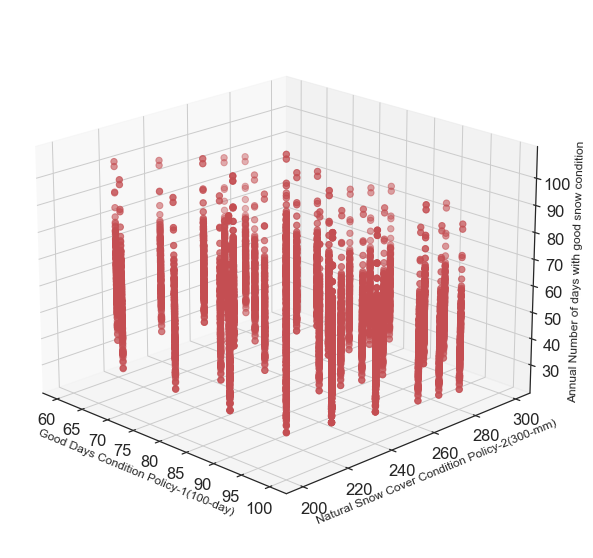

In [71]:
from mpl_toolkits.mplot3d import Axes3D 
fig14 = plt.figure(figsize=(15,10))
ax = fig14.add_subplot(111, projection='3d')

ax.scatter(xGoodDays, x1SnowThershold, YY, s = 40, c='r', marker='o')

ax.set_xlabel('Good Days Condition Policy-1(100-day)', size = 12)
ax.set_ylabel('Natural Snow Cover Condition Policy-2(300-mm)', size = 12)
ax.set_zlabel('Annual Number of days with good snow condition', size = 12)


#ax.scatter(100, 300, 40, color='green')


#x = np.linspace(75,100,5)
#y = np.linspace(220,300,16)
#X,Y = np.meshgrid(x,y)
#Z= X + Y -X - Y + 40 
#surf = ax.plot_surface(X, Y, Z, alpha = 0.2)
ax.view_init(20, -45)

fig14.savefig(os.path.join(rootVisualization, 'SA_Policy_All.svg'), format='svg', dpi=300)
plt.show()

In [72]:
df_final_ema.head()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
0,1.250685,1087.727193,5.727369,-1.693444,2.844352,0.673825,1.0,240.0,100.0,0,0,UZHModel,62.486463,7,55.962542,103.940292,19.350875,42.421250,31.437458,32.793292,122.454333,33.849250,47.272083,54.572958,136.294417,72.626708,103.393125,121.212500,47.650625,89.575292,121.960333,64.852625,43.997917,17.338042,...,93.801125,56.337833,17.169625,89.107708,74.109000,121.958792,65.714500,26.063750,27.131333,57.265583,88.048167,68.163167,35.107208,106.364208,40.613708,48.754500,29.708500,23.493250,54.752958,16.203542,70.417875,24.864958,13.543833,108.353000,36.442250,87.635667,104.441583,18.796708,50.566542,19.831625,53.380424,2.683475,0.503633,27.0
1,1.352533,1037.680312,4.585490,-1.355050,2.996305,0.235785,3.0,240.0,100.0,1,0,UZHModel,36.312910,43,29.992125,35.843417,121.186958,63.723375,79.751583,107.348542,51.066208,66.675625,109.718458,62.590708,92.605250,63.647917,109.950292,45.456667,27.712292,52.406167,35.738250,69.410542,46.525458,123.897917,...,2.886542,14.467000,3.361708,14.838458,7.610708,4.563125,8.354208,27.907792,20.199042,6.302833,2.481958,21.870958,5.516125,3.900917,5.201375,11.046250,6.886000,4.209958,7.577458,2.055333,3.322792,9.247458,1.775792,73.117792,2.945167,2.643208,7.791167,1.579750,3.064583,4.534125,47.783220,1.543390,0.299043,33.0
2,1.572054,1029.558703,5.605319,-1.171834,1.390144,0.070671,1.0,240.0,100.0,2,0,UZHModel,66.424098,1,87.141583,108.118125,93.263542,37.971292,149.744958,102.905333,127.865500,65.134083,74.499958,34.170583,116.369917,118.674458,106.416167,95.997292,58.277125,117.584458,100.145792,126.865417,55.218708,84.839583,...,47.957792,63.906000,23.155167,24.449167,26.427167,52.362083,134.884583,36.978333,58.754708,23.377250,6.857917,86.145583,16.120542,30.948500,53.289917,102.652583,32.299000,29.536625,35.331375,14.232542,37.214792,83.746667,34.091125,66.006708,77.850875,84.867542,23.616750,149.975875,74.223625,44.813583,55.005254,2.842627,0.531171,24.0
3,1.358586,1063.437386,5.451759,-1.973331,3.320044,0.220486,2.0,240.0,100.0,3,0,UZHModel,55.534072,17,37.285333,79.355333,164.444000,84.367500,81.692458,117.197750,137.166542,30.559083,96.669500,115.092708,43.790542,145.823042,48.323708,51.065875,89.439250,124.340833,82.011083,88.561083,39.063958,21.122042,...,12.678375,38.327958,19.544000,22.632250,16.864292,27.558875,57.913042,58.045208,9.816083,3.120625,18.850375,37.830417,37.084083,42.187542,31.012458,26.916958,33.648875,31.162208,22.075750,63.804292,59.089542,46.313208,15.175542,37.477583,35.317667,34.001583,40.264667,35.683667,17.098958,2.803000,46.972712,2.360424,0.445850,27.0
4,1.529336,975.715272,5.223552,-1.406489,1.025620,0.109410,2.0,240.0,100.0,4,0,UZHModel,66.848388,14,58.700750,77.654667,117.549458,48.231792,46.806458,56.693083,125.564750,73.137042,119.398583,135.527292,52.324667,113.009375,68.230792,124.562208,53.238875,121.586500,78.341375,64.050542,24.328250,27.118750,...,15.997792,59.212125,35.486917,35.959042,5.723833,38.280167,91.465125,51.879500,11.708833,137.845083,35.664625,51.983667,58.066375,23.642958,72.821167,93.999708,60.782875,37.084208,39.915625,18.113833,105.723958,67.595042,42.304375,69.014583,40.922458,69.751417,15.000458,18.159917,81.693458,75.625542,57.700339,2.871525,0.525486,22.0


# Taking the values
x2 = df_final_ema['X2fM'].values
x3 = df_final_ema['X3iPot'].values
x5 = df_final_ema['X5temp'].values
x6 = df_final_ema['X6tempArt'].values
xRCP = df_final_ema['xRCP'].values
xClimateModel = df_final_ema['xClimateModel'].values
x1SnowThershold = df_final_ema['x1SnowThershold'].values
xGoodDays = df_final_ema['xGoodDays'].values

YY = df_final_ema['Yout'].values
y1 = df_final_ema['Yout1'].values
y3 = df_final_ema['Yout3_95'].values
y4 = df_final_ema['Yout4'].values
y5 = df_final_ema['Yout5'].values
y6 = df_final_ema['Yout6'].values
y7 = df_final_ema['Yout7'].values

In [73]:
df_final_ema.tail()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
8995,1.268997,1070.540036,4.561155,-1.846370,3.306751,0.209559,1.0,200.0,80.0,195,44,UZHModel,61.906014,2,127.42050,53.8267,69.85405,29.45265,141.60160,137.91250,44.36520,58.60285,144.01530,63.13965,108.34530,74.16970,45.93370,107.18010,50.78020,133.52130,82.89350,135.47375,17.41500,91.57000,...,26.02760,14.22895,33.57290,32.22045,24.63175,86.21680,11.91630,63.47420,10.31785,41.84450,57.02035,12.23895,48.53225,64.13350,29.33950,58.15895,91.91220,20.37225,85.37420,92.44860,47.24545,30.77230,37.70440,46.72980,84.81960,31.82295,79.59260,72.10940,65.45240,89.31180,54.314576,3.230085,0.566293,17.0
8996,1.125495,952.535532,5.967508,-1.914168,1.117265,0.809776,1.0,200.0,80.0,196,44,UZHModel,71.948719,9,134.13510,89.9320,112.87700,132.99980,49.11800,159.96920,120.24970,116.27170,37.30975,78.22665,44.27110,40.47995,92.50680,121.16880,19.83790,147.35170,148.18155,110.95115,71.41605,98.63720,...,13.84715,29.57195,28.74150,27.32110,47.76490,121.38990,43.06415,109.02315,11.59785,67.24010,75.83770,39.71830,103.38735,149.09455,18.54935,90.47595,12.87915,22.94845,138.59920,54.43800,34.35245,28.57240,93.02385,122.30065,60.83035,18.75845,133.69695,35.71635,74.66505,23.27775,51.171102,3.739576,0.614283,13.0
8997,1.605153,1095.112523,4.678439,-1.682400,2.500199,0.821784,1.0,200.0,80.0,197,44,UZHModel,54.264062,9,52.61045,67.6814,7.90425,21.86390,156.79445,52.94975,114.69215,72.00970,112.81090,77.91955,100.93375,25.96285,48.53180,102.95395,61.79035,81.40015,90.63825,24.21240,119.56330,56.24380,...,19.27225,15.14420,105.04370,21.95335,9.32500,67.26355,133.67730,31.26775,8.02900,31.91080,15.63870,21.80175,63.31450,45.17945,19.10590,8.48920,100.36460,22.09555,59.37220,32.60680,25.32455,24.14145,64.34140,59.00960,67.91790,32.82370,30.58525,99.57405,46.31000,43.04085,53.264492,2.824322,0.516991,22.0
8998,1.305612,920.700454,5.299202,-1.075770,1.334323,0.241554,1.0,200.0,80.0,198,44,UZHModel,88.633621,3,48.84035,91.3964,158.24060,33.84605,90.21760,104.64525,145.02680,81.83910,152.80680,149.48160,76.89050,116.68715,128.72935,122.13405,136.97070,159.25895,119.75095,51.23375,30.71610,82.50405,...,55.72620,16.56180,35.88805,125.28120,24.00110,131.31780,86.67205,124.07920,83.37960,80.73210,65.53495,55.55075,97.35450,124.73635,86.66475,104.49325,69.25015,52.63580,80.09780,43.79150,138.49280,30.12975,100.48520,101.67310,141.53040,113.80060,121.76795,39.09910,148.09805,115.51260,64.357458,4.572881,0.710397,5.0
8999,1.315584,1086.181832,4.525690,-1.674553,2.301019,0.800295,2.0,200.0,80.0,199,44,UZHModel,46.546422,31,44.58555,63.1760,111.00770,16.27685,84.37330,61.65550,83.58670,73.12375,37.03590,42.17945,90.56115,65.18210,132.07610,122.68525,28.38825,90.25690,106.80745,20.93110,24.47165,33.32350,...,10.24670,25.34040,28.62090,35.71730,11.86890,27.14110,78.24580,55.64305,50.89155,25.05565,9.44495,14.84105,42.67135,29.98910,32.53725,62.83160,80.11330,60.67165,23.63335,38.55795,37.45150,6.07760,85.47130,11.77685,2.62840,26.34430,19.12345,6.97940,65.69760,22.96005,50.924153,2.409068,0.445644,25.0


In [74]:
filt_S = (df_final_ema['scenario'] == 1)
x_policy = df_final_ema.loc[filt_S, 'x1SnowThershold']
y_policy = df_final_ema.loc[filt_S, 'xGoodDays']
scenarios = df_final_ema.loc[filt_S, 'policy']

In [75]:
x_policy[1]

240.0

In [76]:
df_final_ema[filt_S]

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
1,1.352533,1037.680312,4.58549,-1.35505,2.996305,0.235785,3.0,240.0,100.0,1,0,UZHModel,36.312910,43,29.992125,35.843417,121.186958,63.723375,79.751583,107.348542,51.066208,66.675625,109.718458,62.590708,92.605250,63.647917,109.950292,45.456667,27.712292,52.406167,35.738250,69.410542,46.525458,123.897917,...,2.886542,14.467000,3.361708,14.838458,7.610708,4.563125,8.354208,27.907792,20.199042,6.302833,2.481958,21.870958,5.516125,3.900917,5.201375,11.046250,6.886000,4.209958,7.577458,2.055333,3.322792,9.247458,1.775792,73.117792,2.945167,2.643208,7.791167,1.579750,3.064583,4.534125,47.78322,1.543390,0.299043,33.0
201,1.352533,1037.680312,4.58549,-1.35505,2.996305,0.235785,3.0,300.0,80.0,1,1,UZHModel,29.673431,43,23.993700,28.674733,99.535233,50.978700,63.801267,86.098633,40.852967,53.340500,103.492233,50.072567,76.107000,50.918333,89.930867,36.365333,22.169833,41.924933,28.590600,55.528433,37.220367,105.552800,...,2.309233,11.573600,2.689367,11.870767,6.088567,3.650500,6.683367,22.326233,16.159233,5.042267,1.985567,17.496767,4.412900,3.120733,4.161100,8.837000,5.508800,3.367967,6.061967,1.644267,2.658233,7.397967,1.420633,63.848367,2.356133,2.114567,6.232933,1.263800,2.451667,3.627300,47.78322,1.003136,0.300565,32.0
401,1.352533,1037.680312,4.58549,-1.35505,2.996305,0.235785,3.0,240.0,60.0,1,2,UZHModel,36.312910,43,29.992125,35.843417,121.186958,63.723375,79.751583,107.348542,51.066208,66.675625,109.718458,62.590708,92.605250,63.647917,109.950292,45.456667,27.712292,52.406167,35.738250,69.410542,46.525458,123.897917,...,2.886542,14.467000,3.361708,14.838458,7.610708,4.563125,8.354208,27.907792,20.199042,6.302833,2.481958,21.870958,5.516125,3.900917,5.201375,11.046250,6.886000,4.209958,7.577458,2.055333,3.322792,9.247458,1.775792,73.117792,2.945167,2.643208,7.791167,1.579750,3.064583,4.534125,47.78322,1.543390,0.428720,26.0
601,1.352533,1037.680312,4.58549,-1.35505,2.996305,0.235785,3.0,260.0,70.0,1,3,UZHModel,33.853402,43,27.685038,33.086231,114.589231,58.821577,73.616846,99.344577,47.138038,61.546731,107.850846,57.776038,86.886269,58.751923,103.432077,41.960000,25.580577,48.374923,32.989154,64.071269,42.946577,117.945308,...,2.664500,13.354154,3.103115,13.697038,7.025269,4.212115,7.711577,25.761038,18.645269,5.818000,2.291038,20.188577,5.091808,3.600846,4.801269,10.196538,6.356308,3.886115,6.994577,1.897231,3.067192,8.536115,1.639192,70.286846,2.718615,2.439885,7.191846,1.458231,2.828846,4.185346,47.78322,1.344831,0.367531,30.0
801,1.352533,1037.680312,4.58549,-1.35505,2.996305,0.235785,3.0,290.0,90.0,1,4,UZHModel,30.639006,43,24.821069,29.663517,102.967483,52.736586,66.001310,89.067552,42.261690,55.179828,104.666448,51.799207,78.671448,52.674138,93.031931,37.619310,22.934310,43.370621,29.576483,57.443207,38.503828,108.707690,...,2.388862,11.972690,2.782103,12.280103,6.298517,3.776379,6.913828,23.096103,16.716448,5.216138,2.054034,18.100103,4.565069,3.228345,4.304586,9.141724,5.698759,3.484103,6.271000,1.700966,2.749897,7.653069,1.469621,65.782345,2.437379,2.187483,6.447862,1.307379,2.536207,3.752379,47.78322,1.081186,0.281426,34.0
1001,1.352533,1037.680312,4.58549,-1.35505,2.996305,0.235785,3.0,300.0,60.0,1,5,UZHModel,29.673431,43,23.993700,28.674733,99.535233,50.978700,63.801267,86.098633,40.852967,53.340500,103.492233,50.072567,76.107000,50.918333,89.930867,36.365333,22.169833,41.924933,28.590600,55.528433,37.220367,105.552800,...,2.3

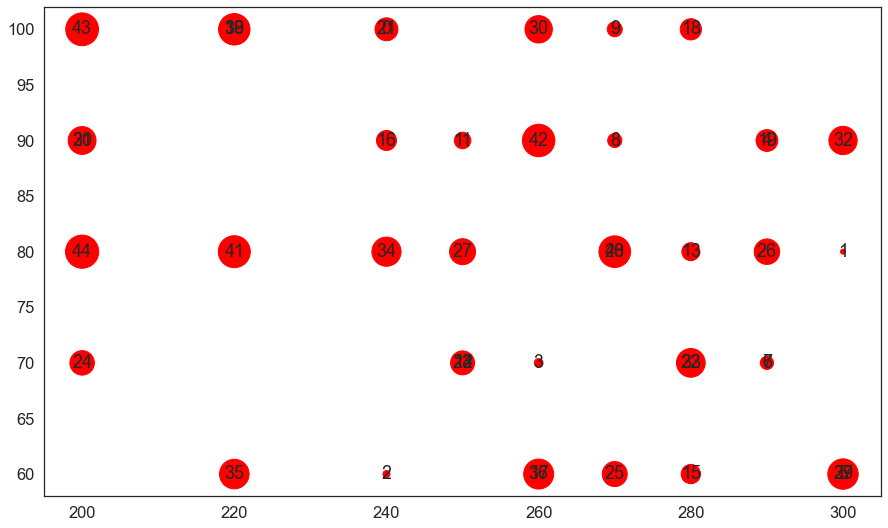

In [77]:
#x_policy = x1SnowThershold 
#y_policy = xGoodDays 

#ranking = np.random.normal(size=9000)
#scenarios = df_final_ema['policy'].values


fig, ax_n = plt.subplots(figsize=(15,9))


x_policy = df_final_ema.loc[filt_S, 'x1SnowThershold']
y_policy = df_final_ema.loc[filt_S, 'xGoodDays']
scenarios = df_final_ema.loc[filt_S, 'policy']
#colors = np.random.rand(N)


# Because the price is much too small when being provided as size for ``s``,
# we normalize it to some useful point sizes, s=0.3*(price*3)**2
ax_n.scatter(x_policy, y_policy, s = scenarios * 25, c = 'red' , cmap="Spectral")

for x_pos, y_pos, label in zip(x_policy, y_policy, scenarios):
    ax_n.annotate(label,
                xy=(x_pos, y_pos),
                xytext=(0, 0),
                textcoords='offset points',
                ha='center',
                va='center')

plt.show()

### Defining the Q0.9 and Q0.1 databases

In [78]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

print(q10_years_Art[0])
print(q25_years_Art[0])
print(q50_years_Art[0])
print(q75_years_Art[0])
print(q90_years_Art[0])
print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[24.28906]
[35.98242974]
[53.24956667]
[78.70860795]
[102.35123096]
(118, 1)
[0.88]
[1.41]
[2.185]
[3.3125]
[4.361]
(118, 1)
[43.694]
[50.2025]
[57.9]
[64.7025]
[73.265]
(118, 1)
[30.16454167]
[45.37466133]
[67.79885281]
[100.]
[100.]
(118, 1)


In [79]:
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
print(matrix_Art26.shape)
print(matrix_Art45.shape)
print(matrix_Art85.shape)
print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

#########
(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
9000
#########
(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
9000
#########
(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
9000
#########
(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
9000


In [80]:
print(matrix_GoodDays[:, :, 1:2].shape)
print(matrix_GoodDays[3, 0, 1:2])
print(matrix_GoodDays[4].shape)

(9000, 119, 1)
['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp']
(119, 2)


## Analysis for different RCP2.6, RCP4.5, and RCP8.5
### Calculate quantiles for each RCP scenarios

In [81]:
q10_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.9, axis=0)



#2020/08/13
q10_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.9, axis=0)


q10_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.9, axis=0)


#### Make dataframes from quantiles

In [82]:
dfq50_26 = pd.DataFrame(q50_years_26)
dfq50_26.columns = ['median26']
dfq50_45 = pd.DataFrame(q50_years_45)
dfq50_45.columns = ['median45']
dfq50_85 = pd.DataFrame(q50_years_85)
dfq50_85.columns = ['median85']

dfq90_26 = pd.DataFrame(q90_years_26)
dfq90_26.columns = ['Q90_26']
dfq90_45 = pd.DataFrame(q90_years_45)
dfq90_45.columns = ['Q90_45']
dfq90_85 = pd.DataFrame(q90_years_85)
dfq90_85.columns = ['Q90_85']

dfq10_26 = pd.DataFrame(q10_years_26)
dfq10_26.columns = ['Q10_26']
dfq10_45 = pd.DataFrame(q10_years_45)
dfq10_45.columns = ['Q10_45']
dfq10_85 = pd.DataFrame(q10_years_85)
dfq10_85.columns = ['Q10_85']

### 2020/08/13
dfq50_fin_26 = pd.DataFrame(q50_years_fin_26)
dfq50_fin_26.columns = ['median26']
dfq50_fin_45 = pd.DataFrame(q50_years_fin_45)
dfq50_fin_45.columns = ['median45']
dfq50_fin_85 = pd.DataFrame(q50_years_fin_85)
dfq50_fin_85.columns = ['median85']

dfq90_fin_26 = pd.DataFrame(q90_years_fin_26)
dfq90_fin_26.columns = ['median26']
dfq90_fin_45 = pd.DataFrame(q90_years_fin_45)
dfq90_fin_45.columns = ['median45']
dfq90_fin_85 = pd.DataFrame(q90_years_fin_85)
dfq90_fin_85.columns = ['median85']

dfq10_fin_26 = pd.DataFrame(q10_years_fin_26)
dfq10_fin_26.columns = ['median26']
dfq10_fin_45 = pd.DataFrame(q10_years_fin_45)
dfq10_fin_45.columns = ['median45']
dfq10_fin_85 = pd.DataFrame(q10_years_fin_85)
dfq10_fin_85.columns = ['median85']

dfq50_Art_26 = pd.DataFrame(q50_years_Art_26)
dfq50_Art_26.columns = ['median26']
dfq50_Art_45 = pd.DataFrame(q50_years_Art_45)
dfq50_Art_45.columns = ['median45']
dfq50_Art_85 = pd.DataFrame(q50_years_Art_85)
dfq50_Art_85.columns = ['median85']

dfq90_Art_26 = pd.DataFrame(q90_years_Art_26)
dfq90_Art_26.columns = ['median26']
dfq90_Art_45 = pd.DataFrame(q90_years_Art_45)
dfq90_Art_45.columns = ['median45']
dfq90_Art_85 = pd.DataFrame(q90_years_Art_85)
dfq90_Art_85.columns = ['median85']

dfq10_Art_26 = pd.DataFrame(q10_years_Art_26)
dfq10_Art_26.columns = ['median26']
dfq10_Art_45 = pd.DataFrame(q10_years_Art_45)
dfq10_Art_45.columns = ['median45']
dfq10_Art_85 = pd.DataFrame(q10_years_Art_85)
dfq10_Art_85.columns = ['median85']

dfq50_Like_26 = pd.DataFrame(q50_years_Like_26)
dfq50_Like_26.columns = ['median26']
dfq50_Like_45 = pd.DataFrame(q50_years_Like_45)
dfq50_Like_45.columns = ['median45']
dfq50_Like_85 = pd.DataFrame(q50_years_Like_85)
dfq50_Like_85.columns = ['median85']

dfq90_Like_26 = pd.DataFrame(q90_years_Like_26)
dfq90_Like_26.columns = ['median26']
dfq90_Like_45 = pd.DataFrame(q90_years_Like_45)
dfq90_Like_45.columns = ['median45']
dfq90_Like_85 = pd.DataFrame(q90_years_Like_85)
dfq90_Like_85.columns = ['median85']

dfq10_Like_26 = pd.DataFrame(q10_years_Like_26)
dfq10_Like_26.columns = ['median26']
dfq10_Like_45 = pd.DataFrame(q10_years_Like_45)
dfq10_Like_45.columns = ['median45']
dfq10_Like_85 = pd.DataFrame(q10_years_Like_85)
dfq10_Like_85.columns = ['median85']

In [83]:
dfq50_26.head()

,median26
0,57.044964
1,75.677273
2,67.618231
3,45.725700
4,82.050296


In [84]:
dfAllAverages = pd.concat((dfq50_26, dfq50_45, dfq50_85), axis=1)
dfAllAverages_Q90 = pd.concat((dfq90_26, dfq90_45, dfq90_85), axis=1)
dfAllAverages_Q10 = pd.concat((dfq10_26, dfq10_45, dfq10_85), axis=1)

dfAllAverages_fin = pd.concat((dfq50_fin_26, dfq50_fin_45, dfq50_fin_85), axis=1)
dfAllAverages_Q90_fin = pd.concat((dfq90_fin_26, dfq90_fin_45, dfq90_fin_85), axis=1)
dfAllAverages_Q10_fin = pd.concat((dfq10_fin_26, dfq10_fin_45, dfq10_fin_85), axis=1)

dfAllAverages_Art = pd.concat((dfq50_Art_26, dfq50_Art_45, dfq50_Art_85), axis=1)
dfAllAverages_Q90_Art = pd.concat((dfq90_Art_26, dfq90_Art_45, dfq90_Art_85), axis=1)
dfAllAverages_Q10_Art = pd.concat((dfq10_Art_26, dfq10_Art_45, dfq10_Art_85), axis=1)

dfAllAverages_Like = pd.concat((dfq50_Like_26, dfq50_Like_45, dfq50_Like_85), axis=1)
dfAllAverages_Q90_Like = pd.concat((dfq90_Like_26, dfq90_Like_45, dfq90_Like_85), axis=1)
dfAllAverages_Q10_Like = pd.concat((dfq10_Like_26, dfq10_Like_45, dfq10_Like_85), axis=1)

In [85]:
dfAllAverages.head()

,median26,median45,median85
0,57.044964,52.575667,51.545645
1,75.677273,68.833714,70.743289
2,67.618231,85.229000,75.014606
3,45.725700,50.517250,51.372975
4,82.050296,74.590000,83.741741


In [86]:
print('*** All RCPs***')
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)
print('*** RCP2.6***')
print(q10_years_26[0])
print(q25_years_26[0])
print(q50_years_26[0])
print(q75_years_26[0])
print(q90_years_26[0])
print(q50_years_26.shape)
print('*** RCP4.5***')
print(q10_years_45[0])
print(q25_years_45[0])
print(q50_years_45[0])
print(q75_years_45[0])
print(q90_years_45[0])
print(q50_years_45.shape)
print('*** RCP8.5***')
print(q10_years_85[0])
print(q25_years_85[0])
print(q50_years_85[0])
print(q75_years_85[0])
print(q90_years_85[0])
print(q50_years_85.shape)

*** All RCPs***
[24.28906]
[35.98242974]
[53.24956667]
[78.70860795]
[102.35123096]
(118, 1)
*** RCP2.6***
[21.07056667]
[32.56023333]
[57.04496429]
[79.58477273]
[103.6262]
(118, 1)
*** RCP4.5***
[27.01726667]
[37.154625]
[52.57566667]
[86.35816667]
[106.05376]
(118, 1)
*** RCP8.5***
[25.93778571]
[37.65425926]
[51.545645]
[71.99165]
[96.130375]
(118, 1)


In [87]:
print('*** All RCPs***')
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)
print('*** RCP2.6***')
print(q10_years_fin_26[0])
print(q25_years_fin_26[0])
print(q50_years_fin_26[0])
print(q75_years_fin_26[0])
print(q90_years_fin_26[0])
print(q50_years_fin_26.shape)
print('*** RCP4.5***')
print(q10_years_fin_45[0])
print(q25_years_fin_45[0])
print(q50_years_fin_45[0])
print(q75_years_fin_45[0])
print(q90_years_fin_45[0])
print(q50_years_fin_45.shape)
print('*** RCP8.5***')
print(q10_years_fin_85[0])
print(q25_years_fin_85[0])
print(q50_years_fin_85[0])
print(q75_years_fin_85[0])
print(q90_years_fin_85[0])
print(q50_years_fin_85.shape)

*** All RCPs***
[0.88]
[1.41]
[2.185]
[3.3125]
[4.361]
(118, 1)
*** RCP2.6***
[0.8]
[1.3]
[2.32]
[3.38]
[4.59]
(118, 1)
*** RCP4.5***
[0.93]
[1.44]
[2.21]
[3.46]
[4.45]
(118, 1)
*** RCP8.5***
[0.97]
[1.48]
[2.075]
[3.12]
[4.09]
(118, 1)


#### Set the parameters of making figure

In [88]:
p_Step = 20
alpha_Fade = 0.11

### RCP 2.6 Number of days with Good Snow Condition over the time

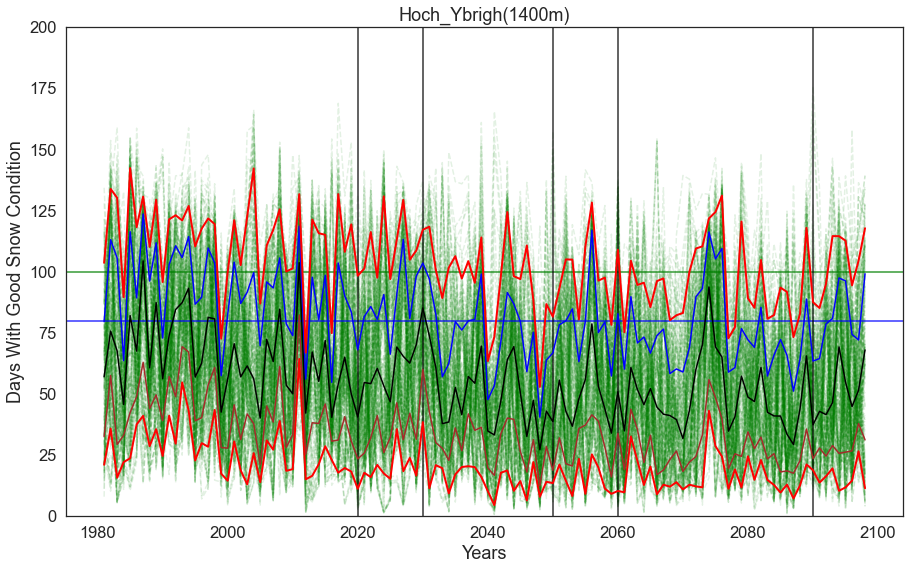

In [89]:
fig15, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays26), p_Step):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_26, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_26, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_26, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_26, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_26, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig15.savefig(os.path.join(rootVisualization, 'RCP26.svg'), format='svg', dpi=300)
plt.show()

### RCP 4.5 Number of days with Good Snow Condition over the time

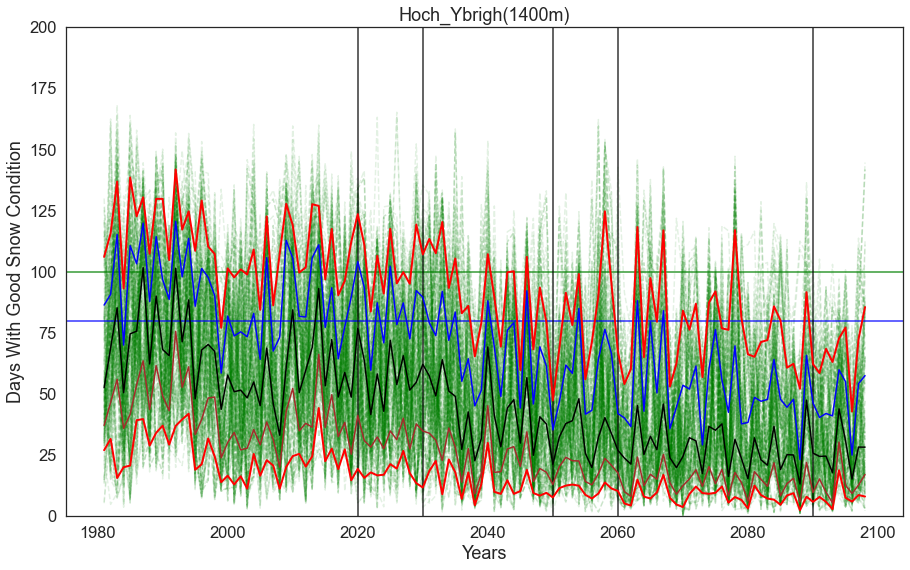

In [90]:
fig16, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays45), p_Step):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_45, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_45, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_45, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_45, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_45, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig16.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

### RCP 8.5 Number of days with Good Snow Condition over the time

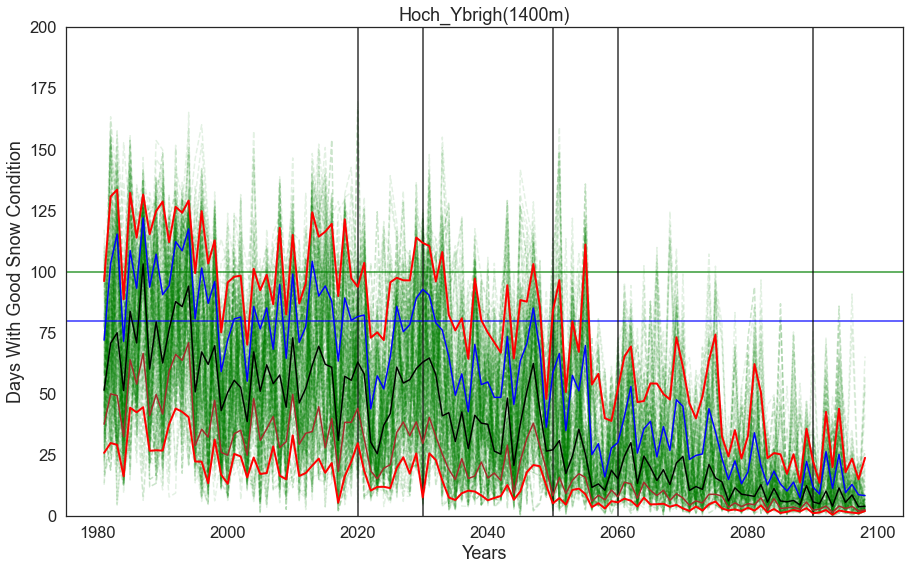

In [91]:
fig17, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_GoodDays85), p_Step):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_85, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_85, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_85, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_85, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_85, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig17.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

In [92]:
title_Figs = 'case5_Les Diablerets, elv_b 1340m, RCP2.6'

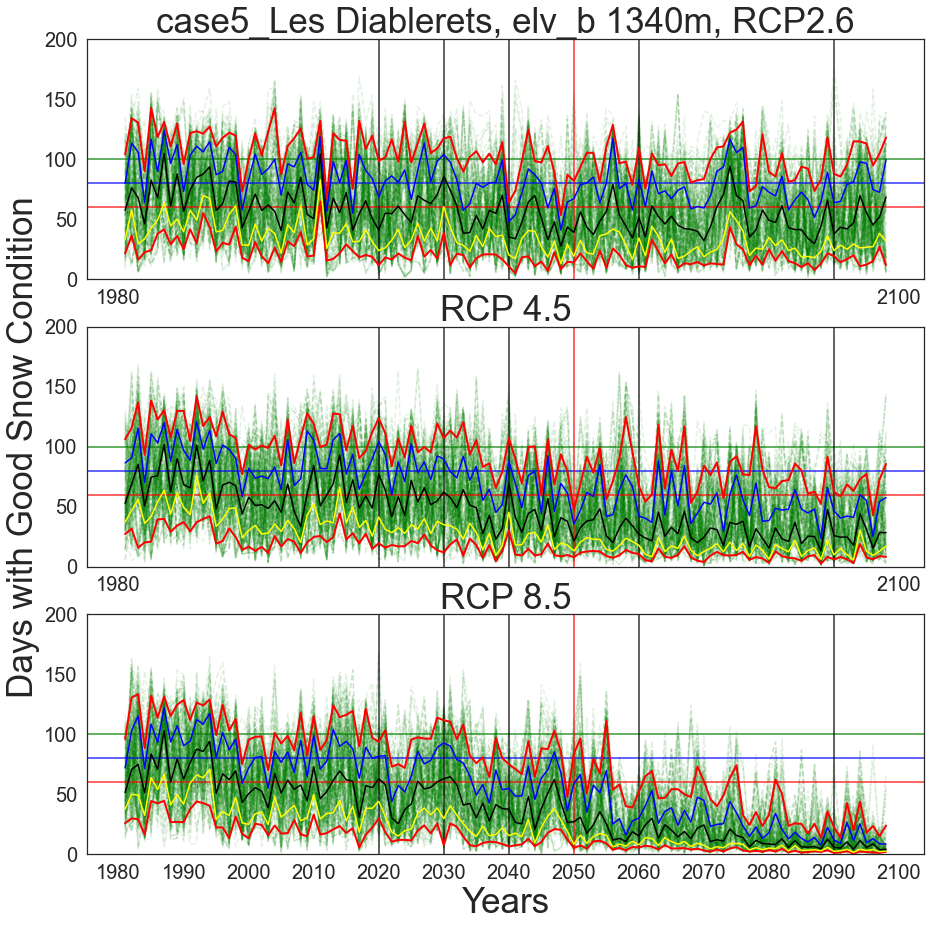

In [93]:
fig18, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays26), p_Step):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

for i in range(0, len(matrix_GoodDays45), p_Step):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_GoodDays85), p_Step):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)    

    
axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=100, color='green', alpha=0.8)
axs[0].axhline(y=80, color='blue', alpha=0.8)
axs[0].axhline(y=60, color='red', alpha=0.8)

axs[1].axhline(y=100, color='green', alpha=0.8)
axs[1].axhline(y=80, color='blue', alpha=0.8)
axs[1].axhline(y=60, color='red', alpha=0.8)

axs[2].axhline(y=100, color='green', alpha=0.8)
axs[2].axhline(y=80, color='blue', alpha=0.8)
axs[2].axhline(y=60, color='red', alpha=0.8)


axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)

axs[0].plot(x_axis, q10_years_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_85, color='red', linewidth = 2, alpha=1)

axs[0].set_ylim(bottom=0, top =200)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days With Good Snow Condition', fontsize=12)

axs[1].set_ylim(bottom=0, top =200)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Days with Good Snow Condition', fontsize=35)

axs[2].set_ylim(bottom=0, top =200)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days With Good Snow Condition', fontsize=12)

fig18.savefig(os.path.join(rootVisualization, 'RCP26_45_85_GoodDays.svg'), format='svg', dpi=300)
fig18.savefig(os.path.join(rootVisualization, 'RCP26_45_85_GoodDays.tiff'), format='tiff', dpi=150)

plt.show()

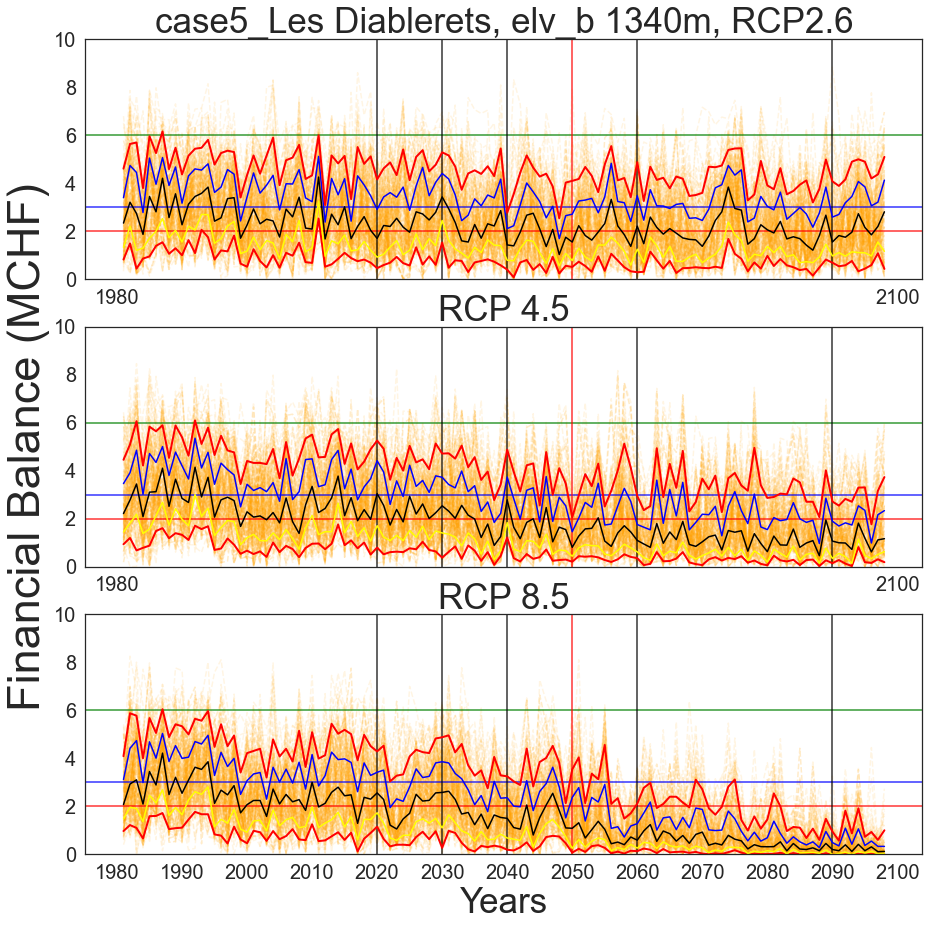

In [94]:
fig19, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_fin26), p_Step):
    a = matrix_fin26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_fin45), p_Step):
    a = matrix_fin45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_fin85), p_Step):
    a = matrix_fin85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)    

axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=6, color='green', alpha=0.8)
axs[0].axhline(y=3, color='blue', alpha=0.8)
axs[0].axhline(y=2, color='red', alpha=0.8)

axs[1].axhline(y=6, color='green', alpha=0.8)
axs[1].axhline(y=3, color='blue', alpha=0.8)
axs[1].axhline(y=2, color='red', alpha=0.8)

axs[2].axhline(y=6, color='green', alpha=0.8)
axs[2].axhline(y=3, color='blue', alpha=0.8)
axs[2].axhline(y=2, color='red', alpha=0.8)


axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)

axs[0].plot(x_axis, q10_years_fin_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_fin_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_fin_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_fin_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_fin_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_fin_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_fin_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_fin_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_fin_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_fin_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_fin_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_fin_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_fin_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_fin_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_fin_85, color='red', linewidth = 2, alpha=1)


axs[0].set_ylim(bottom=0, top =10)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days With Good Snow Condition', fontsize=12)

axs[1].set_ylim(bottom=0, top =10)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Financial Balance (MCHF)', fontsize=45)

axs[2].set_ylim(bottom=0, top =10
               )
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days With Good Snow Condition', fontsize=12)


fig19.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Financial.svg'), format='svg', dpi=300)
fig19.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Financial.tiff'), format='tiff', dpi=150)


plt.show()

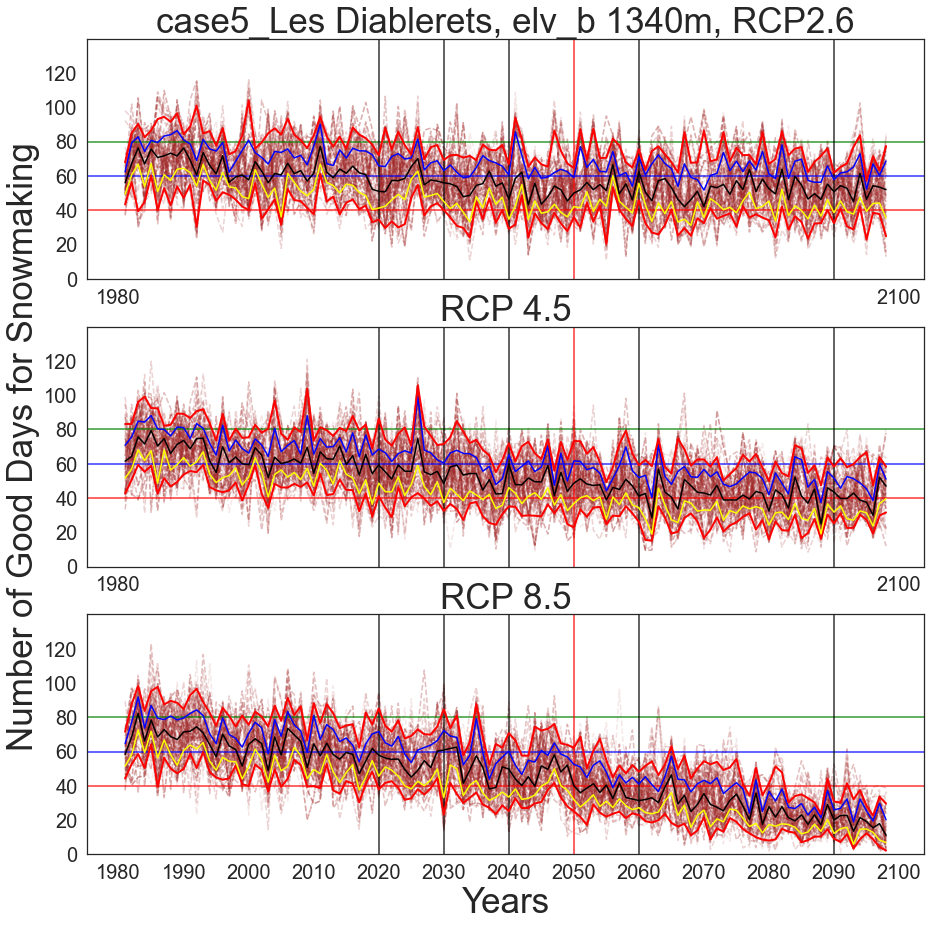

In [95]:
fig20, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Art26), p_Step):
    a = matrix_Art26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Art45), p_Step):
    a = matrix_Art45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Art85), p_Step):
    a = matrix_Art85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)    

    
    
    
axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].yaxis.set_ticks(np.arange(0, 140, 20))
axs[1].yaxis.set_ticks(np.arange(0, 140, 20))
axs[2].yaxis.set_ticks(np.arange(0, 140, 20))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=60, color='blue', alpha=0.8)
axs[0].axhline(y=40, color='red', alpha=0.8)

axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=60, color='blue', alpha=0.8)
axs[1].axhline(y=40, color='red', alpha=0.8)

axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=60, color='blue', alpha=0.8)
axs[2].axhline(y=40, color='red', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Art_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_Art_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_Art_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_Art_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_Art_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_Art_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_Art_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_Art_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_Art_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_Art_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_Art_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_Art_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_Art_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_Art_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_Art_85, color='red', linewidth = 2, alpha=1)



axs[0].set_ylim(bottom=0, top =140)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days with Artificial Snow Possibility', fontsize=12)

axs[1].set_ylim(bottom=0, top =140)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Number of Good Days for Snowmaking', fontsize=35)

axs[2].set_ylim(bottom=0, top =140)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days with Artificial Snow Possibility', fontsize=12)


fig20.savefig(os.path.join(rootVisualization, 'RCP26_45_85_ArtificialSnow.svg'), format='svg', dpi=300)
fig20.savefig(os.path.join(rootVisualization, 'RCP26_45_85_ArtificialSnow.tiff'), format='tiff', dpi=150)


plt.show()

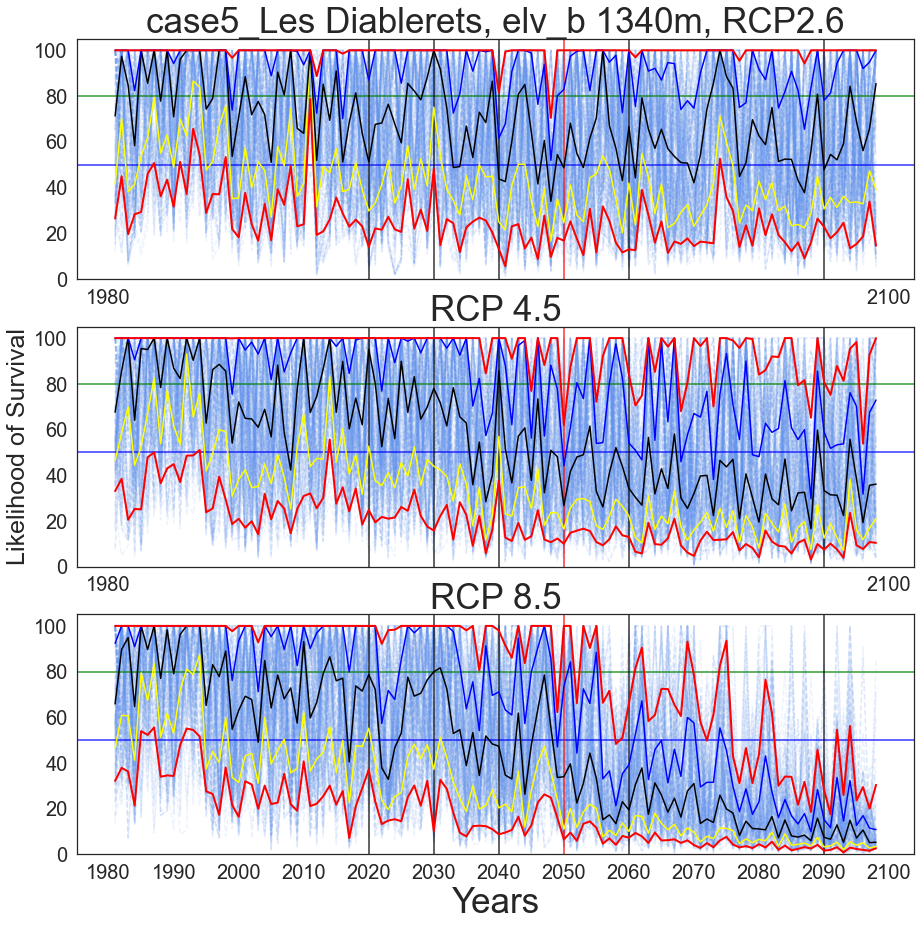

In [96]:
fig21, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Like26), p_Step):
    a = matrix_Like26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Like45), p_Step):
    a = matrix_Like45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Like85), p_Step):
    a = matrix_Like85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)    


axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].yaxis.set_ticks(np.arange(0, 140, 20))
axs[1].yaxis.set_ticks(np.arange(0, 140, 20))
axs[2].yaxis.set_ticks(np.arange(0, 140, 20))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)    
    

axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=50, color='blue', alpha=0.8)
axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=50, color='blue', alpha=0.8)
axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=50, color='blue', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Like_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_Like_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_Like_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_Like_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_Like_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_Like_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_Like_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_Like_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_Like_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_Like_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_Like_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_Like_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_Like_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_Like_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_Like_85, color='red', linewidth = 2, alpha=1)


axs[0].set_ylim(bottom=0, top =105)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Likelihood of Survival', fontsize=12)

axs[1].set_ylim(bottom=0, top =105)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Likelihood of Survival', fontsize=25)

axs[2].set_ylim(bottom=0, top =105)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)


axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Likelihood of Survival', fontsize=12)


fig21.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Likelihood_Survival.svg'), format='svg', dpi=300)
fig21.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Likelihood_Survival.tiff'), format='tiff', dpi=150)


plt.show()

In [97]:
dfAllAverages.head()

,median26,median45,median85
0,57.044964,52.575667,51.545645
1,75.677273,68.833714,70.743289
2,67.618231,85.229000,75.014606
3,45.725700,50.517250,51.372975
4,82.050296,74.590000,83.741741


### Worst Case: Quantile 0.10 >> 90% of the scenarios satisfy this condition

In [98]:
title_Figs2 = 'Les Diablerets,1340m'

In [99]:
y_axis = np.arange(1981, 2100, step= 20)

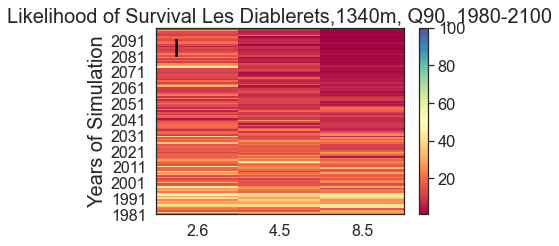

In [100]:
from matplotlib.ticker import FuncFormatter


fig22, (ax3) = plt.subplots(1, 1, figsize=(9,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c3 = ax3.pcolor(dfAllAverages_Q10, cmap='Spectral', vmin=1, vmax=100, offsets = 0.35)
cb3 = fig22.colorbar(c3)

#xticks(np.arange(0, 4, step=1))
ax3.set_title('default: no edges')


#ax3.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax3.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q90, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax3.text(0.2, 100, 'I', color = 'Black', fontsize=25)

fig22.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.svg'), format='svg', dpi=300)
fig22.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.tiff'), format='tiff', dpi=300)


fig22.tight_layout()
plt.show()

### Median Case: Quantile 0.5 >> 50 % of the scenarios satisfy this condition

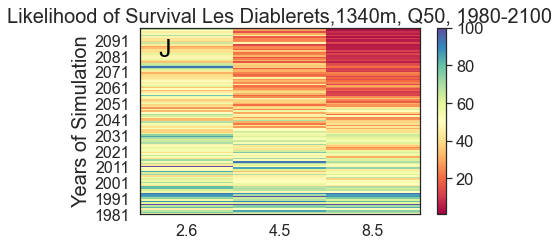

In [101]:
from matplotlib.ticker import FuncFormatter


fig23, (ax4) = plt.subplots(1, 1, figsize=(9.5,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages, cmap='Spectral' ,vmin=1, vmax=100, offsets = .35)
cb4 = fig23.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


#ax4.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax4.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q50, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax4.text(0.2, 100, 'J', color = 'Black', fontsize=25)


fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.svg'), format='svg', dpi=300)
fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.tiff'), format='tiff', dpi=300)
#fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.jpg'), format='jpg', dpi=300)


fig23.tight_layout()
plt.show()

### Best Case: Quantile 0.9 >> Only 10 % of the scenarios satisfy this condition

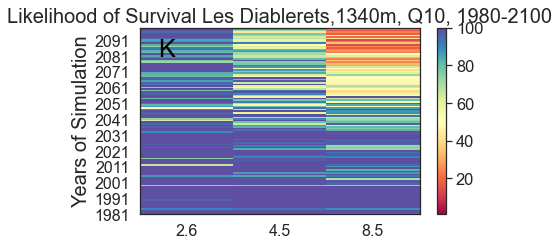

In [102]:
from matplotlib.ticker import FuncFormatter


fig24, (ax4) = plt.subplots(1, 1, figsize=(9.5,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages_Q90, cmap='Spectral' ,vmin=1, vmax=100)
cb4 = fig24.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


#ax4.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax4.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q10, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax4.text(0.2, 100, 'K', color = 'Black', fontsize=25)


fig24.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q10.svg'), format='svg', dpi=300)
fig24.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q10.tiff'), format='tiff', dpi=300)



fig24.tight_layout()
plt.show()

### Making dataframes for all RCP2.6 , RCP4.5, and RCP8.5 scenarios

In [103]:
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(matrix_GoodDays.shape)

(3015, 119, 2)
(3015, 119, 2)
(2970, 119, 2)
(9000, 119, 2)


In [104]:
pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1]).head()

,Season
0,1981-1982
1,1982-1983
2,1983-1984
3,1984-1985
4,1985-1986


In [105]:
df26_all = pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1])
for i in range(len(matrix_GoodDays26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays26[i,0,1:])])
    df26_all = pd.concat((df26_all, b), axis = 1)

In [106]:
df26_all.head(7)
df26_all.to_csv(os.path.join(rootVisualization, 'df26_all.csv'), index = False)

In [107]:
matrix_GoodDays45[2,0,1:]

array(['isOverSnow_sc_45_16'], dtype='<U47')

In [108]:
df45_all = pd.DataFrame((matrix_GoodDays45[0][1:,0:1]), columns=matrix_GoodDays45[0,0,0:1])
for i in range(len(matrix_GoodDays45)):
    #b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=matrix_GoodDays45[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays45[i,0,1:])])

    df45_all = pd.concat((df45_all, b), axis = 1)

In [109]:
df45_all.head(7)
df45_all.to_csv(os.path.join(rootVisualization, 'df45_all.csv'), index = False)

In [110]:
df85_all = pd.DataFrame((matrix_GoodDays85[0][1:,0:1]), columns=matrix_GoodDays85[0,0,0:1])
for i in range(len(matrix_GoodDays85)):
    #b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=matrix_GoodDays85[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays85[i,0,1:])])

    df85_all = pd.concat((df85_all, b), axis = 1)

In [111]:
df85_all.head(7)
df85_all.to_csv(os.path.join(rootVisualization, 'df85_all.csv'), index = False)

In [112]:
df26_all_Matrix = df26_all.to_numpy()
df45_all_Matrix = df45_all.to_numpy()
df85_all_Matrix = df85_all.to_numpy()

In [113]:
df26_all_fin = pd.DataFrame((matrix_fin26[0][1:,0:1]), columns=matrix_fin26[0,0,0:1])
for i in range(len(matrix_fin26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin26[i,0,1:])])
    df26_all_fin = pd.concat((df26_all_fin, b), axis = 1)

In [114]:
df26_all_fin.head(7)

,Season,sc_1_['Money_sc_26_8'],sc_2_['Money_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_3_['Money_sc_26_8'],sc_4_['Money_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_5_['Money_sc_26_7'],sc_6_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_7_['Money_sc_26_2'],sc_8_['Money_sc_26_5'],sc_9_['Money_sc_26_11'],sc_10_['Money_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_11_['Money_sc_26_7'],sc_12_['Money_sc_26_3'],sc_13_['Money_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_14_['Money_sc_26_7'],sc_15_['Money_sc_26_8'],sc_16_['Money_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_17_['Money_sc_26_5'],sc_18_['Money_sc_26_5'],sc_19_['Money_sc_26_9'],sc_20_['Money_sc_26_2'],sc_21_['Money_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_22_['Money_sc_26_9'],sc_23_['Money_sc_26_3'],sc_24_['Money_sc_26_12'],sc_25_['Money_sc_26_9'],sc_26_['Money_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_27_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_28_['Money_sc_26_4'],sc_29_['Money_sc_26_10'],sc_30_['Money_sc_26_8'],sc_31_['Money_sc_26_9'],sc_32_['Money_sc_26_6'],sc_33_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],...,sc_2982_['Money_sc_26_3'],sc_2983_['Money_sc_26_8'],sc_2984_['Money_sc_26_11'],sc_2985_['Money_sc_26_9'],sc_2986_['Money_sc_26_6'],sc_2987_['Money_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_2988_['Money_sc_26_11'],sc_2989_['Money_sc_26_8'],sc_2990_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_2991_['Money_sc_26_10'],sc_2992_['Money_sc_26_6'],sc_2993_['Money_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2994_['Money_sc_26_5'],sc_2995_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2996_['Money_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_2997_['Money_sc_26_6'],sc_2998_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2999_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_3000_['Money_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_3001_['Money_sc_26_8'],sc_3002_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_3003_['Money_sc_26_7'],sc_3004_['Money_sc_26_10'],sc_3005_['Money_sc_26_2'],sc_3006_['Money_sc_26_10'],sc_3007_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_3008_['Money_sc_26_4'],sc_3009_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_3010_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_3011_['Money_sc_26_6'],sc_3012_['Money_sc_26_3'],sc_3013_['Money_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_3014_['Money_sc_26_10'],sc_3015_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp']
0,1981-1982,2.459999999999998,1.420000000000001,1.5800000000000012,2.5199999999999982,3.1700000000000004,1.9900000000000015,1.1100000000000008,0.7900000000000005,2.35,1.7700000000000014,0.4100000000000002,2.0799999999999996,0.7700000000000005,0.7300000000000004,0.8600000000000005,1.1100000000000008,2.819999999999999,3.9999999999999942,0.7700000000000005,1.1100000000000008,2.2299999999999978,0.26000000000000006,3.4500000000000015,0.9700000000000006,4.229999999999996,0.8600000000000005,1.6700000000000013,0.46000000000000024,2.449999999999999,3.949999999999997,0.5900000000000003,3.229999999999997,2.4099999999999957,...,2.5199999999999987,2.6999999999999975,2.469999999999999,0.35000000000000014,3.2699999999999965,0.6500000000000004,0.9400000000000006,0.8800000000000006,1.7700000000000014,1.7300000000000013,2.369999999999999,4.15,0.8200000000000005,1.8200000000000014,2.010000000000001,3.169999999999995,2.31,2.3899999999999992,1.9900000000000013,1.350000000000001,1.6200000000000012,0.7300000000000004,1.390000000000001,1.0300000000000007,2.100000000000001,2.1199999999999988,1.2400000000000009,2.3000000000000003,2.3499999999999965,2.879999999999995,3.9600000000000004,4.169999999999999,1.320000000000001,1.1200000000000008
1,1982-1983,4.719999999999996,3.2299999999999915,2.940000000000002,3.4699999999999966,2.5799999999999965,2.2899999999999996,2.8299999999999965,0.21000000000000005,3.6999999999999926,2.909999999999997,0.7600000000000005,2.1799999999999975,2.4400000000000004,1.270000000000001,1.8400000000000014,2.2199999999999966,4.7200000000000015,5.180000000000005,5.0400000000000045,1.6300000000000012,3.1799999999999935,4.510000000000006,3.4399999999999973,2.020000000

In [115]:
df45_all_fin = pd.DataFrame((matrix_fin45[0][1:,0:1]), columns=matrix_fin45[0,0,0:1])
for i in range(len(matrix_fin45)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin45[i,0,1:])])
    df45_all_fin = pd.concat((df45_all_fin, b), axis = 1)

In [116]:
df45_all_fin.head(7)

,Season,sc_1_['Money_sc_45_6'],sc_2_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_3_['Money_sc_45_16'],sc_4_['Money_sc_45_25'],sc_5_['Money_SMHI-RCA-HADGEM-EUR44-RCP45-pcp'],sc_6_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP45-pcp'],sc_7_['Money_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_8_['Money_SMHI-RCA-MIROC-EUR44-RCP45-pcp'],sc_9_['Money_SMHI-RCA-GFDL-EUR44-RCP45-pcp'],sc_10_['Money_sc_45_25'],sc_11_['Money_sc_45_12'],sc_12_['Money_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_13_['Money_sc_45_15'],sc_14_['Money_sc_45_19'],sc_15_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_16_['Money_sc_45_21'],sc_17_['Money_sc_45_15'],sc_18_['Money_KNMI-RACMO-ECEARTH-EUR44-RCP45-pcp'],sc_19_['Money_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_20_['Money_sc_45_19'],sc_21_['Money_sc_45_20'],sc_22_['Money_SMHI-RCA-ECEARTH-EUR11-RCP45-pcp'],sc_23_['Money_sc_45_4'],sc_24_['Money_sc_45_14'],sc_25_['Money_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_26_['Money_sc_45_23'],sc_27_['Money_SMHI-RCA-MPIESM-EUR44-RCP45-pcp'],sc_28_['Money_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_29_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_30_['Money_SMHI-RCA-MIROC-EUR44-RCP45-pcp'],sc_31_['Money_sc_45_14'],sc_32_['Money_sc_45_4'],sc_33_['Money_sc_45_2'],...,sc_2982_['Money_sc_45_21'],sc_2983_['Money_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_2984_['Money_sc_45_2'],sc_2985_['Money_sc_45_10'],sc_2986_['Money_SMHI-RCA-MIROC-EUR44-RCP45-pcp'],sc_2987_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_2988_['Money_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_2989_['Money_sc_45_8'],sc_2990_['Money_sc_45_14'],sc_2991_['Money_sc_45_12'],sc_2992_['Money_sc_45_14'],sc_2993_['Money_sc_45_8'],sc_2994_['Money_sc_45_11'],sc_2995_['Money_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_2996_['Money_sc_45_15'],sc_2997_['Money_sc_45_7'],sc_2998_['Money_sc_45_11'],sc_2999_['Money_sc_45_24'],sc_3000_['Money_sc_45_1'],sc_3001_['Money_sc_45_1'],sc_3002_['Money_sc_45_11'],sc_3003_['Money_sc_45_6'],sc_3004_['Money_sc_45_7'],sc_3005_['Money_SMHI-RCA-HADGEM-EUR44-RCP45-pcp'],sc_3006_['Money_sc_45_10'],sc_3007_['Money_sc_45_10'],sc_3008_['Money_sc_45_20'],sc_3009_['Money_SMHI-RCA-MPIESM-EUR44-RCP45-pcp'],sc_3010_['Money_sc_45_5'],sc_3011_['Money_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_3012_['Money_sc_45_1'],sc_3013_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP45-pcp'],sc_3014_['Money_sc_45_6'],sc_3015_['Money_sc_45_20']
0,1981-1982,1.0400000000000007,1.7700000000000014,1.1200000000000008,1.390000000000001,1.9600000000000013,0.8200000000000005,2.699999999999997,3.2899999999999943,0.7900000000000005,1.340000000000001,1.7700000000000014,2.4899999999999975,1.2200000000000009,0.8500000000000005,1.7800000000000014,1.340000000000001,1.5400000000000011,2.12,0.38000000000000017,0.8400000000000005,2.639999999999999,1.380000000000001,3.3299999999999956,3.8899999999999983,1.7800000000000014,1.370000000000001,0.6700000000000004,3.259999999999997,1.7300000000000013,3.5899999999999914,3.449999999999999,3.3099999999999956,2.3199999999999985,...,1.360000000000001,2.689999999999997,1.370000000000001,2.879999999999996,3.0299999999999963,1.8300000000000014,0.6000000000000003,3.239999999999996,4.6300000000000034,2.399999999999998,3.5000000000000004,2.380000000000001,3.0399999999999974,2.23,3.269999999999995,1.1700000000000008,3.4799999999999986,0.18000000000000002,1.340000000000001,2.819999999999998,3.0399999999999974,1.3100000000000007,1.6600000000000013,2.1199999999999997,1.2200000000000009,0.8100000000000005,1.8900000000000015,0.7800000000000005,3.3199999999999927,0.5600000000000003,2.0300000000000007,1.410000000000001,0.7800000000000005,1.1100000000000008
1,1982-1983,2.369999999999996,2.2800000000000002,1.9300000000000015,2.759999999999996,4.440000000000001,2.0400000000000005,1.1900000000000008,1.5600000000000012,2.3700000000000014,2.3500000000000005,1.6700000000000013,4.680000000000003,1.0000000000000007,1.370000000000001,2.38,1.7200000000000013,1.280000000000001,3.31,1.270000000000001,1.2500000000000009,0.5500000000000003,2.2799999999999963,1.1100000000000008,3.1199999

In [117]:
df85_all_fin = pd.DataFrame((matrix_fin85[0][1:,0:1]), columns=matrix_fin85[0,0,0:1])
for i in range(len(matrix_fin85)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin85[i,0,1:])])
    df85_all_fin = pd.concat((df85_all_fin, b), axis = 1)

In [118]:
df85_all_fin.head(7)

,Season,sc_1_['Money_sc_85_7'],sc_2_['Money_SMHI-RCA-MPIESM-EUR11-RCP85-pcp'],sc_3_['Money_sc_85_7'],sc_4_['Money_sc_85_2'],sc_5_['Money_SMHI-RCA-MPIESM-EUR11-RCP85-pcp'],sc_6_['Money_sc_85_14'],sc_7_['Money_sc_85_5'],sc_8_['Money_sc_85_1'],sc_9_['Money_SMHI-RCA-GFDL-EUR44-RCP85-pcp'],sc_10_['Money_SMHI-RCA-NORESM-EUR44-RCP85-pcp'],sc_11_['Money_sc_85_2'],sc_12_['Money_sc_85_2'],sc_13_['Money_CLMCOM-CCLM4-MPIESM-EUR44-RCP85-pcp'],sc_14_['Money_sc_85_28'],sc_15_['Money_sc_85_22'],sc_16_['Money_SMHI-RCA-GFDL-EUR44-RCP85-pcp'],sc_17_['Money_sc_85_24'],sc_18_['Money_SMHI-RCA-IPSL-EUR44-RCP85-pcp'],sc_19_['Money_sc_85_26'],sc_20_['Money_sc_85_6'],sc_21_['Money_sc_85_11'],sc_22_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_23_['Money_sc_85_24'],sc_24_['Money_sc_85_30'],sc_25_['Money_sc_85_5'],sc_26_['Money_sc_85_24'],sc_27_['Money_sc_85_12'],sc_28_['Money_CLMCOM-CCLM5-MPIESM-EUR44-RCP85-pcp'],sc_29_['Money_CLMCOM-CCLM5-MIROC-EUR44-RCP85-pcp'],sc_30_['Money_sc_85_22'],sc_31_['Money_SMHI-RCA-ECEARTH-EUR11-RCP85-pcp'],sc_32_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP85-pcp'],sc_33_['Money_sc_85_2'],...,sc_2937_['Money_sc_85_6'],sc_2938_['Money_sc_85_11'],sc_2939_['Money_sc_85_6'],sc_2940_['Money_sc_85_20'],sc_2941_['Money_sc_85_20'],sc_2942_['Money_SMHI-RCA-IPSL-EUR44-RCP85-pcp'],sc_2943_['Money_sc_85_14'],sc_2944_['Money_sc_85_10'],sc_2945_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP85-pcp'],sc_2946_['Money_sc_85_27'],sc_2947_['Money_sc_85_30'],sc_2948_['Money_sc_85_7'],sc_2949_['Money_sc_85_1'],sc_2950_['Money_sc_85_6'],sc_2951_['Money_sc_85_24'],sc_2952_['Money_sc_85_16'],sc_2953_['Money_sc_85_20'],sc_2954_['Money_SMHI-RCA-CSIRO-EUR44-RCP85-pcp'],sc_2955_['Money_sc_85_14'],sc_2956_['Money_sc_85_29'],sc_2957_['Money_sc_85_13'],sc_2958_['Money_sc_85_18'],sc_2959_['Money_sc_85_14'],sc_2960_['Money_SMHI-RCA-ECEARTH-EUR44-RCP85-pcp'],sc_2961_['Money_sc_85_8'],sc_2962_['Money_sc_85_19'],sc_2963_['Money_sc_85_10'],sc_2964_['Money_CLMCOM-CCLM4-HADGEM-EUR44-RCP85-pcp'],sc_2965_['Money_sc_85_9'],sc_2966_['Money_DMI-HIRHAM-ECEARTH-EUR44-RCP85-pcp'],sc_2967_['Money_sc_85_14'],sc_2968_['Money_sc_85_17'],sc_2969_['Money_sc_85_29'],sc_2970_['Money_sc_85_4']
0,1981-1982,1.420000000000001,1.1300000000000008,0.8700000000000006,1.9600000000000015,0.7000000000000004,1.460000000000001,1.360000000000001,3.27,0.8600000000000005,2.8699999999999974,1.460000000000001,1.5300000000000011,1.1600000000000008,1.9800000000000013,2.5999999999999988,0.7300000000000004,1.6700000000000013,2.8099999999999974,1.260000000000001,0.9200000000000006,3.08,1.9500000000000015,1.9700000000000015,1.6600000000000013,0.8500000000000005,1.9000000000000015,0.8200000000000005,0.9100000000000006,1.8000000000000014,3.8200000000000003,1.7700000000000014,1.1300000000000008,1.430000000000001,...,1.0100000000000007,1.8000000000000014,0.9100000000000006,4.119999999999997,3.1199999999999943,2.5200000000000005,3.689999999999991,1.7800000000000014,2.3099999999999996,1.9900000000000013,1.8100000000000014,1.320000000000001,3.0299999999999967,1.8600000000000012,1.0700000000000007,0.3000000000000001,4.5500000000000025,0.4100000000000002,1.5600000000000012,1.500000000000001,1.4800000000000009,1.330000000000001,1.440000000000001,2.0899999999999994,3.419999999999992,1.6800000000000013,0.5300000000000002,2.119999999999999,1.7400000000000013,1.460000000000001,1.330000000000001,0.7400000000000004,1.2500000000000009,3.069999999999995
1,1982-1983,1.490000000000001,3.2099999999999973,0.8000000000000005,3.9999999999999964,2.25,1.8800000000000014,5.760000000000006,2.7599999999999936,3.219999999999997,0.36000000000000015,3.909999999999996,2.0500000000000003,2.4100000000000006,2.0400000000000005,0.6700000000000004,2.410000000000002,4.560000000000005,1.9600000000000015,2.3500000000000005,3.7499999999999942,1.5200000000000011,2.4999999999999987,5.400000000000002,2.27,1.8600000000000014,5.390000000000002,1.9600000000000015,1.9000000000000015,1.7400000000000013,1.0600000000000007,2.5699999999999963,2.440000000000001,3.36999

In [119]:
df26_all_Art = pd.DataFrame((matrix_Art26[0][1:,0:1]), columns=matrix_Art26[0,0,0:1])
for i in range(len(matrix_Art26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art26[i,0,1:])])
    df26_all_Art = pd.concat((df26_all_Art, b), axis = 1)

In [120]:
df26_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_sc_26_8'],sc_2_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_3_['ArtSnowPossibility_sc_26_8'],sc_4_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_5_['ArtSnowPossibility_sc_26_7'],sc_6_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_7_['ArtSnowPossibility_sc_26_2'],sc_8_['ArtSnowPossibility_sc_26_5'],sc_9_['ArtSnowPossibility_sc_26_11'],sc_10_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_11_['ArtSnowPossibility_sc_26_7'],sc_12_['ArtSnowPossibility_sc_26_3'],sc_13_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_14_['ArtSnowPossibility_sc_26_7'],sc_15_['ArtSnowPossibility_sc_26_8'],sc_16_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_17_['ArtSnowPossibility_sc_26_5'],sc_18_['ArtSnowPossibility_sc_26_5'],sc_19_['ArtSnowPossibility_sc_26_9'],sc_20_['ArtSnowPossibility_sc_26_2'],sc_21_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_22_['ArtSnowPossibility_sc_26_9'],sc_23_['ArtSnowPossibility_sc_26_3'],sc_24_['ArtSnowPossibility_sc_26_12'],sc_25_['ArtSnowPossibility_sc_26_9'],sc_26_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_27_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_28_['ArtSnowPossibility_sc_26_4'],sc_29_['ArtSnowPossibility_sc_26_10'],sc_30_['ArtSnowPossibility_sc_26_8'],sc_31_['ArtSnowPossibility_sc_26_9'],sc_32_['ArtSnowPossibility_sc_26_6'],sc_33_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],...,sc_2982_['ArtSnowPossibility_sc_26_3'],sc_2983_['ArtSnowPossibility_sc_26_8'],sc_2984_['ArtSnowPossibility_sc_26_11'],sc_2985_['ArtSnowPossibility_sc_26_9'],sc_2986_['ArtSnowPossibility_sc_26_6'],sc_2987_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_2988_['ArtSnowPossibility_sc_26_11'],sc_2989_['ArtSnowPossibility_sc_26_8'],sc_2990_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_2991_['ArtSnowPossibility_sc_26_10'],sc_2992_['ArtSnowPossibility_sc_26_6'],sc_2993_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2994_['ArtSnowPossibility_sc_26_5'],sc_2995_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2996_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_2997_['ArtSnowPossibility_sc_26_6'],sc_2998_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2999_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_3000_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_3001_['ArtSnowPossibility_sc_26_8'],sc_3002_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_3003_['ArtSnowPossibility_sc_26_7'],sc_3004_['ArtSnowPossibility_sc_26_10'],sc_3005_['ArtSnowPossibility_sc_26_2'],sc_3006_['ArtSnowPossibility_sc_26_10'],sc_3007_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_3008_['ArtSnowPossibility_sc_26_4'],sc_3009_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_3010_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_3011_['ArtSnowPossibility_sc_26_6'],sc_3012_['ArtSnowPossibility_sc_26_3'],sc_3013_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_3014_['ArtSnowPossibility_sc_26_10'],sc_3015_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp']
0,1981-1982,51.59999999999998,62.37,51.59999999999998,62.540000000000006,59.17,54.7,59.08999999999999,63.71000000000001,42.57,60.329999999999984,48.42999999999999,73.57999999999998,54.13000000000001,51.790000000000006,57.20000000000001,49.85,92.26,98.02000000000001,37.06999999999999,53.26,49.72000000000002,43.72999999999999,70.63,57.319999999999986,49.040000000000006,61.989999999999995,65.26,43.870000000000005,63.079999999999984,46.1,37.22,57.77999999999999,65.81,...,70.63,46.1,52.550000000000004,43.32000000000001,48.90000000000001,48.690000000000005,50.35000000000001,49.35,53.530000000000015,56.26,52.56999999999999,62.4,60.54,53.23000000000002,72.24999999999999,50.059999999999995,39.77,46.81999999999999,60.059999999999995,55.94,67.9,41.300000000000004,49.34000000000001,57.25,64.97999999999998,60.879999999

In [121]:
df45_all_Art = pd.DataFrame((matrix_Art45[0][1:,0:1]), columns=matrix_Art45[0,0,0:1])
for i in range(len(matrix_Art45)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art45[i,0,1:])])
    df45_all_Art = pd.concat((df45_all_Art, b), axis = 1)

In [122]:
df45_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_sc_45_6'],sc_2_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_3_['ArtSnowPossibility_sc_45_16'],sc_4_['ArtSnowPossibility_sc_45_25'],sc_5_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP45-pcp'],sc_6_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP45-pcp'],sc_7_['ArtSnowPossibility_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_8_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP45-pcp'],sc_9_['ArtSnowPossibility_SMHI-RCA-GFDL-EUR44-RCP45-pcp'],sc_10_['ArtSnowPossibility_sc_45_25'],sc_11_['ArtSnowPossibility_sc_45_12'],sc_12_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_13_['ArtSnowPossibility_sc_45_15'],sc_14_['ArtSnowPossibility_sc_45_19'],sc_15_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_16_['ArtSnowPossibility_sc_45_21'],sc_17_['ArtSnowPossibility_sc_45_15'],sc_18_['ArtSnowPossibility_KNMI-RACMO-ECEARTH-EUR44-RCP45-pcp'],sc_19_['ArtSnowPossibility_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_20_['ArtSnowPossibility_sc_45_19'],sc_21_['ArtSnowPossibility_sc_45_20'],sc_22_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP45-pcp'],sc_23_['ArtSnowPossibility_sc_45_4'],sc_24_['ArtSnowPossibility_sc_45_14'],sc_25_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_26_['ArtSnowPossibility_sc_45_23'],sc_27_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP45-pcp'],sc_28_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_29_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_30_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP45-pcp'],sc_31_['ArtSnowPossibility_sc_45_14'],sc_32_['ArtSnowPossibility_sc_45_4'],sc_33_['ArtSnowPossibility_sc_45_2'],...,sc_2982_['ArtSnowPossibility_sc_45_21'],sc_2983_['ArtSnowPossibility_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_2984_['ArtSnowPossibility_sc_45_2'],sc_2985_['ArtSnowPossibility_sc_45_10'],sc_2986_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP45-pcp'],sc_2987_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_2988_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_2989_['ArtSnowPossibility_sc_45_8'],sc_2990_['ArtSnowPossibility_sc_45_14'],sc_2991_['ArtSnowPossibility_sc_45_12'],sc_2992_['ArtSnowPossibility_sc_45_14'],sc_2993_['ArtSnowPossibility_sc_45_8'],sc_2994_['ArtSnowPossibility_sc_45_11'],sc_2995_['ArtSnowPossibility_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_2996_['ArtSnowPossibility_sc_45_15'],sc_2997_['ArtSnowPossibility_sc_45_7'],sc_2998_['ArtSnowPossibility_sc_45_11'],sc_2999_['ArtSnowPossibility_sc_45_24'],sc_3000_['ArtSnowPossibility_sc_45_1'],sc_3001_['ArtSnowPossibility_sc_45_1'],sc_3002_['ArtSnowPossibility_sc_45_11'],sc_3003_['ArtSnowPossibility_sc_45_6'],sc_3004_['ArtSnowPossibility_sc_45_7'],sc_3005_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP45-pcp'],sc_3006_['ArtSnowPossibility_sc_45_10'],sc_3007_['ArtSnowPossibility_sc_45_10'],sc_3008_['ArtSnowPossibility_sc_45_20'],sc_3009_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP45-pcp'],sc_3010_['ArtSnowPossibility_sc_45_5'],sc_3011_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_3012_['ArtSnowPossibility_sc_45_1'],sc_3013_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP45-pcp'],sc_3014_['ArtSnowPossibility_sc_45_6'],sc_3015_['ArtSnowPossibility_sc_45_20']
0,1981-1982,43.92000000000001,64.54,69.88000000000001,70.24,57.18,55.15,95.17,64.46999999999998,66.95,60.830000000000005,43.54999999999998,60.85000000000001,45.160000000000004,50.25,62.900000000000006,72.26,51.970000000000006,73.23000000000002,43.709999999999994,49.58,74.82,64.60000000000001,76.84,82.42,54.67000000000001,58.06999999999998,54.059999999999995,58.07,68.22,70.58,89.11000000000001,72.40999999999998,64.49000000000001,...,70.80000000000001,98.94000000000001,56.34000000000001,62.06999999999999,63.629999999999995,61.579999999999984,54.14999999999999,43.15,83.19,44.61000000000001,87.08000000000001,39.24000000000001,76.3,52.77,79.30000000000003,41.89,74.29,40.30000000000001,33.339999999999996,42.59,68.68000000000004,52.16,37.75,52.74999999999999,58.76,64.36999999999999,85.28,51.

In [123]:
df85_all_Art = pd.DataFrame((matrix_Art85[0][1:,0:1]), columns=matrix_Art85[0,0,0:1])
for i in range(len(matrix_Art85)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art85[i,0,1:])])
    df85_all_Art = pd.concat((df85_all_Art, b), axis = 1)

In [124]:
df85_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_sc_85_7'],sc_2_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR11-RCP85-pcp'],sc_3_['ArtSnowPossibility_sc_85_7'],sc_4_['ArtSnowPossibility_sc_85_2'],sc_5_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR11-RCP85-pcp'],sc_6_['ArtSnowPossibility_sc_85_14'],sc_7_['ArtSnowPossibility_sc_85_5'],sc_8_['ArtSnowPossibility_sc_85_1'],sc_9_['ArtSnowPossibility_SMHI-RCA-GFDL-EUR44-RCP85-pcp'],sc_10_['ArtSnowPossibility_SMHI-RCA-NORESM-EUR44-RCP85-pcp'],sc_11_['ArtSnowPossibility_sc_85_2'],sc_12_['ArtSnowPossibility_sc_85_2'],sc_13_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR44-RCP85-pcp'],sc_14_['ArtSnowPossibility_sc_85_28'],sc_15_['ArtSnowPossibility_sc_85_22'],sc_16_['ArtSnowPossibility_SMHI-RCA-GFDL-EUR44-RCP85-pcp'],sc_17_['ArtSnowPossibility_sc_85_24'],sc_18_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR44-RCP85-pcp'],sc_19_['ArtSnowPossibility_sc_85_26'],sc_20_['ArtSnowPossibility_sc_85_6'],sc_21_['ArtSnowPossibility_sc_85_11'],sc_22_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_23_['ArtSnowPossibility_sc_85_24'],sc_24_['ArtSnowPossibility_sc_85_30'],sc_25_['ArtSnowPossibility_sc_85_5'],sc_26_['ArtSnowPossibility_sc_85_24'],sc_27_['ArtSnowPossibility_sc_85_12'],sc_28_['ArtSnowPossibility_CLMCOM-CCLM5-MPIESM-EUR44-RCP85-pcp'],sc_29_['ArtSnowPossibility_CLMCOM-CCLM5-MIROC-EUR44-RCP85-pcp'],sc_30_['ArtSnowPossibility_sc_85_22'],sc_31_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP85-pcp'],sc_32_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP85-pcp'],sc_33_['ArtSnowPossibility_sc_85_2'],...,sc_2937_['ArtSnowPossibility_sc_85_6'],sc_2938_['ArtSnowPossibility_sc_85_11'],sc_2939_['ArtSnowPossibility_sc_85_6'],sc_2940_['ArtSnowPossibility_sc_85_20'],sc_2941_['ArtSnowPossibility_sc_85_20'],sc_2942_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR44-RCP85-pcp'],sc_2943_['ArtSnowPossibility_sc_85_14'],sc_2944_['ArtSnowPossibility_sc_85_10'],sc_2945_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP85-pcp'],sc_2946_['ArtSnowPossibility_sc_85_27'],sc_2947_['ArtSnowPossibility_sc_85_30'],sc_2948_['ArtSnowPossibility_sc_85_7'],sc_2949_['ArtSnowPossibility_sc_85_1'],sc_2950_['ArtSnowPossibility_sc_85_6'],sc_2951_['ArtSnowPossibility_sc_85_24'],sc_2952_['ArtSnowPossibility_sc_85_16'],sc_2953_['ArtSnowPossibility_sc_85_20'],sc_2954_['ArtSnowPossibility_SMHI-RCA-CSIRO-EUR44-RCP85-pcp'],sc_2955_['ArtSnowPossibility_sc_85_14'],sc_2956_['ArtSnowPossibility_sc_85_29'],sc_2957_['ArtSnowPossibility_sc_85_13'],sc_2958_['ArtSnowPossibility_sc_85_18'],sc_2959_['ArtSnowPossibility_sc_85_14'],sc_2960_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP85-pcp'],sc_2961_['ArtSnowPossibility_sc_85_8'],sc_2962_['ArtSnowPossibility_sc_85_19'],sc_2963_['ArtSnowPossibility_sc_85_10'],sc_2964_['ArtSnowPossibility_CLMCOM-CCLM4-HADGEM-EUR44-RCP85-pcp'],sc_2965_['ArtSnowPossibility_sc_85_9'],sc_2966_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR44-RCP85-pcp'],sc_2967_['ArtSnowPossibility_sc_85_14'],sc_2968_['ArtSnowPossibility_sc_85_17'],sc_2969_['ArtSnowPossibility_sc_85_29'],sc_2970_['ArtSnowPossibility_sc_85_4']
0,1981-1982,60.27999999999999,47.459999999999994,60.27999999999999,63.8,47.459999999999994,53.80000000000001,55.650000000000006,48.790000000000006,69.02000000000001,63.74000000000001,69.42,57.250000000000014,65.55,46.43,62.59000000000001,63.0,53.63,55.97,56.439999999999976,69.88999999999999,89.29999999999998,64.61,58.94000000000001,75.12,43.87999999999999,57.890000000000015,38.55,48.68,57.81,59.290000000000006,51.52000000000001,54.73,63.300000000000004,...,72.12,53.57999999999999,60.80000000000001,67.47000000000001,63.74,57.059999999999995,56.600000000000016,56.09000000000001,49.879999999999974,62.540000000000006,74.63,62.61000000000001,58.81999999999999,37.33,46.99999999999999,40.95000000000001,71.52999999999999,42.480000000000004,50.029999999999994,72.98,57.24000000000001,57.90999999999999,67.03000000000003,59.44000000000002,70.50000000000001,44.239999999999995,43.98000000000001,62.49,63.44999999999999,67.15999999999998,50.42,49.28999999999999,71.5

### Survival Map CH2018 RCP2.6

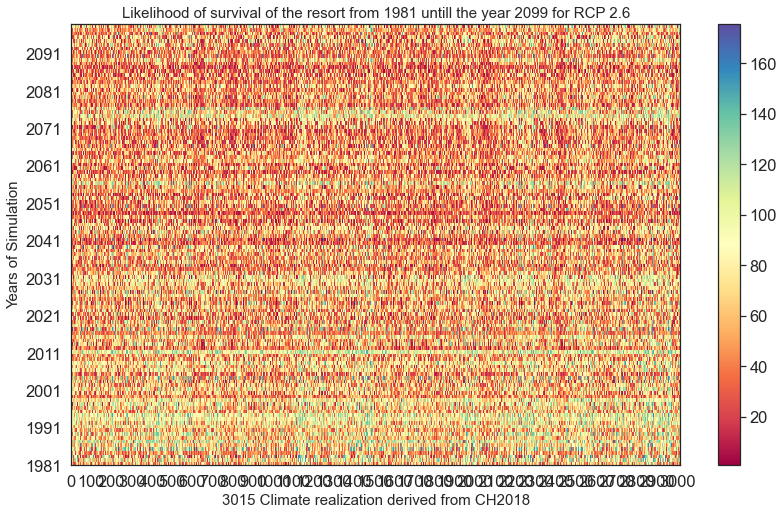

In [125]:
fig25, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df26_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

c3 = ax3.pcolor(Z, cmap='Spectral')
cb3 = fig25.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays26), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays26)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 2.6), fontsize=15)

fig25.tight_layout()
plt.show()

### Survival AMap CH2018 RCP4.5

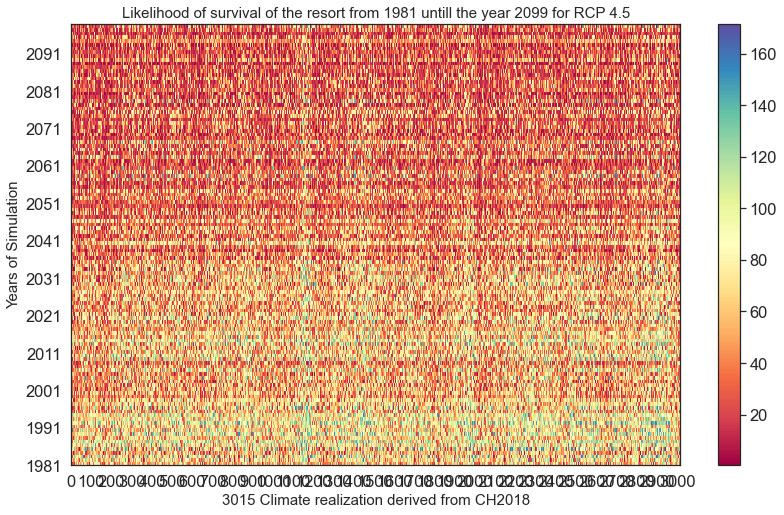

In [126]:
fig26, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df45_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='Spectral')
cb3 = fig26.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays45), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays45)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 4.5), fontsize=15)

fig26.tight_layout()
plt.show()

### Survival Map CH2018 RCP8.5

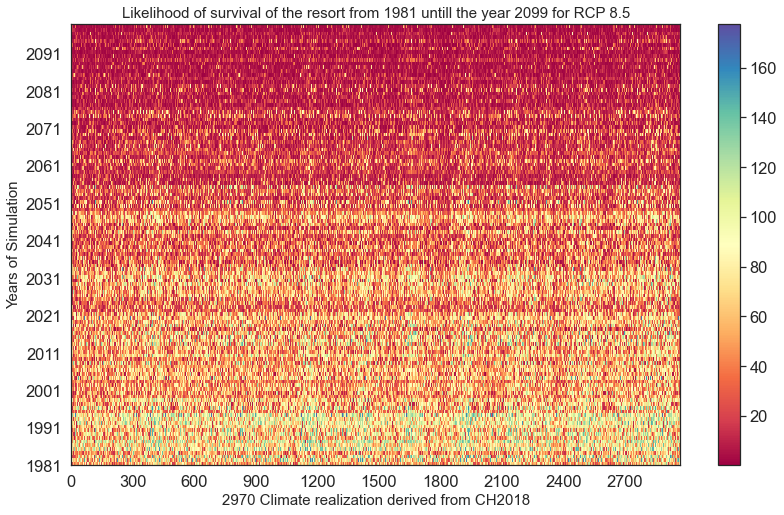

In [127]:
fig27, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df85_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='Spectral')

cb3 = fig27.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays85), step=300)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays85)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 8.5), fontsize=15)

fig27.tight_layout()
plt.show()

## 3 years of not having good snow days in 10 years

### version 1: fixed threshold

In [128]:
def tipping_points_freq(df):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    dfColumns= df.columns
    
    scenarios_length= len(dfColumns)
    simulations_Length = len(df[dfColumns[1]])
    tipping_freq = np.zeros(scenarios_length)
    
    for i in range (1, scenarios_length, 1):
        m = 0
        for j in range (1 , simulations_Length, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            if float(df[dfColumns[i]].iloc[j]) < 100.0:
                m += 1
                if m == 3:
                    tipping_freq[i] += 1
                    m = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                m = 0
                continue    
                #break
    return tipping_freq

### version 2: dynamic threshold

In [129]:
def tipping_points_freq2(df2, threshold):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    df2Columns= df2.columns
    
    scenarios_length= len(df2Columns)
    simulations_Length = len(df2[df2Columns[1]])
    tipping_freq = np.zeros(scenarios_length)
    
    for i in range (1, scenarios_length, 1):
        m = 0
        mm = 0
        for j in range (1 , simulations_Length, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            if float(df2[df2Columns[i]].iloc[j]) < threshold[i-1] -10:
                m += 1
                mm += 1
                if m == 3:
                    if mm <= 10:
                        tipping_freq[i] += 1
                        m = 0
                        mm = 0
                else:
                    if mm > 10:
                        m = 0
                        mm = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                m = 0
                mm = 0
                continue    
                #break
    return tipping_freq

### version 3: Time rolling and policy selection added

In [130]:
def tipping_points_freq3(df3, threshold, beginningYear, endYear, policy, tippingpoint_threshold, scenario):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    df3Columns= df3.columns
    
    scenarios_length= len(df3Columns)
    #simulations_Length = len(df3[df3Columns[1]])
    simulations_Length = endYear - beginningYear + 1
    statring_year = beginningYear - 1981 
    tipping_freq = np.zeros(scenarios_length)
    goodPolicy = []
    goodScenario = []
    goodTippingPoint = []
    
    for i in range (1, scenarios_length, 1):
        m = 0
        mm = 0
        for j in range (1 + statring_year, statring_year + simulations_Length + 1, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            mm += 1
            if float(df3[df3Columns[i]].iloc[j]) < threshold[i-1]:
                m += 1
                if m == 3:
                    if mm <= 10:
                        tipping_freq[i] += 1
                        m = 0
                        mm = 0
                else:
                    if mm > 10:
                        m = 0
                        mm = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                if mm > 10:
                    m = 0
                    mm = 0
                #continue    
                #break
                
        if tipping_freq[i] < tippingpoint_threshold:
            goodPolicy.append(policy[i-1])
            goodScenario.append(scenario[i-1])
            goodTippingPoint.append(tipping_freq[i])
        else:
            continue
            
    return tipping_freq, goodTippingPoint, goodPolicy, goodScenario

In [131]:
df26_all.shape

(118, 3016)

In [132]:
filt_S26 = (df_final_ema['xRCP'] == 1)
thresholds_26 = df_final_ema.loc[filt_S26, 'xGoodDays']
thresholds_26_m = thresholds_26.to_numpy()
thresholds_26_pol = df_final_ema.loc[filt_S26, 'policy']
thresholds_26_pol_m = thresholds_26_pol.to_numpy()
thresholds_26_sce = df_final_ema.loc[filt_S26, 'scenario']
thresholds_26_sce_m = thresholds_26_sce.to_numpy()

filt_S45 = (df_final_ema['xRCP'] == 2)
thresholds_45 = df_final_ema.loc[filt_S45, 'xGoodDays']
thresholds_45_m = thresholds_45.to_numpy()
thresholds_45_pol = df_final_ema.loc[filt_S45, 'policy']
thresholds_45_pol_m = thresholds_45_pol.to_numpy()
thresholds_45_sce = df_final_ema.loc[filt_S45, 'scenario']
thresholds_45_sce_m = thresholds_45_sce.to_numpy()

filt_S85 = (df_final_ema['xRCP'] == 3)
thresholds_85 = df_final_ema.loc[filt_S85, 'xGoodDays']
thresholds_85_m = thresholds_85.to_numpy()
thresholds_85_pol = df_final_ema.loc[filt_S85, 'policy']
thresholds_85_pol_m = thresholds_85_pol.to_numpy()
thresholds_85_sce = df_final_ema.loc[filt_S85, 'scenario']
thresholds_85_sce_m = thresholds_85_sce.to_numpy()


In [133]:
type(df26_all)

pandas.core.frame.DataFrame

In [134]:
thresholds_85_sce_m

array([  1,   8,  10, ..., 185, 192, 194], dtype=int64)

In [135]:
thresholds_45_sce_m

array([  3,   4,   5, ..., 191, 193, 199], dtype=int64)

In [136]:
df26_allColumns = df26_all.columns

In [137]:
df26_all[df26_allColumns[1]].iloc[0]

'55.962541666666645'

In [138]:
df26_all.head()

,Season,sc_1_['isOverSnow_sc_26_8'],sc_2_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_3_['isOverSnow_sc_26_8'],sc_4_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_5_['isOverSnow_sc_26_7'],sc_6_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_7_['isOverSnow_sc_26_2'],sc_8_['isOverSnow_sc_26_5'],sc_9_['isOverSnow_sc_26_11'],sc_10_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_11_['isOverSnow_sc_26_7'],sc_12_['isOverSnow_sc_26_3'],sc_13_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_14_['isOverSnow_sc_26_7'],sc_15_['isOverSnow_sc_26_8'],sc_16_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_17_['isOverSnow_sc_26_5'],sc_18_['isOverSnow_sc_26_5'],sc_19_['isOverSnow_sc_26_9'],sc_20_['isOverSnow_sc_26_2'],sc_21_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_22_['isOverSnow_sc_26_9'],sc_23_['isOverSnow_sc_26_3'],sc_24_['isOverSnow_sc_26_12'],sc_25_['isOverSnow_sc_26_9'],sc_26_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_27_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_28_['isOverSnow_sc_26_4'],sc_29_['isOverSnow_sc_26_10'],sc_30_['isOverSnow_sc_26_8'],sc_31_['isOverSnow_sc_26_9'],sc_32_['isOverSnow_sc_26_6'],sc_33_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],...,sc_2982_['isOverSnow_sc_26_3'],sc_2983_['isOverSnow_sc_26_8'],sc_2984_['isOverSnow_sc_26_11'],sc_2985_['isOverSnow_sc_26_9'],sc_2986_['isOverSnow_sc_26_6'],sc_2987_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_2988_['isOverSnow_sc_26_11'],sc_2989_['isOverSnow_sc_26_8'],sc_2990_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_2991_['isOverSnow_sc_26_10'],sc_2992_['isOverSnow_sc_26_6'],sc_2993_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2994_['isOverSnow_sc_26_5'],sc_2995_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2996_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_2997_['isOverSnow_sc_26_6'],sc_2998_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_2999_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_3000_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_3001_['isOverSnow_sc_26_8'],sc_3002_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_3003_['isOverSnow_sc_26_7'],sc_3004_['isOverSnow_sc_26_10'],sc_3005_['isOverSnow_sc_26_2'],sc_3006_['isOverSnow_sc_26_10'],sc_3007_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_3008_['isOverSnow_sc_26_4'],sc_3009_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_3010_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_3011_['isOverSnow_sc_26_6'],sc_3012_['isOverSnow_sc_26_3'],sc_3013_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_3014_['isOverSnow_sc_26_10'],sc_3015_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp']
0,1981-1982,55.962541666666645,35.33933333333333,44.7700333333333,72.12133333333325,90.29479999999995,59.28183333333336,26.338208333333313,26.92566666666667,62.954066666666655,53.24196666666666,13.096000000000004,61.50813333333333,24.94153333333335,21.492133333333342,27.351233333333347,37.97146666666665,82.60656666666665,91.79183333333324,17.11789999999999,33.335300000000004,64.63556666666668,8.97586666666667,80.16479166666664,30.25540000000001,113.63059999999997,28.197400000000023,44.37266666666666,13.598899999999999,67.31436666666666,87.89866666666676,13.939400000000012,85.41900000000001,63.69756666666666,...,66.34327586206895,72.74372413793103,67.39596551724142,8.360999999999997,85.9640344827587,18.249620689655163,24.963758620689646,29.480344827586215,51.16206896551721,46.71189655172411,68.04575862068958,113.21206896551733,28.029206896551717,48.67555172413789,54.45493103448278,84.62565517241386,60.849206896551784,65.1344137931035,54.89696551724138,40.49520689655169,43.1118275862069,20.536068965517234,39.13172413793103,29.258827586206902,57.45955172413796,55.876034482758676,35.958068965517235,60.11510344827586,62.1444827586207,78.00879310344816,105.95937931034484,113.33089655172412,36.28306896551725,33.68300000000001
1,1982-1983,103.94029166666667,74.37395833333333,83.15223333333329,92.95043333333331,73.54156666666661,65.07040000

In [139]:
thresholds_45_sce_m.shape

(3015,)

In [140]:
#print(thresholds_85.shape)
print(type(thresholds_85_m))
print(thresholds_85_m[1])
print(thresholds_85_pol_m[20])
print(thresholds_85_sce_m[20])

<class 'numpy.ndarray'>
100.0
0
61


In [141]:
T1RCP26 = tipping_points_freq(df26_all)
T1RCP45 = tipping_points_freq(df45_all)
T1RCP85 = tipping_points_freq(df85_all)

In [142]:
T1RCP26_m = tipping_points_freq2(df26_all, thresholds_26_m)
T1RCP45_m = tipping_points_freq2(df45_all, thresholds_45_m)
T1RCP85_m = tipping_points_freq2(df85_all, thresholds_85_m)

In [143]:
T1RCP26_m_3 , tipping26_3, scenario26_3, policy26_3= tipping_points_freq3(df26_all, thresholds_26_m, 1981, 2097, thresholds_26_pol_m, 10, thresholds_26_sce_m)
T1RCP45_m_3 , tipping45_3, scenario45_3, policy45_3= tipping_points_freq3(df45_all, thresholds_45_m, 1981, 2097, thresholds_45_pol_m, 10, thresholds_45_sce_m)
T1RCP85_m_3 , tipping85_3, scenario85_3, policy85_3= tipping_points_freq3(df85_all, thresholds_85_m, 1981, 2097, thresholds_85_pol_m, 10, thresholds_85_sce_m)

In [144]:
print(len( policy26_3))
print(len( policy45_3))
print(len( policy85_3))

59
0
2


In [145]:
print(len(scenario26_3))
print(len(scenario45_3))
print(len(scenario85_3))

59
0
2


In [146]:
print(len(tipping26_3))
print(len(tipping45_3))
print(len(tipping85_3))

59
0
2


In [147]:
print(len(T1RCP26_m_3))
print(len(T1RCP45_m_3))
print(len(T1RCP85_m_3))

3016
3016
2971


In [148]:
print(len(T1RCP26[1:]))
print(len(T1RCP45[1:]))
print(len(T1RCP85[1:]))

3015
3015
2970


In [149]:
type(T1RCP85)

numpy.ndarray

In [150]:
T1RCP85.shape

(2971,)

In [151]:
print(type(T1RCP85_m_3))
print(type(scenario85_3))
print(type(policy85_3))

<class 'numpy.ndarray'>
<class 'list'>
<class 'list'>


In [152]:
tipping26_3_df = pd.DataFrame(tipping26_3, columns =['tippingPoint26'])
tipping45_3_df = pd.DataFrame(tipping45_3, columns =['tippingPoint45'])
tipping85_3_df = pd.DataFrame(tipping85_3, columns =['tippingPoint85'])

scenario26_m_3 = pd.DataFrame(scenario26_3, columns =['Scenario26'])
scenario45_m_3 = pd.DataFrame(scenario45_3, columns =['Scenario45'])
scenario85_m_3 = pd.DataFrame(scenario85_3, columns =['Scenario85'])

policy26_m_3 = pd.DataFrame(policy26_3, columns =['Policy26'])
policy45_m_3 = pd.DataFrame(policy45_3, columns =['Policy45'])
policy85_m_3 = pd.DataFrame(policy85_3, columns =['Policy85'])

In [153]:
df_final_tipping_point = pd.concat((tipping26_3_df, scenario26_m_3, policy26_m_3, 
                                    tipping45_3_df, scenario45_m_3, policy45_m_3,
                                    tipping85_3_df, scenario85_m_3, policy85_m_3), axis = 1)

df_final_tipping_point.head(38)

,tippingPoint26,Scenario26,Policy26,tippingPoint45,Scenario45,Policy45,tippingPoint85,Scenario85,Policy85
0,8.0,3,13,NaN,NaN,NaN,9.0,17.0,80.0
1,7.0,3,68,NaN,NaN,NaN,9.0,29.0,132.0
2,8.0,5,56,NaN,NaN,NaN,NaN,NaN,NaN
3,6.0,5,66,NaN,NaN,NaN,NaN,NaN,NaN
4,4.0,5,143,NaN,NaN,NaN,NaN,NaN,NaN
5,6.0,6,101,NaN,NaN,NaN,NaN,NaN,NaN
6,6.0,6,104,NaN,NaN,NaN,NaN,NaN,NaN
7,8.0,6,139,NaN,NaN,NaN,NaN,NaN,NaN
8,9.0,7,118,NaN,NaN,NaN,NaN,NaN,NaN
9,8.0,7,119,NaN,NaN,NaN,NaN,NaN,NaN


### Specify the number of runs
for instance : number_Simulations = 9000

In [154]:
number_Simulations = 9000
x_axis = np.arange(1,number_Simulations + 2)

In [155]:
print("The lengthe of Y is: {}".format(len(T1RCP26[1:])))
print("The lengthe of X is: {}".format(len(matrix_GoodDays26) + 1 -1))
print('***')
print("The lengthe of Y is: {}".format(len(T1RCP45[1:])))
print("The lengthe of X is: {}".format((len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1) -(len(matrix_GoodDays26) + 1)))
print('***')
print("The lengthe of Y is: {}".format(len(T1RCP85[1:])))
print("The lengthe of X is: {}".format(number_Simulations+1 - (len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1)))

The lengthe of Y is: 3015
The lengthe of X is: 3015
***
The lengthe of Y is: 3015
The lengthe of X is: 3015
***
The lengthe of Y is: 2970
The lengthe of X is: 2970


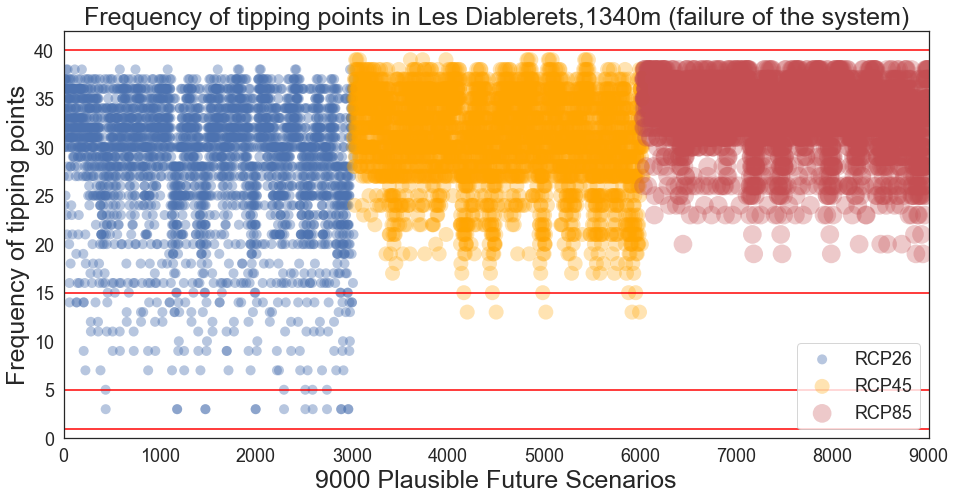

In [156]:
fig28, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (failure of the system)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig28.savefig(os.path.join(rootVisualization, 'tipping_point_All.svg'), format='svg', dpi=1200)
fig28.savefig(os.path.join(rootVisualization, 'tipping_point_All.tiff'), format='tiff', dpi=150)

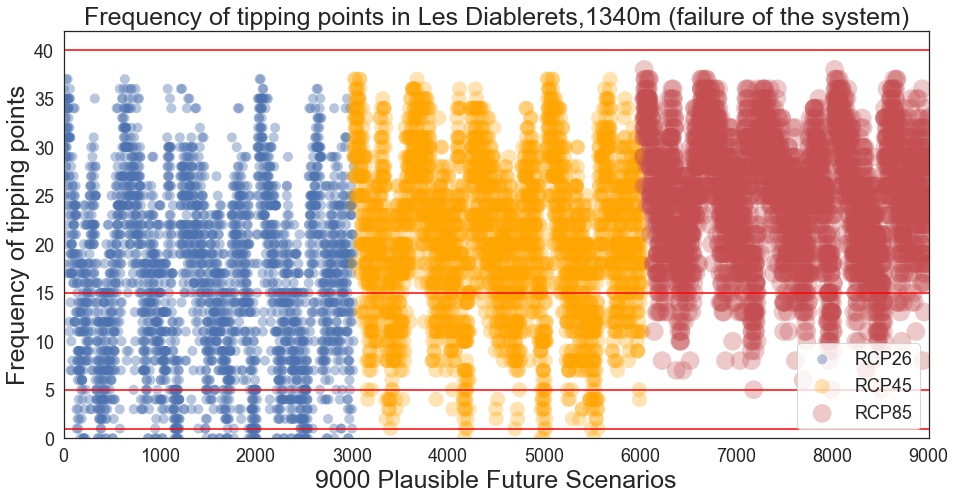

In [157]:
fig29, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (failure of the system)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig29.savefig(os.path.join(rootVisualization, 'tipping_point_All_new.svg'), format='svg', dpi=1200)
fig29.savefig(os.path.join(rootVisualization, 'tipping_point_All_new.tiff'), format='tiff', dpi=150)

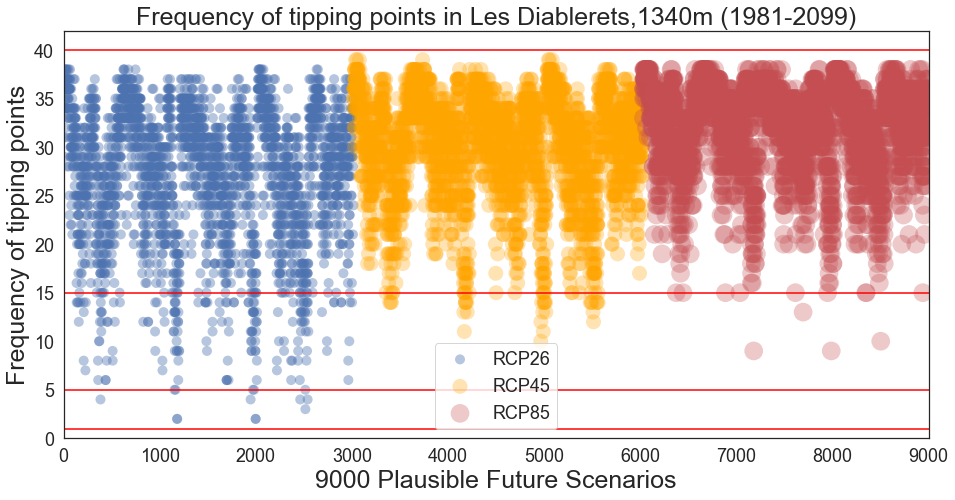

In [158]:
fig30, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (1981-2099)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig30.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3.svg'), format='svg', dpi=1200)
fig30.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3.tiff'), format='tiff', dpi=150)

### Check the 45 policies

In [159]:
df_final_ema[filt_S]

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
1,1.352533,1037.680312,4.58549,-1.35505,2.996305,0.235785,3.0,240.0,100.0,1,0,UZHModel,36.312910,43,29.992125,35.843417,121.186958,63.723375,79.751583,107.348542,51.066208,66.675625,109.718458,62.590708,92.605250,63.647917,109.950292,45.456667,27.712292,52.406167,35.738250,69.410542,46.525458,123.897917,...,2.886542,14.467000,3.361708,14.838458,7.610708,4.563125,8.354208,27.907792,20.199042,6.302833,2.481958,21.870958,5.516125,3.900917,5.201375,11.046250,6.886000,4.209958,7.577458,2.055333,3.322792,9.247458,1.775792,73.117792,2.945167,2.643208,7.791167,1.579750,3.064583,4.534125,47.78322,1.543390,0.299043,33.0
201,1.352533,1037.680312,4.58549,-1.35505,2.996305,0.235785,3.0,300.0,80.0,1,1,UZHModel,29.673431,43,23.993700,28.674733,99.535233,50.978700,63.801267,86.098633,40.852967,53.340500,103.492233,50.072567,76.107000,50.918333,89.930867,36.365333,22.169833,41.924933,28.590600,55.528433,37.220367,105.552800,...,2.309233,11.573600,2.689367,11.870767,6.088567,3.650500,6.683367,22.326233,16.159233,5.042267,1.985567,17.496767,4.412900,3.120733,4.161100,8.837000,5.508800,3.367967,6.061967,1.644267,2.658233,7.397967,1.420633,63.848367,2.356133,2.114567,6.232933,1.263800,2.451667,3.627300,47.78322,1.003136,0.300565,32.0
401,1.352533,1037.680312,4.58549,-1.35505,2.996305,0.235785,3.0,240.0,60.0,1,2,UZHModel,36.312910,43,29.992125,35.843417,121.186958,63.723375,79.751583,107.348542,51.066208,66.675625,109.718458,62.590708,92.605250,63.647917,109.950292,45.456667,27.712292,52.406167,35.738250,69.410542,46.525458,123.897917,...,2.886542,14.467000,3.361708,14.838458,7.610708,4.563125,8.354208,27.907792,20.199042,6.302833,2.481958,21.870958,5.516125,3.900917,5.201375,11.046250,6.886000,4.209958,7.577458,2.055333,3.322792,9.247458,1.775792,73.117792,2.945167,2.643208,7.791167,1.579750,3.064583,4.534125,47.78322,1.543390,0.428720,26.0
601,1.352533,1037.680312,4.58549,-1.35505,2.996305,0.235785,3.0,260.0,70.0,1,3,UZHModel,33.853402,43,27.685038,33.086231,114.589231,58.821577,73.616846,99.344577,47.138038,61.546731,107.850846,57.776038,86.886269,58.751923,103.432077,41.960000,25.580577,48.374923,32.989154,64.071269,42.946577,117.945308,...,2.664500,13.354154,3.103115,13.697038,7.025269,4.212115,7.711577,25.761038,18.645269,5.818000,2.291038,20.188577,5.091808,3.600846,4.801269,10.196538,6.356308,3.886115,6.994577,1.897231,3.067192,8.536115,1.639192,70.286846,2.718615,2.439885,7.191846,1.458231,2.828846,4.185346,47.78322,1.344831,0.367531,30.0
801,1.352533,1037.680312,4.58549,-1.35505,2.996305,0.235785,3.0,290.0,90.0,1,4,UZHModel,30.639006,43,24.821069,29.663517,102.967483,52.736586,66.001310,89.067552,42.261690,55.179828,104.666448,51.799207,78.671448,52.674138,93.031931,37.619310,22.934310,43.370621,29.576483,57.443207,38.503828,108.707690,...,2.388862,11.972690,2.782103,12.280103,6.298517,3.776379,6.913828,23.096103,16.716448,5.216138,2.054034,18.100103,4.565069,3.228345,4.304586,9.141724,5.698759,3.484103,6.271000,1.700966,2.749897,7.653069,1.469621,65.782345,2.437379,2.187483,6.447862,1.307379,2.536207,3.752379,47.78322,1.081186,0.281426,34.0
1001,1.352533,1037.680312,4.58549,-1.35505,2.996305,0.235785,3.0,300.0,60.0,1,5,UZHModel,29.673431,43,23.993700,28.674733,99.535233,50.978700,63.801267,86.098633,40.852967,53.340500,103.492233,50.072567,76.107000,50.918333,89.930867,36.365333,22.169833,41.924933,28.590600,55.528433,37.220367,105.552800,...,2.3

In [217]:
df_final_ema[filt_S].to_csv(os.path.join(rootVisualization, 'df_policies.csv'), index = False)

In [160]:
T1RCP26_m_3_1980 , tipping26_3_1980, scenario26_3_1980, policy26_3_1980= tipping_points_freq3(df26_all, thresholds_26_m, 1981, 2010, thresholds_26_pol_m, 30, thresholds_26_sce_m)
T1RCP45_m_3_1980 , tipping45_3_1980, scenario45_3_1980, policy45_3_1980= tipping_points_freq3(df45_all, thresholds_45_m, 1981, 2010, thresholds_45_pol_m, 30, thresholds_45_sce_m)
T1RCP85_m_3_1980 , tipping85_3_1980, scenario85_3_1980, policy85_3_1980= tipping_points_freq3(df85_all, thresholds_85_m, 1981, 2010, thresholds_85_pol_m, 30, thresholds_85_sce_m)

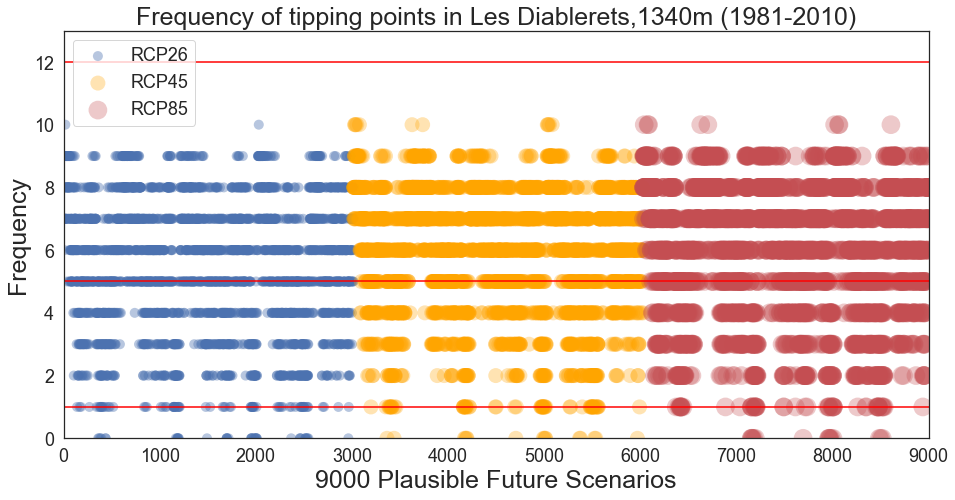

In [161]:
fig31, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_1980[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_1980[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_1980[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (1981-2010)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig31.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_1981.svg'), format='svg', dpi=600)
fig31.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_1981.tiff'), format='tiff', dpi=150)

In [162]:
type(T1RCP85_m_3_1980)

numpy.ndarray

In [163]:
T1RCP26_m_3_1980_df = pd.DataFrame(T1RCP26_m_3_1980, columns =['tippingPoint26_1980'])
tipping26_3_1980_df = pd.DataFrame(tipping26_3_1980, columns =['tippingPoint26_1_1980'])
scenario26_3_1980_df = pd.DataFrame(scenario26_3_1980, columns =['scenario26_1980'])
policy26_3_1980_df = pd.DataFrame(policy26_3_1980, columns =['policy26_1980'])

T1RCP45_m_3_1980_df = pd.DataFrame(T1RCP45_m_3_1980, columns =['tippingPoint45_1980'])
tipping45_3_1980_df = pd.DataFrame(tipping45_3_1980, columns =['tippingPoint45_1_1980'])
scenario45_3_1980_df = pd.DataFrame(scenario45_3_1980, columns =['scenario45_1980'])
policy45_3_1980_df = pd.DataFrame(policy45_3_1980, columns =['policy45_1980'])

T1RCP85_m_3_1980_df = pd.DataFrame(T1RCP85_m_3_1980, columns =['tippingPoint85_1980'])
tipping85_3_1980_df = pd.DataFrame(tipping85_3_1980, columns =['tippingPoint85_1_1980'])
scenario85_3_1980_df = pd.DataFrame(scenario85_3_1980, columns =['scenario85_1980'])
policy85_3_1980_df = pd.DataFrame(policy85_3_1980, columns =['policy85_1980'])

In [218]:
df_final_tipping_point_1980 = pd.concat((T1RCP26_m_3_1980_df, tipping26_3_1980_df, scenario26_3_1980_df, policy26_3_1980_df,
                                         T1RCP45_m_3_1980_df, tipping45_3_1980_df, scenario45_3_1980_df, policy45_3_1980_df,
                                         T1RCP85_m_3_1980_df, tipping85_3_1980_df, scenario85_3_1980_df, policy85_3_1980_df), axis = 1)
df_final_tipping_point_1980.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_1980.csv'), index = False)

In [165]:
print(T1RCP26_m_3_1980_df['tippingPoint26_1980'].value_counts())
print(T1RCP45_m_3_1980_df['tippingPoint45_1980'].value_counts())
print(T1RCP85_m_3_1980_df['tippingPoint85_1980'].value_counts())

6.0     530
5.0     522
7.0     479
8.0     424
4.0     305
3.0     254
2.0     201
9.0     178
1.0      79
0.0      42
10.0      2
Name: tippingPoint26_1980, dtype: int64
7.0     663
6.0     647
8.0     479
5.0     376
4.0     288
3.0     198
9.0     158
2.0     116
1.0      62
0.0      17
10.0     12
Name: tippingPoint45_1980, dtype: int64
7.0     599
8.0     573
6.0     471
5.0     352
4.0     267
9.0     254
3.0     233
2.0     142
1.0      54
0.0      17
10.0      9
Name: tippingPoint85_1980, dtype: int64


In [166]:
print(tipping26_3_1980_df['tippingPoint26_1_1980'].value_counts())
print(tipping45_3_1980_df['tippingPoint45_1_1980'].value_counts())
print(tipping85_3_1980_df['tippingPoint85_1_1980'].value_counts())

6.0     530
5.0     522
7.0     479
8.0     424
4.0     305
3.0     254
2.0     201
9.0     178
1.0      79
0.0      41
10.0      2
Name: tippingPoint26_1_1980, dtype: int64
7.0     663
6.0     647
8.0     479
5.0     376
4.0     288
3.0     198
9.0     158
2.0     116
1.0      62
0.0      16
10.0     12
Name: tippingPoint45_1_1980, dtype: int64
7.0     599
8.0     573
6.0     471
5.0     352
4.0     267
9.0     254
3.0     233
2.0     142
1.0      54
0.0      16
10.0      9
Name: tippingPoint85_1_1980, dtype: int64


In [167]:
print(scenario26_3_1980_df['scenario26_1980'].value_counts())
print(scenario45_3_1980_df['scenario45_1980'].value_counts())
print(scenario85_3_1980_df['scenario85_1980'].value_counts())

43    67
42    67
38    67
36    67
34    67
32    67
30    67
28    67
26    67
24    67
22    67
20    67
18    67
16    67
14    67
12    67
10    67
8     67
6     67
4     67
2     67
40    67
44    67
41    67
1     67
39    67
37    67
35    67
33    67
31    67
29    67
27    67
25    67
23    67
21    67
19    67
17    67
15    67
13    67
11    67
9     67
7     67
5     67
3     67
0     67
Name: scenario26_1980, dtype: int64
43    67
42    67
38    67
36    67
34    67
32    67
30    67
28    67
26    67
24    67
22    67
20    67
18    67
16    67
14    67
12    67
10    67
8     67
6     67
4     67
2     67
40    67
44    67
41    67
1     67
39    67
37    67
35    67
33    67
31    67
29    67
27    67
25    67
23    67
21    67
19    67
17    67
15    67
13    67
11    67
9     67
7     67
5     67
3     67
0     67
Name: scenario45_1980, dtype: int64
43    66
42    66
38    66
36    66
34    66
32    66
30    66
28    66
26    66
24    66
22    66
20    66
18    66
1

In [168]:
print(policy26_3_1980_df['policy26_1980'].value_counts())
print(policy45_3_1980_df['policy45_1980'].value_counts())
print(policy85_3_1980_df['policy85_1980'].value_counts())

197    45
104    45
188    45
182    45
180    45
178    45
174    45
170    45
160    45
156    45
150    45
140    45
134    45
122    45
118    45
108    45
100    45
196    45
88     45
86     45
78     45
68     45
66     45
56     45
54     45
40     45
34     45
32     45
30     45
18     45
6      45
2      45
190    45
198    45
195    45
101    45
189    45
175    45
171    45
167    45
165    45
145    45
143    45
139    45
129    45
123    45
119    45
113    45
107    45
105    45
91     45
9      45
87     45
77     45
73     45
63     45
53     45
49     45
45     45
41     45
37     45
31     45
21     45
15     45
13     45
11     45
0      45
Name: policy26_1980, dtype: int64
199    45
90     45
164    45
144    45
138    45
136    45
128    45
126    45
124    45
116    45
112    45
110    45
106    45
98     45
96     45
94     45
84     45
176    45
76     45
74     45
64     45
60     45
58     45
52     45
50     45
44     45
42     45
26     45
22     45
20    

In [169]:
T1RCP26_m_3_2020 , tipping26_3_2020, scenario26_3_2020, policy26_3_2020= tipping_points_freq3(df26_all, thresholds_26_m, 2020, 2049, thresholds_26_pol_m, 5, thresholds_26_sce_m)
T1RCP45_m_3_2020 , tipping45_3_2020, scenario45_3_2020, policy45_3_2020= tipping_points_freq3(df45_all, thresholds_45_m, 2020, 2049, thresholds_45_pol_m, 5, thresholds_45_sce_m)
T1RCP85_m_3_2020 , tipping85_3_2020, scenario85_3_2020, policy85_3_2020= tipping_points_freq3(df85_all, thresholds_85_m, 2020, 2049, thresholds_85_pol_m, 5, thresholds_85_sce_m)

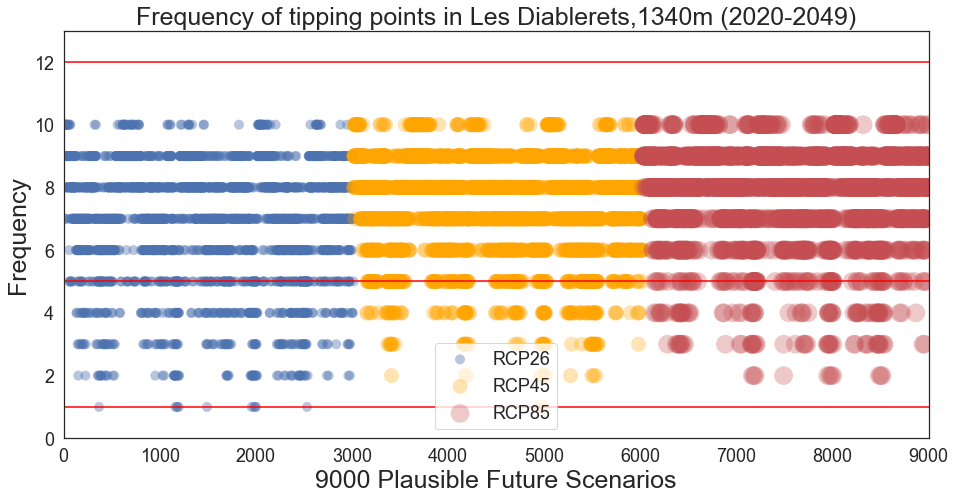

In [170]:
fig32, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2020[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2020[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2020[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2020-2049)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig32.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2020.svg'), format='svg', dpi=600)
fig32.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2020.tiff'), format='tiff', dpi=150)

In [171]:
T1RCP26_m_3_2020_df = pd.DataFrame(T1RCP26_m_3_2020, columns =['tippingPoint26_2020'])
tipping26_3_2020_df = pd.DataFrame(tipping26_3_2020, columns =['tippingPoint26_1_2020'])
scenario26_3_2020_df = pd.DataFrame(scenario26_3_2020, columns =['scenario26_2020'])
policy26_3_2020_df = pd.DataFrame(policy26_3_2020, columns =['policy26_2020'])

T1RCP45_m_3_2020_df = pd.DataFrame(T1RCP45_m_3_2020, columns =['tippingPoint45_2020'])
tipping45_3_2020_df = pd.DataFrame(tipping45_3_2020, columns =['tippingPoint45_1_2020'])
scenario45_3_2020_df = pd.DataFrame(scenario45_3_2020, columns =['scenario45_2020'])
policy45_3_2020_df = pd.DataFrame(policy45_3_2020, columns =['policy45_2020'])

T1RCP85_m_3_2020_df = pd.DataFrame(T1RCP85_m_3_2020, columns =['tippingPoint85_2020'])
tipping85_3_2020_df = pd.DataFrame(tipping85_3_2020, columns =['tippingPoint85_1_2020'])
scenario85_3_2020_df = pd.DataFrame(scenario85_3_2020, columns =['scenario85_2020'])
policy85_3_2020_df = pd.DataFrame(policy85_3_2020, columns =['policy85_2020'])

In [219]:
df_final_tipping_point_2020 = pd.concat((T1RCP26_m_3_2020_df, tipping26_3_2020_df, scenario26_3_2020_df, policy26_3_2020_df,
                                         T1RCP45_m_3_2020_df, tipping45_3_2020_df, scenario45_3_2020_df, policy45_3_2020_df,
                                         T1RCP85_m_3_2020_df, tipping85_3_2020_df, scenario85_3_2020_df, policy85_3_2020_df), axis = 1)
df_final_tipping_point_2020.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2020.csv'), index = False)

In [173]:
print(T1RCP26_m_3_2020_df['tippingPoint26_2020'].value_counts())
print(T1RCP45_m_3_2020_df['tippingPoint45_2020'].value_counts())
print(T1RCP85_m_3_2020_df['tippingPoint85_2020'].value_counts())

8.0     746
9.0     617
7.0     573
6.0     385
5.0     255
4.0     163
3.0     110
10.0     87
2.0      68
1.0      11
0.0       1
Name: tippingPoint26_2020, dtype: int64
9.0     853
8.0     648
7.0     576
6.0     379
5.0     232
10.0    159
4.0     108
3.0      45
2.0      13
1.0       2
0.0       1
Name: tippingPoint45_2020, dtype: int64
9.0     1042
8.0      659
7.0      539
10.0     256
6.0      248
5.0       99
4.0       69
3.0       47
2.0       11
0.0        1
Name: tippingPoint85_2020, dtype: int64


In [174]:
print(tipping26_3_2020_df['tippingPoint26_1_2020'].value_counts())
print(tipping45_3_2020_df['tippingPoint45_1_2020'].value_counts())
print(tipping85_3_2020_df['tippingPoint85_1_2020'].value_counts())

4.0    163
3.0    110
2.0     68
1.0     11
Name: tippingPoint26_1_2020, dtype: int64
4.0    108
3.0     45
2.0     13
1.0      2
Name: tippingPoint45_1_2020, dtype: int64
4.0    69
3.0    47
2.0    11
Name: tippingPoint85_1_2020, dtype: int64


In [175]:
print(scenario26_3_2020_df['scenario26_2020'].value_counts())
print(scenario45_3_2020_df['scenario45_2020'].value_counts())
print(scenario85_3_2020_df['scenario85_2020'].value_counts())

29    36
17    33
37    27
25    20
6     16
5     16
36    16
35    16
33    14
15    10
14    10
44    10
3     10
22     9
2      9
7      8
40     8
24     8
12     7
23     7
34     6
28     6
43     5
41     5
13     5
26     4
27     4
42     3
16     3
21     3
4      3
38     2
1      2
31     2
8      2
11     2
19     2
20     2
30     1
Name: scenario26_2020, dtype: int64
29    26
17    25
37    21
5     14
25    12
36    11
33    11
6      7
35     6
44     4
22     4
2      4
15     3
7      3
40     3
24     2
14     2
13     2
12     2
34     2
23     2
42     1
3      1
Name: scenario45_2020, dtype: int64
29    18
17    16
37    16
5     13
33     8
36     7
25     6
35     6
2      5
6      5
15     4
12     3
7      3
22     3
24     3
3      2
40     2
44     2
23     1
14     1
42     1
34     1
1      1
Name: scenario85_2020, dtype: int64


In [176]:
print(policy26_3_2020_df['policy26_2020'].value_counts())
print(policy45_3_2020_df['policy45_2020'].value_counts())
print(policy85_3_2020_df['policy85_2020'].value_counts())

6      10
45     10
198     9
66      9
13      9
88      8
56      8
9       8
68      8
15      8
108     7
129     7
118     7
197     7
105     7
101     7
87      7
134     7
140     7
21      7
49      6
34      6
31      6
37      6
86      6
30      6
170     6
32      6
178     6
180     6
2       5
196     5
63      5
195     5
190     5
145     5
171     5
119     5
41      5
160     5
150     5
73      5
54      4
104     4
143     4
91      4
100     4
189     4
107     4
122     4
174     4
167     4
156     3
11      3
165     3
77      3
139     3
53      3
0       3
78      2
123     2
18      2
40      2
175     2
113     2
182     1
188     1
Name: policy26_2020, dtype: int64
4      5
90     5
7      5
98     5
110    5
128    4
155    4
76     4
74     4
83     4
5      4
12     4
20     4
22     3
60     3
191    3
89     3
193    3
71     3
97     3
103    3
112    3
59     3
58     3
55     3
79     3
50     3
44     3
43     3
42     3
144    3
27     3
93     3

In [177]:
T1RCP26_m_3_2050 , tipping26_3_2050, scenario26_3_2050, policy26_3_2050= tipping_points_freq3(df26_all, thresholds_26_m, 2050, 2079, thresholds_26_pol_m, 5, thresholds_26_sce_m)
T1RCP45_m_3_2050 , tipping45_3_2050, scenario45_3_2050, policy45_3_2050= tipping_points_freq3(df45_all, thresholds_45_m, 2050, 2079, thresholds_45_pol_m, 5, thresholds_45_sce_m)
T1RCP85_m_3_2050 , tipping85_3_2050, scenario85_3_2050, policy85_3_2050= tipping_points_freq3(df85_all, thresholds_85_m, 2050, 2079, thresholds_85_pol_m, 5, thresholds_85_sce_m)

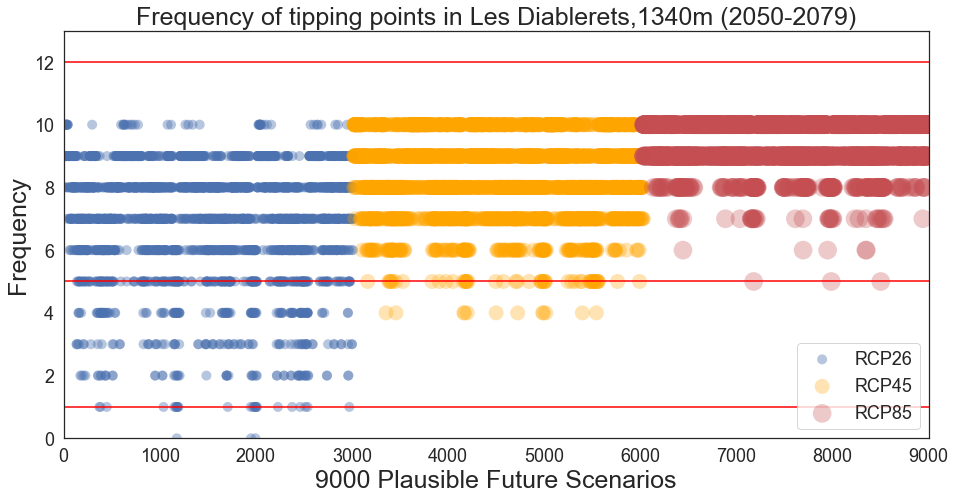

In [178]:
fig33, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2050[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2050[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2050[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2050-2079)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig33.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2050.svg'), format='svg', dpi=600)
fig33.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2050.tiff'), format='tiff', dpi=150)

In [179]:
T1RCP26_m_3_2050_df = pd.DataFrame(T1RCP26_m_3_2050, columns =['tippingPoint26_2050'])
tipping26_3_2050_df = pd.DataFrame(tipping26_3_2050, columns =['tippingPoint26_1_2050'])
scenario26_3_2050_df = pd.DataFrame(scenario26_3_2050, columns =['scenario26_2050'])
policy26_3_2050_df = pd.DataFrame(policy26_3_2050, columns =['policy26_2050'])

T1RCP45_m_3_2050_df = pd.DataFrame(T1RCP45_m_3_2050, columns =['tippingPoint45_2050'])
tipping45_3_2050_df = pd.DataFrame(tipping45_3_2050, columns =['tippingPoint45_1_2050'])
scenario45_3_2050_df = pd.DataFrame(scenario45_3_2050, columns =['scenario45_2050'])
policy45_3_2050_df = pd.DataFrame(policy45_3_2050, columns =['policy45_2050'])

T1RCP85_m_3_2050_df = pd.DataFrame(T1RCP85_m_3_2050, columns =['tippingPoint85_2050'])
tipping85_3_2050_df = pd.DataFrame(tipping85_3_2050, columns =['tippingPoint85_1_2050'])
scenario85_3_2050_df = pd.DataFrame(scenario85_3_2050, columns =['scenario85_2050'])
policy85_3_2050_df = pd.DataFrame(policy85_3_2050, columns =['policy85_2050'])

In [220]:
df_final_tipping_point_2050 = pd.concat((T1RCP26_m_3_2050_df, tipping26_3_2050_df, scenario26_3_2050_df, policy26_3_2050_df,
                                         T1RCP45_m_3_2050_df, tipping45_3_2050_df, scenario45_3_2050_df, policy45_3_2050_df,
                                         T1RCP85_m_3_2050_df, tipping85_3_2050_df, scenario85_3_2050_df, policy85_3_2050_df), axis = 1)
df_final_tipping_point_2050.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2050.csv'), index = False)

In [181]:
print(T1RCP26_m_3_2050_df['tippingPoint26_2050'].value_counts())
print(T1RCP45_m_3_2050_df['tippingPoint45_2050'].value_counts())
print(T1RCP85_m_3_2050_df['tippingPoint85_2050'].value_counts())

8.0     823
9.0     744
7.0     527
6.0     367
5.0     230
4.0     113
3.0      78
2.0      57
10.0     47
1.0      26
0.0       4
Name: tippingPoint26_2050, dtype: int64
9.0     1098
8.0      659
10.0     579
7.0      448
6.0      167
5.0       52
4.0       12
0.0        1
Name: tippingPoint45_2050, dtype: int64
9.0     1417
10.0    1290
8.0      219
7.0       36
6.0        5
5.0        3
0.0        1
Name: tippingPoint85_2050, dtype: int64


In [182]:
print(tipping26_3_2050_df['tippingPoint26_1_2050'].value_counts())
print(tipping45_3_2050_df['tippingPoint45_1_2050'].value_counts())
print(tipping85_3_2050_df['tippingPoint85_1_2050'].value_counts())

4.0    113
3.0     78
2.0     57
1.0     26
0.0      3
Name: tippingPoint26_1_2050, dtype: int64
4.0    12
Name: tippingPoint45_1_2050, dtype: int64
Series([], Name: tippingPoint85_1_2050, dtype: int64)


In [183]:
print(scenario26_3_2050_df['scenario26_2050'].value_counts())
print(scenario45_3_2050_df['scenario45_2050'].value_counts())
print(scenario85_3_2050_df['scenario85_2050'].value_counts())

17    34
29    31
37    25
5     19
25    18
36    17
33    14
35    13
6     12
15     9
2      8
44     8
7      7
24     7
40     5
22     5
14     5
3      4
12     4
13     3
23     3
27     3
34     3
41     3
20     2
21     2
43     2
26     2
8      2
28     2
38     2
1      2
4      1
Name: scenario26_2050, dtype: int64
29    3
17    3
22    1
6     1
5     1
25    1
35    1
37    1
Name: scenario45_2050, dtype: int64
Series([], Name: scenario85_2050, dtype: int64)


In [184]:
print(policy26_3_2050_df['policy26_2050'].value_counts())
print(policy45_3_2050_df['policy45_2050'].value_counts())
print(policy85_3_2050_df['policy85_2050'].value_counts())

13     10
180     9
197     8
49      8
143     7
45      7
134     7
140     6
91      6
108     6
41      6
37      6
34      6
73      6
11      6
15      6
100     5
188     5
156     5
150     5
145     5
196     5
66      5
171     5
105     5
87      5
32      5
167     4
88      4
56      4
63      4
86      4
118     4
9       4
113     4
182     4
129     4
21      4
30      4
160     4
6       3
53      3
198     3
104     3
68      3
119     3
189     3
178     3
139     3
165     3
107     2
122     2
2       2
195     2
78      2
54      2
18      2
0       2
170     2
31      2
77      2
101     2
123     2
175     1
190     1
40      1
174     1
Name: policy26_2050, dtype: int64
166    1
94     1
26     1
44     1
124    1
106    1
76     1
22     1
5      1
131    1
98     1
90     1
Name: policy45_2050, dtype: int64
Series([], Name: policy85_2050, dtype: int64)


In [185]:
T1RCP26_m_3_2070 , tipping26_3_2070, scenario26_3_2070, policy26_3_2070= tipping_points_freq3(df26_all, thresholds_26_m, 2070, 2097, thresholds_26_pol_m, 5, thresholds_26_sce_m)
T1RCP45_m_3_2070 , tipping45_3_2070, scenario45_3_2070, policy45_3_2070= tipping_points_freq3(df45_all, thresholds_45_m, 2070, 2097, thresholds_45_pol_m, 5, thresholds_45_sce_m)
T1RCP85_m_3_2070 , tipping85_3_2070, scenario85_3_2070, policy85_3_2070= tipping_points_freq3(df85_all, thresholds_85_m, 2070, 2097, thresholds_85_pol_m, 5, thresholds_85_sce_m)

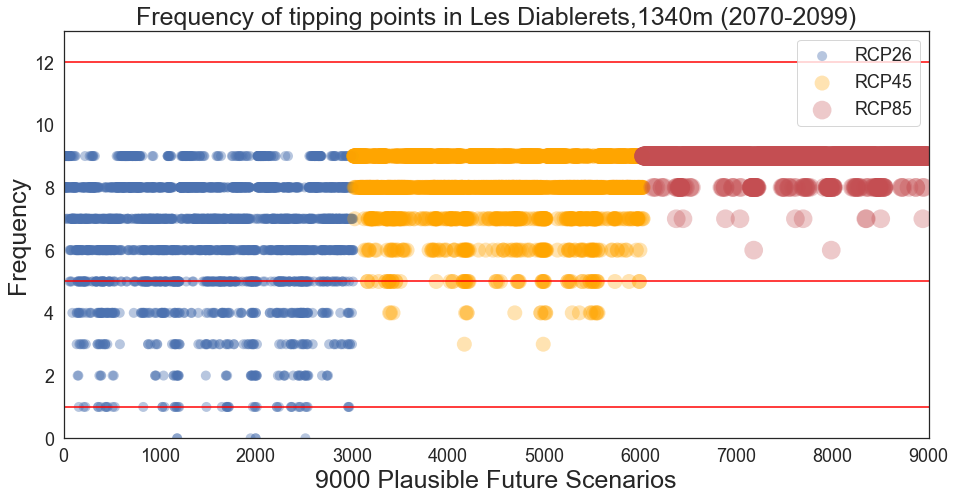

In [186]:
fig34, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2070[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2070[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2070[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2070-2099)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig34.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2070.svg'), format='svg', dpi=600)
fig34.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2070.tiff'), format='tiff', dpi=150)

In [187]:
T1RCP26_m_3_2070_df = pd.DataFrame(T1RCP26_m_3_2070, columns =['tippingPoint26_2070'])
tipping26_3_2070_df = pd.DataFrame(tipping26_3_2070, columns =['tippingPoint26_1_2070'])
scenario26_3_2070_df = pd.DataFrame(scenario26_3_2070, columns =['scenario26_2070'])
policy26_3_2070_df = pd.DataFrame(policy26_3_2070, columns =['policy26_2070'])

T1RCP45_m_3_2070_df = pd.DataFrame(T1RCP45_m_3_2070, columns =['tippingPoint45_2070'])
tipping45_3_2070_df = pd.DataFrame(tipping45_3_2070, columns =['tippingPoint45_1_2070'])
scenario45_3_2070_df = pd.DataFrame(scenario45_3_2070, columns =['scenario45_2070'])
policy45_3_2070_df = pd.DataFrame(policy45_3_2070, columns =['policy45_2070'])

T1RCP85_m_3_2070_df = pd.DataFrame(T1RCP85_m_3_2070, columns =['tippingPoint85_2070'])
tipping85_3_2070_df = pd.DataFrame(tipping85_3_2070, columns =['tippingPoint85_1_2070'])
scenario85_3_2070_df = pd.DataFrame(scenario85_3_2070, columns =['scenario85_2070'])
policy85_3_2070_df = pd.DataFrame(policy85_3_2070, columns =['policy85_2070'])

In [221]:
df_final_tipping_point_2070 = pd.concat((T1RCP26_m_3_2070_df, tipping26_3_2070_df, scenario26_3_2070_df, policy26_3_2070_df,
                                         T1RCP45_m_3_2070_df, tipping45_3_2070_df, scenario45_3_2070_df, policy45_3_2070_df,
                                         T1RCP85_m_3_2070_df, tipping85_3_2070_df, scenario85_3_2070_df, policy85_3_2070_df), axis = 1)
df_final_tipping_point_2070.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2070.csv'), index = False)

In [189]:
print(T1RCP26_m_3_2070_df['tippingPoint26_2070'].value_counts())
print(T1RCP45_m_3_2070_df['tippingPoint45_2070'].value_counts())
print(T1RCP85_m_3_2070_df['tippingPoint85_2070'].value_counts())

8.0    933
7.0    640
6.0    474
5.0    297
9.0    292
4.0    171
3.0     95
2.0     58
1.0     49
0.0      7
Name: tippingPoint26_2070, dtype: int64
9.0    1466
8.0     993
7.0     340
6.0     127
5.0      66
4.0      21
3.0       2
0.0       1
Name: tippingPoint45_2070, dtype: int64
9.0    2803
8.0     155
7.0      10
6.0       2
0.0       1
Name: tippingPoint85_2070, dtype: int64


In [190]:
print(tipping26_3_2070_df['tippingPoint26_1_2070'].value_counts())
print(tipping45_3_2070_df['tippingPoint45_1_2070'].value_counts())
print(tipping85_3_2070_df['tippingPoint85_1_2070'].value_counts())

4.0    171
3.0     95
2.0     58
1.0     49
0.0      6
Name: tippingPoint26_1_2070, dtype: int64
4.0    21
3.0     2
Name: tippingPoint45_1_2070, dtype: int64
Series([], Name: tippingPoint85_1_2070, dtype: int64)


In [191]:
print(scenario26_3_2070_df['scenario26_2070'].value_counts())
print(scenario45_3_2070_df['scenario45_2070'].value_counts())
print(scenario85_3_2070_df['scenario85_2070'].value_counts())

29    35
17    34
37    28
5     23
36    21
6     18
25    18
35    16
15    15
33    14
44    13
7     13
2     13
40    10
24    10
14     9
12     8
22     8
34     8
3      7
23     7
13     5
27     5
41     5
28     3
1      3
21     3
43     3
16     2
18     2
31     2
19     2
11     2
8      2
20     2
38     2
4      2
42     2
26     2
32     1
10     1
Name: scenario26_2070, dtype: int64
29    6
37    5
17    4
5     2
36    2
25    1
6     1
35    1
33    1
Name: scenario45_2070, dtype: int64
Series([], Name: scenario85_2070, dtype: int64)


In [192]:
print(policy26_3_2070_df['policy26_2070'].value_counts())
print(policy45_3_2070_df['policy45_2070'].value_counts())
print(policy85_3_2070_df['policy85_2070'].value_counts())

45     11
49     10
66     10
88     10
195     9
87      9
140     8
105     8
197     8
160     8
21      8
31      8
73      8
180     8
13      8
9       8
56      8
41      7
100     7
68      7
107     7
108     7
86      7
198     7
143     7
134     6
37      6
178     6
15      6
170     6
167     6
91      6
113     6
34      6
32      6
129     6
150     5
156     5
165     5
139     5
118     5
40      5
190     5
63      5
30      4
18      4
11      4
6       4
104     4
171     4
145     4
196     4
101     4
189     4
175     4
2       3
53      3
119     3
77      3
54      2
174     2
122     2
188     2
78      2
0       2
123     1
182     1
Name: policy26_2070, dtype: int64
191    2
12     2
110    2
124    2
79     1
5      1
166    1
136    1
138    1
44     1
176    1
58     1
19     1
116    1
159    1
22     1
90     1
155    1
131    1
Name: policy45_2070, dtype: int64
Series([], Name: policy85_2070, dtype: int64)


### Tables of the paper: Uncertainty analysis of CH2018 randomness scenarios


In [193]:
from scipy.integrate import simps

def area_max_min_df (df, a, b, lengthSim):

    max_scenario = np.array(df.max(axis=1))
    min_scenario = np.array(df.min(axis=1))
    
    # Compute the area using the composite trapezoidal rule.
    areamax1 = trapz(max_scenario[a:b], dx=1)
    areamin1 = trapz(min_scenario[a:b], dx=1)
    Uncertainty1 = ((areamax1 + areamin1)/2 )/ lengthSim
    
    # Compute the area using the composite Simpson's rule.
    areamax2 = simps(max_scenario[a:b], dx=1)
    areamin2 = simps(min_scenario[a:b], dx=1)
    Uncertainty2 = ((areamax2 + areamin2)/2 )/ lengthSim
    
    print("Start" + "**" * 30)
    print("Uncertainty Band1 ={} {}".format(Decimal(str(Uncertainty1)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("Uncertainty Band2 ={} {}".format(Decimal(str(Uncertainty2)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("**" * 20 +"End" + "\n")

    return
    #return    max_scenario, min_scenario, Uncertainty1, Uncertainty2

In [194]:
max_scenario = df26_all.max(axis=1)
min_scenario = df26_all.min(axis=1)

In [195]:
max_scenario.to_numpy()

array([99.382875  , 99.78268   , 99.91295455, 99.9835    , 99.84464286,
       99.28304167, 98.80926923, 99.99926667, 99.908     , 99.9205    ,
       99.95513333, 99.75541379, 99.98756   , 99.84804545, 99.8597    ,
       99.82405   , 99.94659091, 99.8104    , 99.19113793, 99.89459091,
       99.6735    , 99.88214286, 99.79159259, 99.98572727, 99.36646429,
       99.98325926, 99.33778571, 99.72303333, 99.506     , 99.74641667,
       99.87514815, 94.54322727, 99.75893333, 99.09824138, 99.73065385,
       99.2608    , 99.65776   , 99.93121429, 99.72931034, 99.9064    ,
       99.63936   , 99.94896154, 99.91845455, 99.83704167, 98.6897931 ,
       99.81245833, 99.414     , 99.55353571, 99.66370833, 99.61095455,
       99.82135   , 99.85532143, 99.71555556, 99.61988889, 99.96018182,
       99.88645833, 99.90469231, 99.38692   , 99.73892308, 98.782125  ,
       99.78944828, 99.3242    , 99.8868    , 99.16614286, 99.75134615,
       99.9214    , 99.8802    , 97.55572   , 99.76786207, 98.34

In [196]:
min_scenario.to_numpy()

array([ 10.0332    ,  10.2695    , 100.15273333,  10.67816667,
        10.13524138, 100.12740741, 100.1666    , 100.06213793,
       100.20974074, 101.2134    , 100.52324138, 100.07360714,
       100.08      , 100.08473077, 100.05703846,  10.2939    ,
        10.25535   , 100.02166667,  10.10903704,  10.03776923,
       100.06840741,  10.22489655,  10.05055   , 100.35611111,
        10.07734615, 100.0009    ,  10.282     ,  10.67531818,
        10.133     , 100.01839286, 100.1492    ,   1.31293333,
        10.06204167, 100.12546154,  10.4717    , 102.721875  ,
        10.11562963, 100.098     ,  10.03307692,  10.23054545,
       100.49690909,  10.09172414,  10.8348    ,   1.2938    ,
        10.15980769, 100.4523    ,  10.16136   , 100.78015385,
        10.00944828, 100.00155   ,  10.0873    ,  10.03917241,
       100.7771    ,   1.7959    ,  10.28968182,  10.20662069,
       100.0921    ,  10.14207692,  10.00914286,  10.10817857,
         0.67793333, 100.82108333,  10.20069231,  10.04

In [197]:
max_scenario.shape

(118,)

## Changes in Good Days

In [198]:
max_scenario.to_numpy()

array([99.382875  , 99.78268   , 99.91295455, 99.9835    , 99.84464286,
       99.28304167, 98.80926923, 99.99926667, 99.908     , 99.9205    ,
       99.95513333, 99.75541379, 99.98756   , 99.84804545, 99.8597    ,
       99.82405   , 99.94659091, 99.8104    , 99.19113793, 99.89459091,
       99.6735    , 99.88214286, 99.79159259, 99.98572727, 99.36646429,
       99.98325926, 99.33778571, 99.72303333, 99.506     , 99.74641667,
       99.87514815, 94.54322727, 99.75893333, 99.09824138, 99.73065385,
       99.2608    , 99.65776   , 99.93121429, 99.72931034, 99.9064    ,
       99.63936   , 99.94896154, 99.91845455, 99.83704167, 98.6897931 ,
       99.81245833, 99.414     , 99.55353571, 99.66370833, 99.61095455,
       99.82135   , 99.85532143, 99.71555556, 99.61988889, 99.96018182,
       99.88645833, 99.90469231, 99.38692   , 99.73892308, 98.782125  ,
       99.78944828, 99.3242    , 99.8868    , 99.16614286, 99.75134615,
       99.9214    , 99.8802    , 97.55572   , 99.76786207, 98.34

In [199]:
max_scenario.shape

(118,)

In [200]:
min_scenario.to_numpy()

array([ 10.0332    ,  10.2695    , 100.15273333,  10.67816667,
        10.13524138, 100.12740741, 100.1666    , 100.06213793,
       100.20974074, 101.2134    , 100.52324138, 100.07360714,
       100.08      , 100.08473077, 100.05703846,  10.2939    ,
        10.25535   , 100.02166667,  10.10903704,  10.03776923,
       100.06840741,  10.22489655,  10.05055   , 100.35611111,
        10.07734615, 100.0009    ,  10.282     ,  10.67531818,
        10.133     , 100.01839286, 100.1492    ,   1.31293333,
        10.06204167, 100.12546154,  10.4717    , 102.721875  ,
        10.11562963, 100.098     ,  10.03307692,  10.23054545,
       100.49690909,  10.09172414,  10.8348    ,   1.2938    ,
        10.15980769, 100.4523    ,  10.16136   , 100.78015385,
        10.00944828, 100.00155   ,  10.0873    ,  10.03917241,
       100.7771    ,   1.7959    ,  10.28968182,  10.20662069,
       100.0921    ,  10.14207692,  10.00914286,  10.10817857,
         0.67793333, 100.82108333,  10.20069231,  10.04

In [201]:
df26_all_1 = df26_all.iloc[:, 1:]
df45_all_1 = df45_all.iloc[:, 1:]
df85_all_1 = df85_all.iloc[:, 1:]

In [202]:
print("1981-2010")
area_max_min_df(df26_all_1, 0, 30, 30)
area_max_min_df(df45_all_1, 0, 30, 30)
area_max_min_df(df85_all_1, 0, 30, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

1981-2010
Start************************************************************
Uncertainty Band1 =76.40 days
Uncertainty Band2 =76.28 days
****************************************End

Start************************************************************
Uncertainty Band1 =71.92 days
Uncertainty Band2 =71.92 days
****************************************End

Start************************************************************
Uncertainty Band1 =71.00 days
Uncertainty Band2 =71.12 days
****************************************End



In [203]:
print("2021-2050")
area_max_min_df(df26_all_1, 40, 70, 30)
area_max_min_df(df45_all_1, 40, 70, 30)
area_max_min_df(df85_all_1, 40, 70, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

2021-2050
Start************************************************************
Uncertainty Band1 =63.89 days
Uncertainty Band2 =63.76 days
****************************************End

Start************************************************************
Uncertainty Band1 =55.49 days
Uncertainty Band2 =55.49 days
****************************************End

Start************************************************************
Uncertainty Band1 =52.51 days
Uncertainty Band2 =52.50 days
****************************************End



In [204]:
print("2051-2080")
area_max_min_df(df26_all_1, 70, 100, 30)
area_max_min_df(df45_all_1, 70, 100, 30)
area_max_min_df(df85_all_1, 70, 100, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

2051-2080
Start************************************************************
Uncertainty Band1 =55.88 days
Uncertainty Band2 =55.88 days
****************************************End

Start************************************************************
Uncertainty Band1 =50.54 days
Uncertainty Band2 =50.55 days
****************************************End

Start************************************************************
Uncertainty Band1 =33.14 days
Uncertainty Band2 =33.03 days
****************************************End



In [205]:
print("2071-2100")
area_max_min_df(df26_all_1, 90, 119, 30)
area_max_min_df(df45_all_1, 90, 119, 30)
area_max_min_df(df85_all_1, 90, 119, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)

2071-2100
Start************************************************************
Uncertainty Band1 =52.21 days
Uncertainty Band2 =52.33 days
****************************************End

Start************************************************************
Uncertainty Band1 =45.07 days
Uncertainty Band2 =45.07 days
****************************************End

Start************************************************************
Uncertainty Band1 =16.61 days
Uncertainty Band2 =16.61 days
****************************************End



## Changes in Financial situation

In [206]:
df26_all_fin_1 = df26_all_fin.iloc[:, 1:]
df45_all_fin_1 = df45_all_fin.iloc[:, 1:]
df85_all_fin_1 = df85_all_fin.iloc[:, 1:]

In [207]:
max_scenario = df26_all_fin_1.max(axis=1)
min_scenario = df26_all_fin_1.min(axis=1)

In [208]:
print("1981-2010")
area_max_min_df(df26_all_fin_1, 0, 30, 30)
area_max_min_df(df45_all_fin_1, 0, 30, 30)
area_max_min_df(df85_all_fin_1, 0, 30, 30)

1981-2010
Start************************************************************
Uncertainty Band1 =3.67 days
Uncertainty Band2 =3.67 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.70 days
Uncertainty Band2 =3.70 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.63 days
Uncertainty Band2 =3.63 days
****************************************End



In [209]:
print("2021-2050")
area_max_min_df(df26_all_fin_1, 40, 70, 30)
area_max_min_df(df45_all_fin_1, 40, 70, 30)
area_max_min_df(df85_all_fin_1, 40, 70, 30)

2021-2050
Start************************************************************
Uncertainty Band1 =3.48 days
Uncertainty Band2 =3.48 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.40 days
Uncertainty Band2 =3.40 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.16 days
Uncertainty Band2 =3.15 days
****************************************End



In [210]:
print("2051-2080")
area_max_min_df(df26_all_fin_1, 70, 100, 30)
area_max_min_df(df45_all_fin_1, 70, 100, 30)
area_max_min_df(df85_all_fin_1, 70, 100, 30)


2051-2080
Start************************************************************
Uncertainty Band1 =3.29 days
Uncertainty Band2 =3.30 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.11 days
Uncertainty Band2 =3.11 days
****************************************End

Start************************************************************
Uncertainty Band1 =2.40 days
Uncertainty Band2 =2.40 days
****************************************End



In [211]:
print("2071-2100")
area_max_min_df(df26_all_fin_1, 90, 119, 30)
area_max_min_df(df45_all_fin_1, 90, 119, 30)
area_max_min_df(df85_all_fin_1, 90, 119, 30)

2071-2100
Start************************************************************
Uncertainty Band1 =3.15 days
Uncertainty Band2 =3.15 days
****************************************End

Start************************************************************
Uncertainty Band1 =2.71 days
Uncertainty Band2 =2.71 days
****************************************End

Start************************************************************
Uncertainty Band1 =1.76 days
Uncertainty Band2 =1.76 days
****************************************End



## Changes in Artificial Snow

In [212]:
df26_all_Art_1 = df26_all_Art.iloc[:, 1:]
df45_all_Art_1 = df45_all_Art.iloc[:, 1:]
df85_all_Art_1 = df85_all_Art.iloc[:, 1:]

In [213]:
print("1981-2010")
area_max_min_df(df26_all_Art_1, 0, 30, 30)
area_max_min_df(df45_all_Art_1, 0, 30, 30)
area_max_min_df(df85_all_Art_1, 0, 30, 30)

1981-2010
Start************************************************************
Uncertainty Band1 =77.39 days
Uncertainty Band2 =77.48 days
****************************************End

Start************************************************************
Uncertainty Band1 =75.89 days
Uncertainty Band2 =76.00 days
****************************************End

Start************************************************************
Uncertainty Band1 =78.68 days
Uncertainty Band2 =78.56 days
****************************************End



In [214]:
print("2021-2050")
area_max_min_df(df26_all_Art_1, 40, 70, 30)
area_max_min_df(df45_all_Art_1, 40, 70, 30)
area_max_min_df(df85_all_Art_1, 40, 70, 30)

2021-2050
Start************************************************************
Uncertainty Band1 =61.04 days
Uncertainty Band2 =60.90 days
****************************************End

Start************************************************************
Uncertainty Band1 =53.04 days
Uncertainty Band2 =53.00 days
****************************************End

Start************************************************************
Uncertainty Band1 =55.56 days
Uncertainty Band2 =55.56 days
****************************************End



In [215]:
print("2051-2080")
area_max_min_df(df26_all_Art_1, 70, 100, 30)
area_max_min_df(df45_all_Art_1, 70, 100, 30)
area_max_min_df(df85_all_Art_1, 70, 100, 30)

2051-2080
Start************************************************************
Uncertainty Band1 =53.98 days
Uncertainty Band2 =53.98 days
****************************************End

Start************************************************************
Uncertainty Band1 =42.60 days
Uncertainty Band2 =42.61 days
****************************************End

Start************************************************************
Uncertainty Band1 =29.25 days
Uncertainty Band2 =29.25 days
****************************************End



In [216]:
print("2071-2100")
area_max_min_df(df26_all_Art_1, 90, 119, 30)
area_max_min_df(df45_all_Art_1, 90, 119, 30)
area_max_min_df(df85_all_Art_1, 90, 119, 30)

2071-2100
Start************************************************************
Uncertainty Band1 =50.14 days
Uncertainty Band2 =50.13 days
****************************************End

Start************************************************************
Uncertainty Band1 =38.11 days
Uncertainty Band2 =38.13 days
****************************************End

Start************************************************************
Uncertainty Band1 =13.23 days
Uncertainty Band2 =13.30 days
****************************************End



## End